In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
%matplotlib inline
import torch
import pickle
import os
from rdflib import Graph
import rdflib as rdf
import os
from scipy import sparse
import matplotlib.colors as mcolors
import re
from collections import defaultdict
from matplotlib.colors import Normalize
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

c:\Users\luisa\anaconda3\envs\aifb\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def read_all_pickle_without_ending(path):
    """
    Read all pickle files in a directory and return a list of the dataframes.
    """
    files = os.listdir(path)
    files = [file for file in files if file.endswith(".pkl")]
    files.sort()
    dfs = []
    for file in files:
        dfs.append(pd.read_pickle(path + file))
    return dfs

def readallcsvinpath(path):
    """
    Read all csv files in a directory and return a list of the dataframes.
    """
    fil = os.listdir(path)
    fil = [file for file in fil if file.endswith(".csv")]
    fil.sort()
    dfs = []
    for file in fil:
        dfs.append(pd.read_csv(path + file))
    return dfs
def get_nameincolfor_index(df,id_list):
    """
    # df: dataframe
    # id_list: list of ids
    # return: list of names of ids
    """
    name_list=[]
    for i in id_list:
        name_list.append(df[df.index==i][0].values[0])
    return name_list
def cut_string(list):
    for i in range(len(list)):
        list[i] = list[i].split('mov')[1]
    return list
def parse_tensor_string(tensor_str):
    values_str = re.search(r'\[(.*?)\]', tensor_str).group(1)
    values = [float(val) for val in values_str.split(', ')]
    return torch.tensor(values)

In [3]:
#files = read_all_pickle_without_ending('out/MUTAG/RGCN_no_emb/')
csv = readallcsvinpath('out/MUTAG/RGCN_no_emb/')
pred_before = torch.load('out/MUTAG/RGCN_no_emb/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGCN_no_emb/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGCN_no_emb/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGCN_no_emb/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
pred_before[2534]

http://dl-learner.org/carcinogenesis#bond3948


array([0.64159083, 0.35840917], dtype=float32)

In [4]:
i2n[902]

'http://swrc.ontoware.org/ontology#PhDStudent'

In [4]:
path = 'out/MUTAG/RGCN_no_emb/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)

12


## Pred Änderung RGCN no emb before/after

#### Relevance that prediction changes, if relevance is changed

In [41]:
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before



0
0
0
0
0
0
0
0
0
0
0
0
12 816 0
[]
0.0


(array([0], dtype=int64), array([68], dtype=int64))

In [42]:
triples = files[2]
#print(triples[:20])
num_rels = triples[:, 1].max() + 1
print(num_rels)
inverse_relations = torch.cat([triples[:, 2, None], triples[:, 1, None] + num_rels, triples[:, 0, None]], dim=1)
#inverse_relations[:20]
files[2][:,1].max()

NameError: name 'files' is not defined

12
0
pred_after10336adapt_15665_5.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


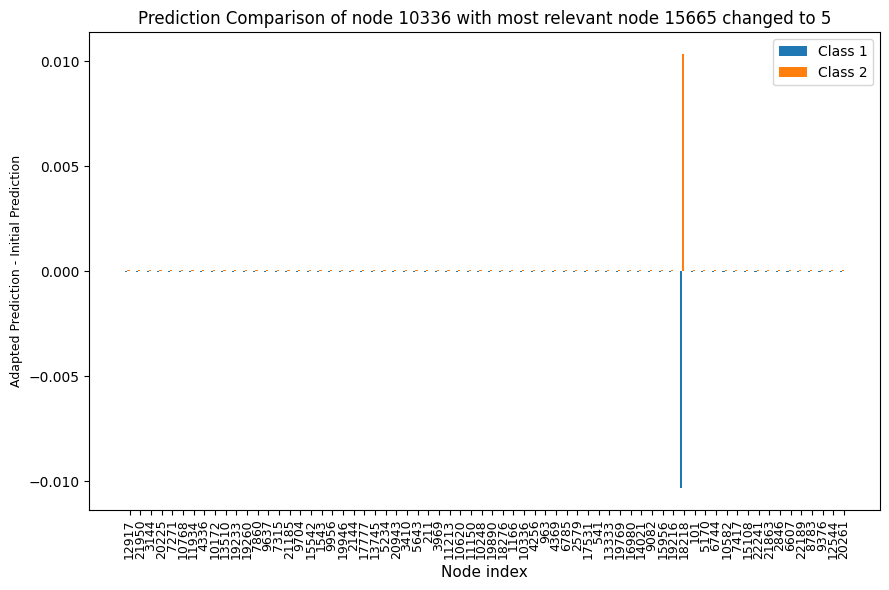

1
pred_after10336adapt_tensor([    0, 15665])_16.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


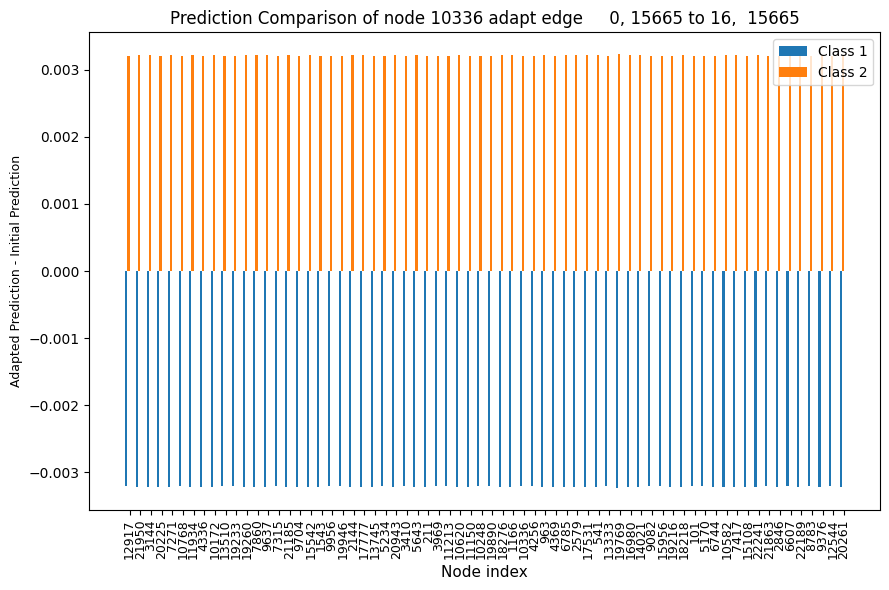

2
pred_after14021adapt_11620_6.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


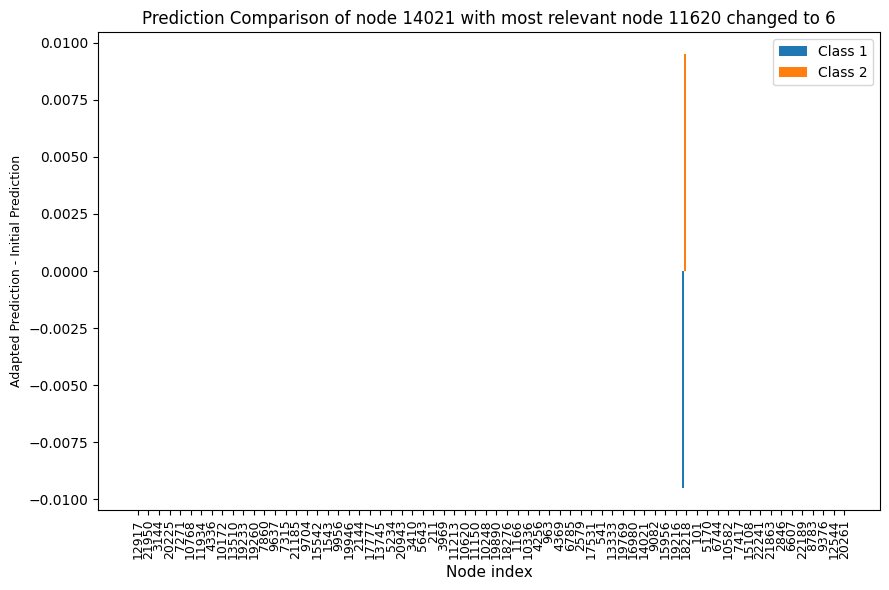

3
pred_after14021adapt_15104_1.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


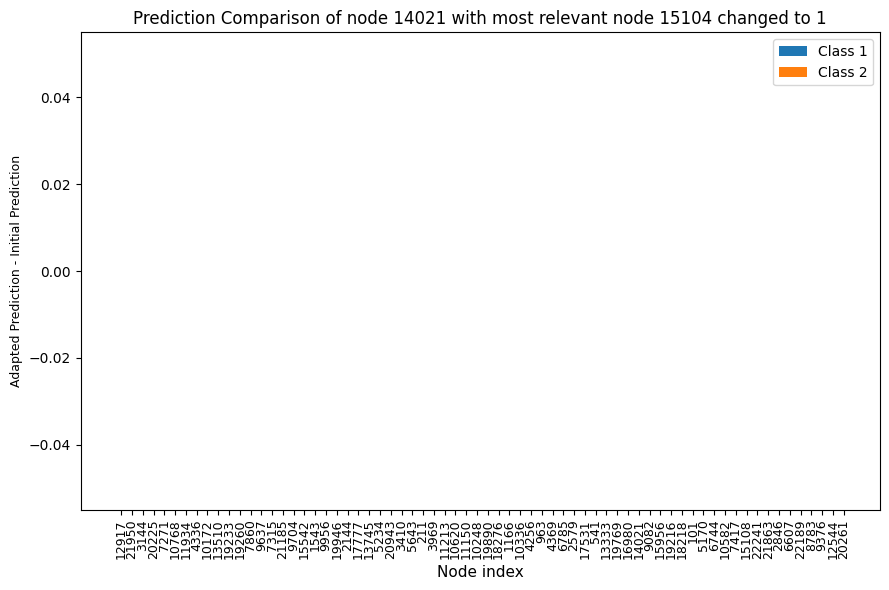

4
pred_after14021adapt_tensor([   10, 11620])_4.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


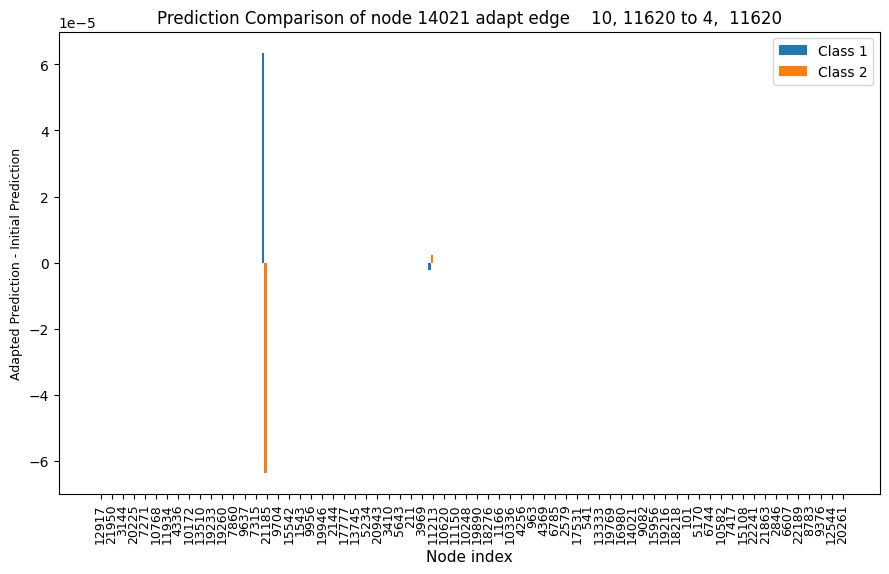

5
pred_after14021adapt_tensor([   18, 15104])_16.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


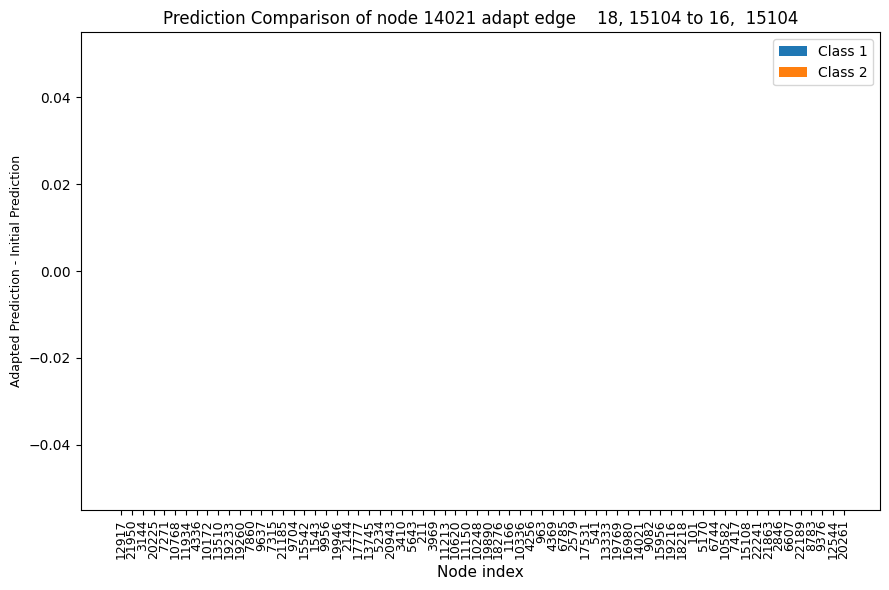

6
pred_after15542adapt_3985_14.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


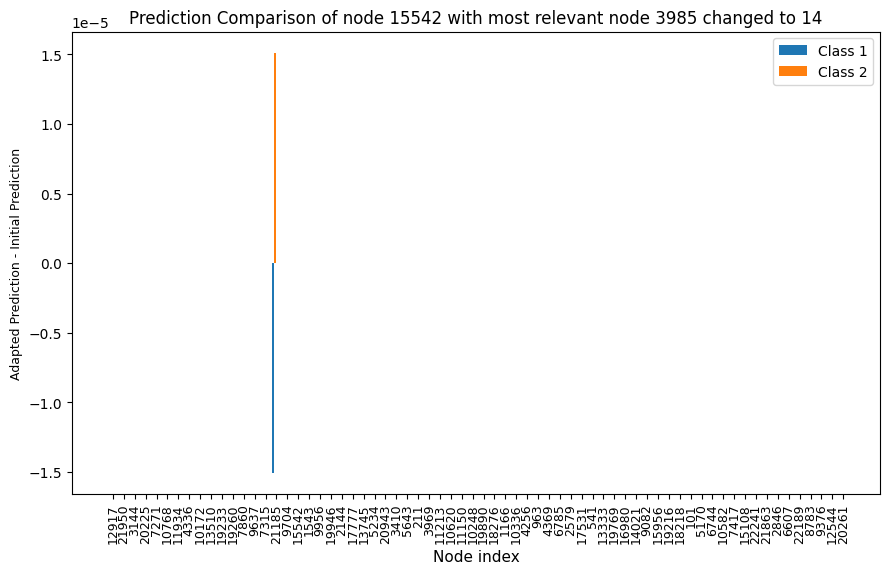

7
pred_after4256adapt_8707_4.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


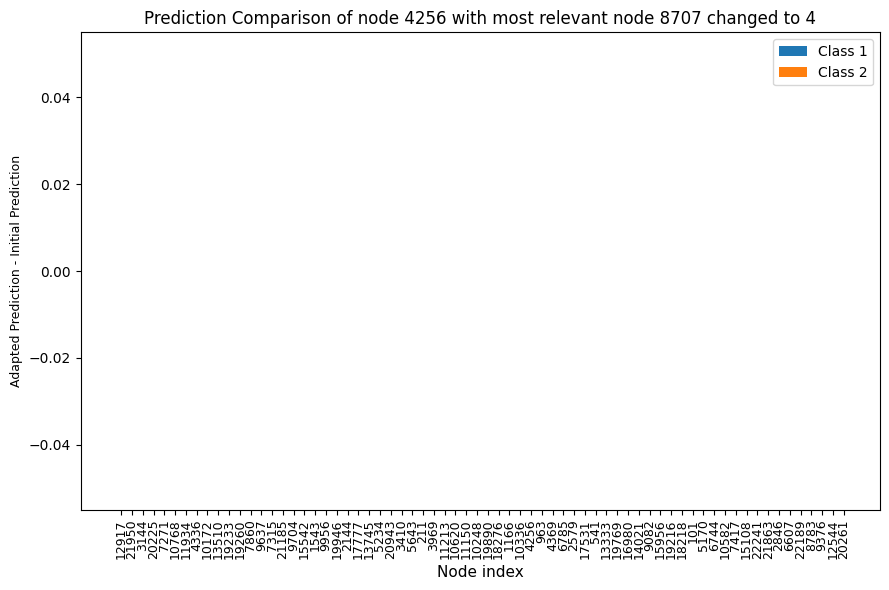

8
pred_after4256adapt_tensor([  18, 8707])_13.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


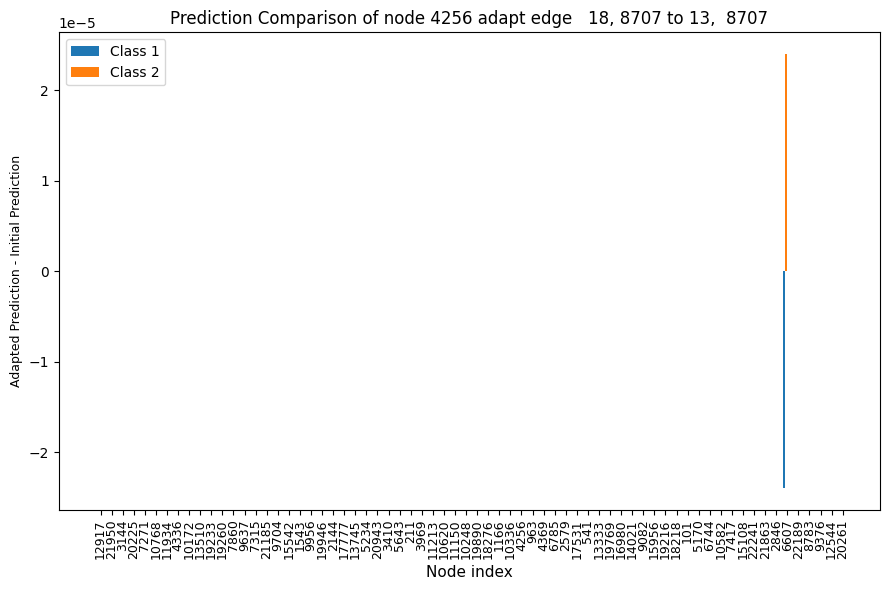

9
pred_after6607adapt_tensor([    0, 15665])_17.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


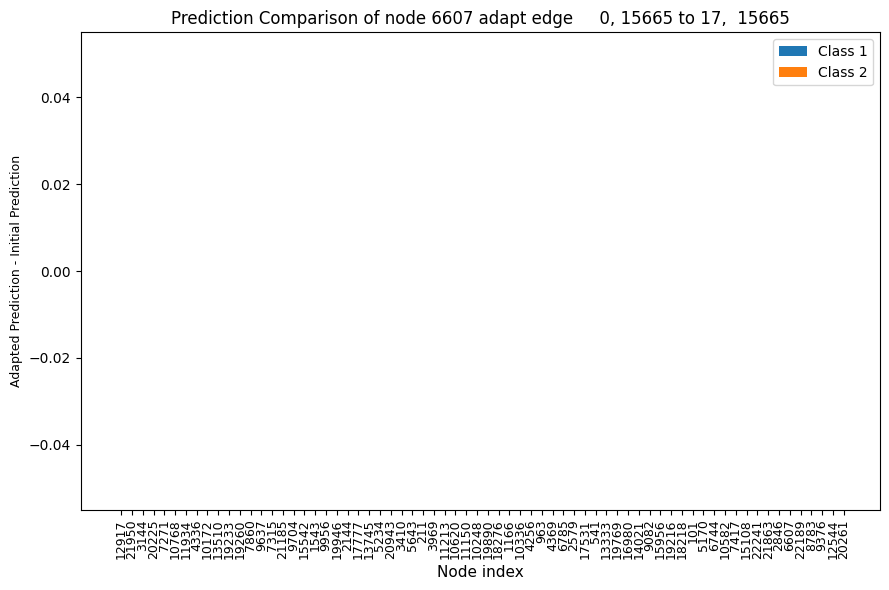

10
pred_after8783adapt_18185_16.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


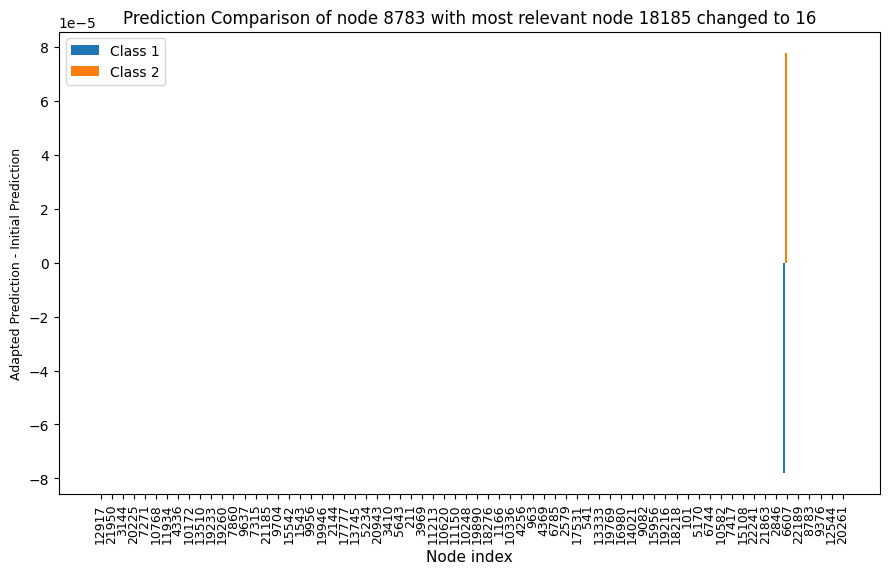

11
pred_after8783adapt_tensor([   18, 18185])_13.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


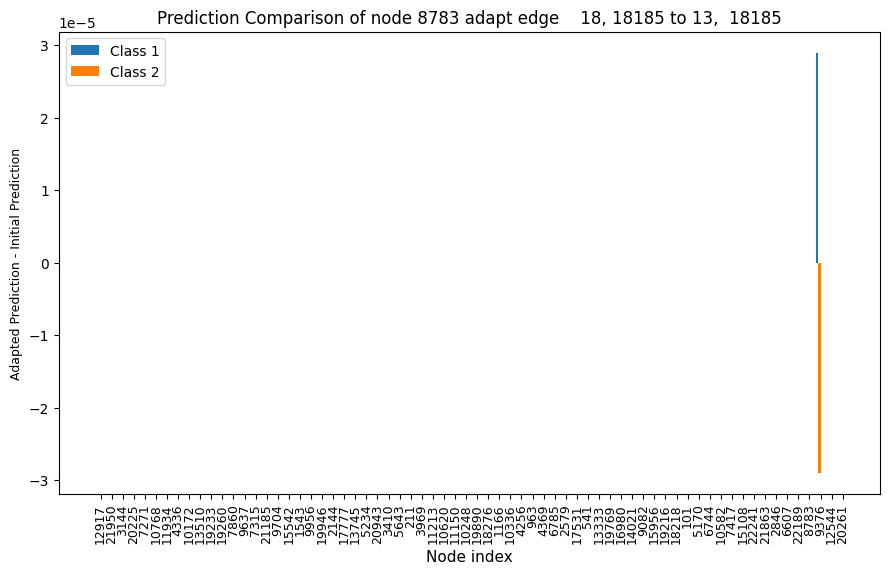

In [43]:
path = 'out/MUTAG/RGCN_no_emb/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=9)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

In [9]:
csv[2]

,Unnamed: 0,Unnamed: 1,rel_nodes_new,rel_edges_new,max_nodes_new,pos_max_nodes_new,min_nodes_new,pos_min_nodes_new,max_edges_new,pos_max_edges_new,min_edges_new,pos_min_edges_new
0,32,"tensor(2534, device='cuda:7')","tensor([0.0000e+00, 2.2471e-07, 0.0000e+00, ....","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",1.829980,1849,-1.214575,1860,1.672034,"tensor([[ 0, 1849]])",-1.201397,"tensor([[ 27, 1860]])"
1,35,"tensor(787, device='cuda:7')","tensor([0.0000e+00, 2.2130e-07, 0.0000e+00, ....","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",1.778304,1849,-0.722574,1860,1.619033,"tensor([[ 0, 1849]])",-0.702185,"tensor([[ 27, 1860]])"
2,19,"tensor(2170, device='cuda:7')","tensor([0.0000e+00, 2.1091e-07, 0.0000e+00, ....","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",1.296898,1849,-1.153915,1226,1.153903,"tensor([[ 0, 1849]])",-1.082457,"tensor([[ 27, 1226]])"


#### Prediction changed from working group 0 to working group 2.

In [11]:
edge_index_plus = files[0]
edge_type_plus = files[1]
edges_list = files[2]
i2n = files[3]
i2r = files[4]
test_idx = files[5]

NameError: name 'files' is not defined

In [12]:
large_after_nodes = csv[0]
large_after_edges = csv[1]
edges = csv[2]
nodes = csv[3]
small_after_nodes = csv[4]
small_after_edges = csv[5]

# Auswertung Relevanzen
#### Average relevance nodes

In [23]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'
dist = 'out/MUTAG/RGCN_emb/DistMult/relevances/'
transe = 'out/MUTAG/RGCN_emb/TransE/relevances/'
transh = 'out/MUTAG/RGCN_emb/TransH/relevances/'
list_paths = [path,dist,transe,transh]
fil = os.listdir(path)
dist2 = os.listdir(dist)
transe2 = os.listdir(transe)
transh2 = os.listdir(transh)
rel_before = [file for file in fil if file.startswith("relevances_node_")]
rel_bef_dist = [file for file in dist2 if file.startswith("relevances_node_")]
rel_bef_transe = [file for file in transe2 if file.startswith("relevances_node_")]
rel_bef_transh = [file for file in transh2 if file.startswith("relevances_node_")]
count_path= 0
for l in [rel_before,rel_bef_dist,rel_bef_transe,rel_bef_transh]:
    path2 = list_paths[count_path]
    count_path += 1
    print('######',path2,'######')
    mean_rel_ges = 0 
    count_zero_ges = 0
    count_positive_ges = 0
    count_negative_ges = 0 
    mean_positive = 0
    mean_negative = 0
    max_positive = 0
    max_negative = 0
    count = 0
    #print(path2)
    for rel in l:
        #print(rel)
        #print(path2)
        rb = torch.load(path2 + rel)
        rb_non_zero = rb[rb != 0]
        rb_count_zero = rb[rb == 0]
        mean_rel= rb_non_zero.mean(axis=0)
        rb_count_positive = rb[rb > 0]
        rb_count_negative = rb[rb < 0]
        mean_rel_ges += mean_rel
        count_zero_ges += len(rb_count_zero)
        count_positive_ges += len(rb_count_positive)
        count_negative_ges += len(rb_count_negative)
        count += 1
        mean_positive += rb_count_positive.mean(axis=0)
        if len(rb_count_negative) != 0:
            mean_negative += rb_count_negative.mean(axis=0)
        if int(rb_count_positive.max(axis=0)[0]) > max_positive:
            max_positive =int( rb_count_positive.max(axis=0)[0])
        if len(rb_count_negative) != 0:
            if int(rb_count_negative.min(axis=0)[0]) < max_negative:
                max_negative = int(rb_count_negative.min(axis=0)[0])
        else:
            max_negative = 0
    mean_positive_ges = mean_positive / count
    mean_negative_ges = mean_negative / count
    percentage_zero =   count_zero_ges / (len(rb)* len(l))
    percentage_positive = count_positive_ges / (len(rb)* len(l))
    percentage_negative = count_negative_ges / (len(rb)* len(l))
    mean_rel_ges = mean_rel_ges / count
    print('Average_relevance without zero: ',mean_rel_ges, '\n',
            'Proportion 0 relevance: ', percentage_zero, '\n',
            'Proportion positive relevance: ', percentage_positive, '\n',
            'Proportion negative relevance: ',percentage_negative, '\n',
            'Average positive relevance: ', mean_positive_ges, '\n',
            'Average negative relevance: ',mean_negative_ges, '\n',
            'Max positive relevance: ', max_positive, '\n',
            'Max negative relevance: ', max_negative, '\n',)

###### out/MUTAG/RGCN_no_emb/relevances/ ######
Average_relevance without zero:  tensor(0.0023, grad_fn=<DivBackward0>) 
 Proportion 0 relevance:  0.9802644971031891 
 Proportion positive relevance:  0.010039015606242497 
 Proportion negative relevance:  0.009696487290568401 
 Average positive relevance:  tensor(0.0111, grad_fn=<DivBackward0>) 
 Average negative relevance:  tensor(-0.0068, grad_fn=<DivBackward0>) 
 Max positive relevance:  4 
 Max negative relevance:  -3 

###### out/MUTAG/RGCN_emb/DistMult/relevances/ ######
Average_relevance without zero:  tensor(0.0023, grad_fn=<DivBackward0>) 
 Proportion 0 relevance:  0.9802644971031891 
 Proportion positive relevance:  0.010502896810898272 
 Proportion negative relevance:  0.009232606085912625 
 Average positive relevance:  tensor(0.0095, grad_fn=<DivBackward0>) 
 Average negative relevance:  tensor(-0.0059, grad_fn=<DivBackward0>) 
 Max positive relevance:  13 
 Max negative relevance:  -14 

###### out/MUTAG/RGCN_emb/TransE/rel

## Relevanzverteilung vor/nach Tausch Kante

relevances_after_node_node_10336adapt_15665_5.pt 10336 15665 relevances_node_10336.pt


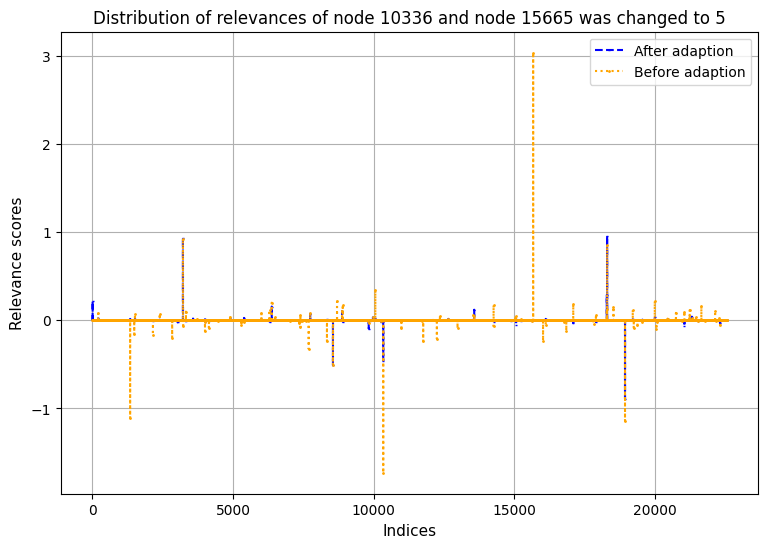

relevances_after_node_node_14021adapt_11620_6.pt 14021 11620 relevances_node_14021.pt


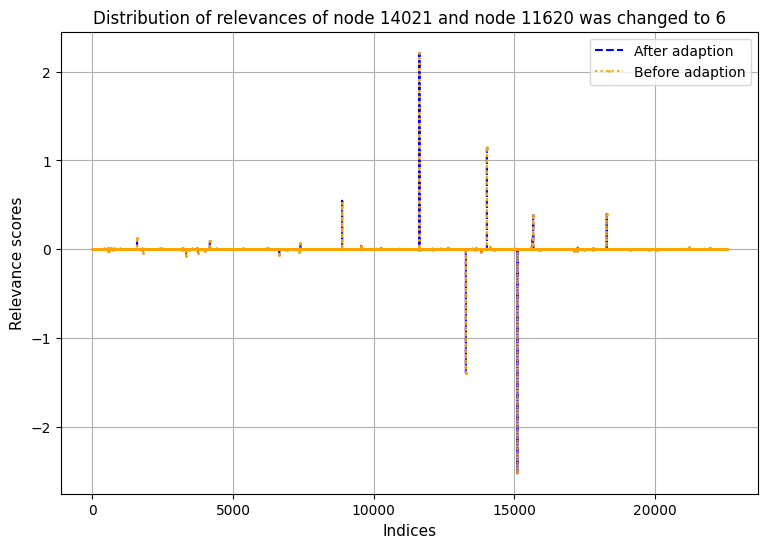

relevances_after_node_node_14021adapt_15104_1.pt 14021 15104 relevances_node_14021.pt


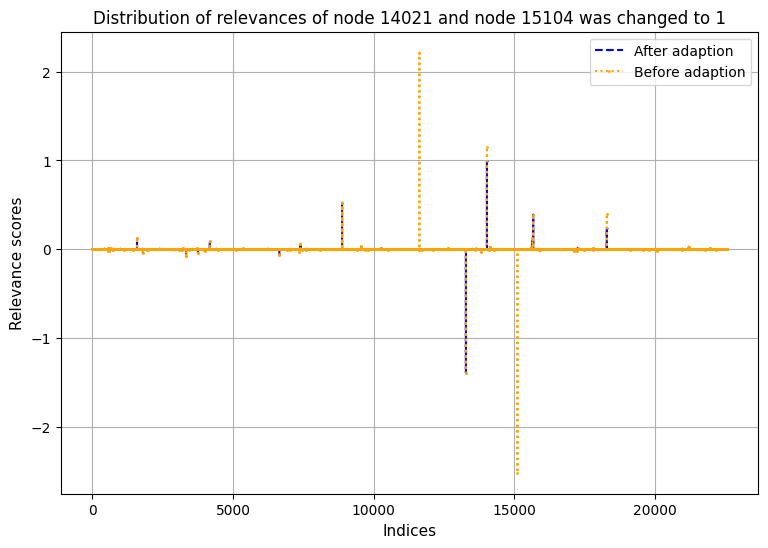

relevances_after_node_node_15542adapt_3985_14.pt 15542 3985 relevances_node_15542.pt


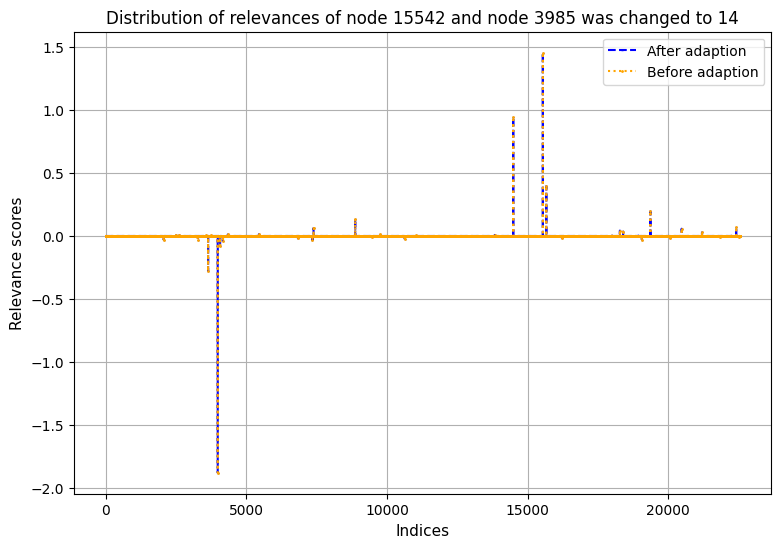

relevances_after_node_node_4256adapt_8707_4.pt 4256 8707 relevances_node_4256.pt


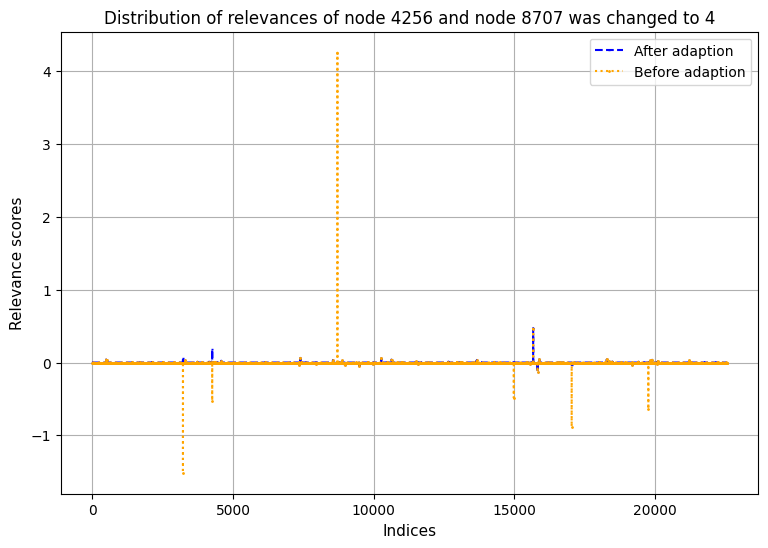

relevances_after_node_node_8783adapt_18185_16.pt 8783 18185 relevances_node_8783.pt


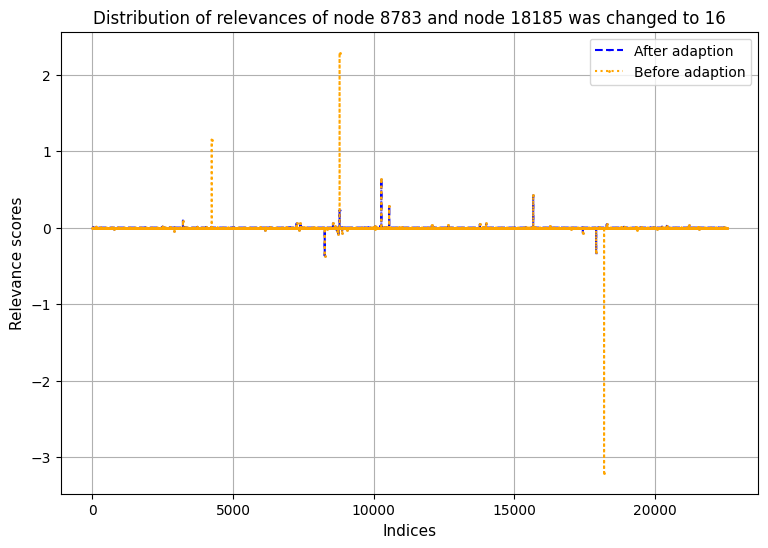

In [14]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('node_node_')[1].split('adapt')[0]
    adapt_node = rel.split('adapt_')[1].split('_')[0]
    to_node = rel.split('adapt_')[1].split('_')[1].split('.')[0]
    for rel2 in rel_before:
        

        if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            #ra = np.sort(ra)
            #rb = np.sort(rb)
            #Create an array of indices for the sorted data
            indices = np.arange(1, len(ra) + 1)

            # Create a line plot with different line styles and markers
            plt.figure(figsize=(9, 6))
            plt.plot(indices, ra, color='blue', linestyle='--', marker='_', markersize=2, label='After adaption')
            plt.plot(indices, rb, color='orange', linestyle='dotted', marker='.', markersize=2, label='Before adaption')

            plt.xlabel('Indices', fontsize=11)
            plt.ylabel('Relevance scores', fontsize=11)
            plt.title('Distribution of relevances of node {} and node {} was changed to {}'.format(node_name,adapt_node,to_node))
            plt.legend()
            plt.grid(True)
            plt.show()



In [15]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'

fil = os.listdir(path)
rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]

relevances_after_node_node_10336adapt_15665_5.pt 10336 15665 relevances_node_10336.pt
1.2724435 -3.0368354
(array([ 1339,  7685, 10054, 10336, 15665], dtype=int64),)


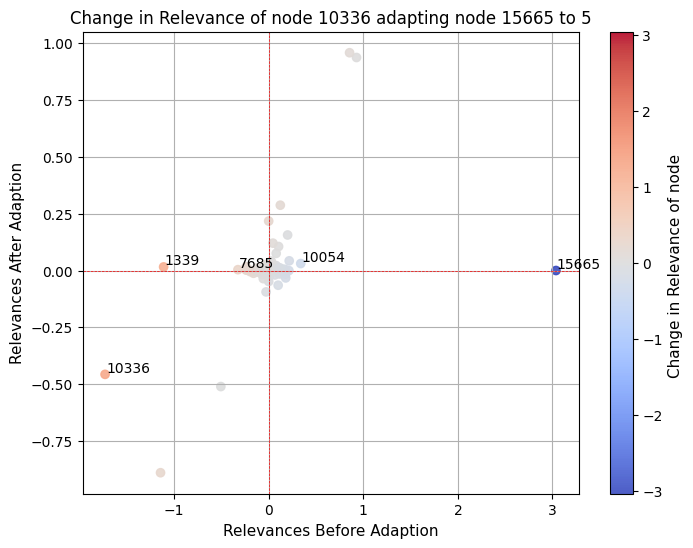

relevances_after_node_node_14021adapt_11620_6.pt 14021 11620 relevances_node_14021.pt
0.021302283 -0.01516211
(array([], dtype=int64),)
relevances_after_node_node_14021adapt_15104_1.pt 14021 15104 relevances_node_14021.pt
2.5208323 -2.2083244
(array([11620, 15104], dtype=int64),)


<Figure size 800x600 with 0 Axes>

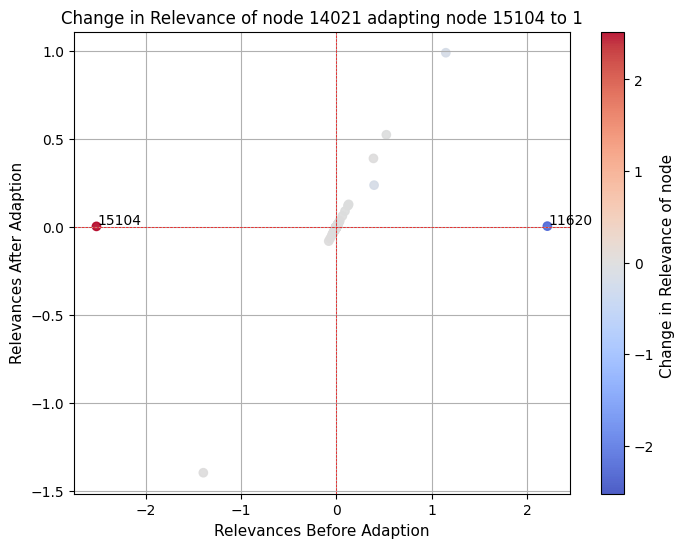

relevances_after_node_node_15542adapt_3985_14.pt 15542 3985 relevances_node_15542.pt
relevances_after_node_node_4256adapt_8707_4.pt 4256 8707 relevances_node_4256.pt
1.5797445 -4.2678533
(array([ 3216,  4256,  8707, 14975, 17033, 19759], dtype=int64),)


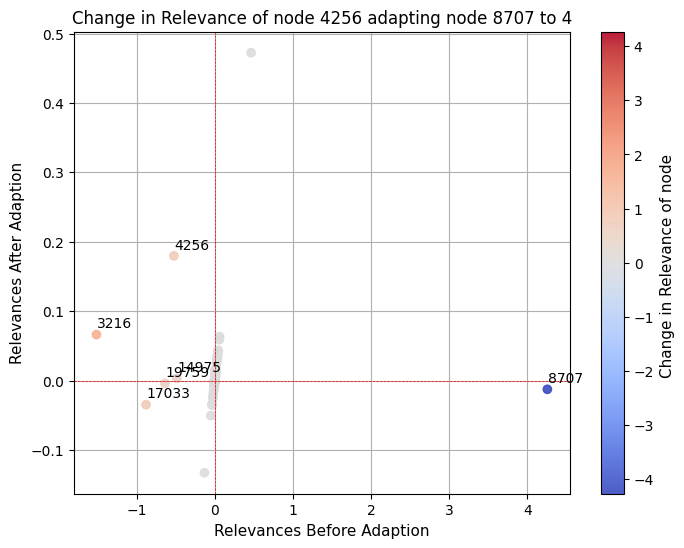

relevances_after_node_node_8783adapt_18185_16.pt 8783 18185 relevances_node_8783.pt
3.2031956 -2.0567822
(array([ 4237,  8783, 18185], dtype=int64),)


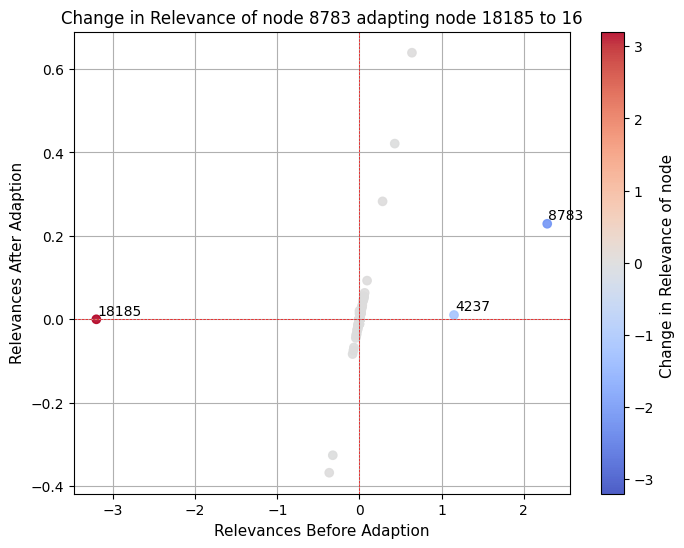

In [16]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('node_node_')[1].split('adapt')[0]
    adapt_node = rel.split('adapt_')[1].split('_')[0]
    to_node = rel.split('adapt_')[1].split('_')[1].split('.')[0]
    for rel2 in rel_before:
        

        if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = ra - rb
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 0.3

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            print(nonzero_indices)
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                rb,
                ra,
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            # Add index labels for non-zero relevances
            label_offset = 0.01
            for idx in nonzero_indices[0]:
                plt.text(
                    rb[idx] + label_offset,
                    ra[idx] + label_offset,
                    str(idx),
                    fontsize=10
                )

            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting node {} to {}'.format(node_name, adapt_node, to_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance of node ', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

## Edges

relevances_after_edge_edge_10336_15665adapt_tensor([    0, 15665])_16.pt 10336  15665 relevances_edge_10336.pt
[[ 9.30510998e-01  9.28385794e-01  3.21600000e+03  0.00000000e+00]
 [-1.98655576e-02 -1.98201835e-02  3.98500000e+03  0.00000000e+00]
 [-3.80265992e-04 -3.79392412e-04  4.23700000e+03  0.00000000e+00]
 ...
 [-4.61991644e-04 -4.60936571e-04  2.21310000e+04  1.80000000e+01]
 [ 9.84588638e-04  9.82340309e-04  2.22690000e+04  1.80000000e+01]
 [-1.85378809e-02 -1.84955485e-02  2.23110000e+04  1.80000000e+01]]
-4.4307216739980504e-07
0.006475925445556641 -0.0029975175857543945
non : 1


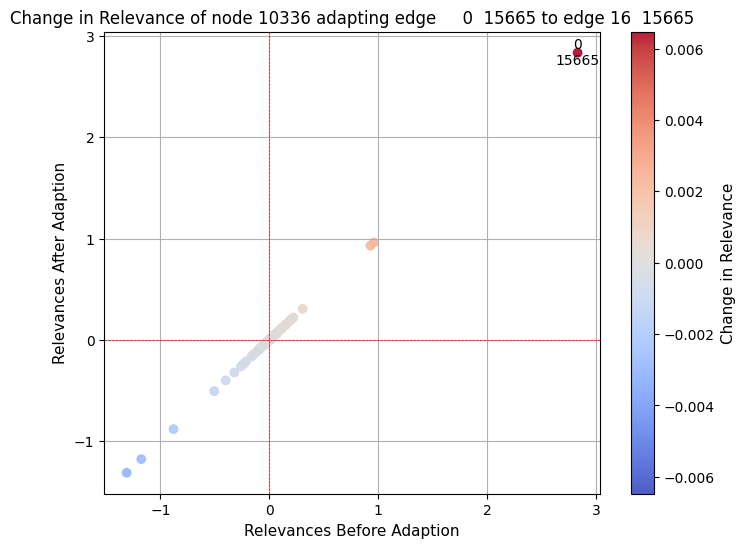

relevances_after_edge_edge_14021_11620adapt_tensor([   10, 11620])_4.pt 14021  11620 relevances_edge_14021.pt
[[ 6.65999576e-03  6.65995572e-03  4.23000000e+02  0.00000000e+00]
 [ 3.79609549e-03  3.79607175e-03  7.79000000e+02  0.00000000e+00]
 [ 1.24620236e-02  1.24619473e-02  3.21600000e+03  0.00000000e+00]
 ...
 [-1.12230156e-03 -1.12229458e-03  2.20690000e+04  1.80000000e+01]
 [ 1.64422847e-04  1.64421799e-04  2.23090000e+04  1.80000000e+01]
 [-4.67424601e-04 -4.67421720e-04  2.24180000e+04  1.80000000e+01]]
4.5442448026733473e-07
0.04782748222351074 -0.04188060760498047
non : 1


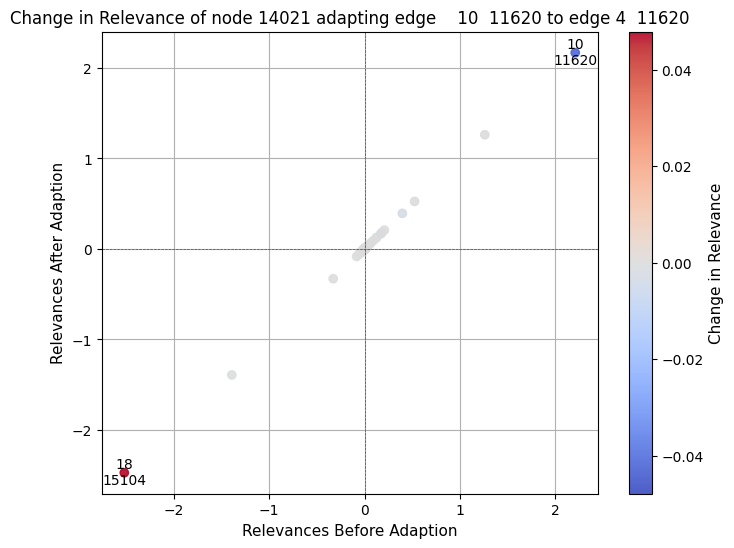

relevances_after_edge_edge_14021_15104adapt_tensor([   18, 15104])_16.pt 14021  15104 relevances_edge_14021.pt
[[ 6.65993663e-03  6.65995572e-03  4.23000000e+02  0.00000000e+00]
 [ 3.79606057e-03  3.79607175e-03  7.79000000e+02  0.00000000e+00]
 [ 1.24619100e-02  1.24619473e-02  3.21600000e+03  0.00000000e+00]
 ...
 [-1.12229143e-03 -1.12229458e-03  2.20690000e+04  1.80000000e+01]
 [ 1.64421363e-04  1.64421799e-04  2.23090000e+04  1.80000000e+01]
 [-4.67420323e-04 -4.67421720e-04  2.24180000e+04  1.80000000e+01]]
1.2799700925825164e-06
0.017071008682250977 -0.01950240135192871
non : 1


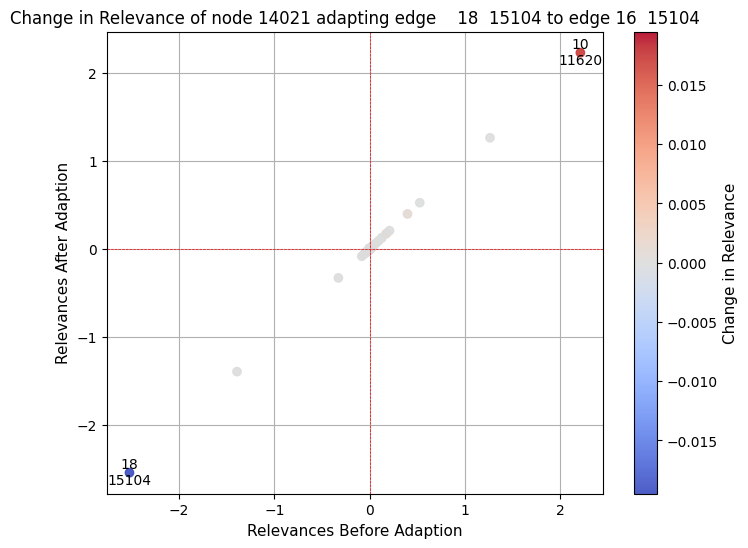

relevances_after_edge_edge_4256_8707adapt_tensor([  18, 8707])_13.pt 4256  8707 relevances_edge_4256.pt
[[ 3.20163518e-02  3.20163146e-02  5.21000000e+02  0.00000000e+00]
 [-1.51306343e+00 -1.51341939e+00  3.21600000e+03  0.00000000e+00]
 [ 1.30713489e-02  1.30713284e-02  4.23700000e+03  0.00000000e+00]
 ...
 [-3.33267264e-03 -3.33266845e-03  1.97590000e+04  1.80000000e+01]
 [ 3.98403965e-02  3.98403369e-02  1.98930000e+04  1.80000000e+01]
 [ 1.39752366e-02  1.39752161e-02  2.00950000e+04  1.80000000e+01]]
-1.6318281268468127e-06
0.0003559589385986328 -0.0008668899536132812
non : 1
relevances_after_edge_edge_6607_15665adapt_tensor([    0, 15665])_17.pt 6607  15665 relevances_edge_6607.pt
[[6.29478600e-03 6.27648737e-03 4.23000000e+02 0.00000000e+00]
 [2.12935242e-03 2.12316285e-03 5.21000000e+02 0.00000000e+00]
 [1.11003011e-01 1.10680364e-01 3.21600000e+03 0.00000000e+00]
 ...
 [9.91638750e-03 9.88756306e-03 2.22370000e+04 1.80000000e+01]
 [1.42951997e-03 1.42536499e-03 2.23640000e+04

<Figure size 800x600 with 0 Axes>

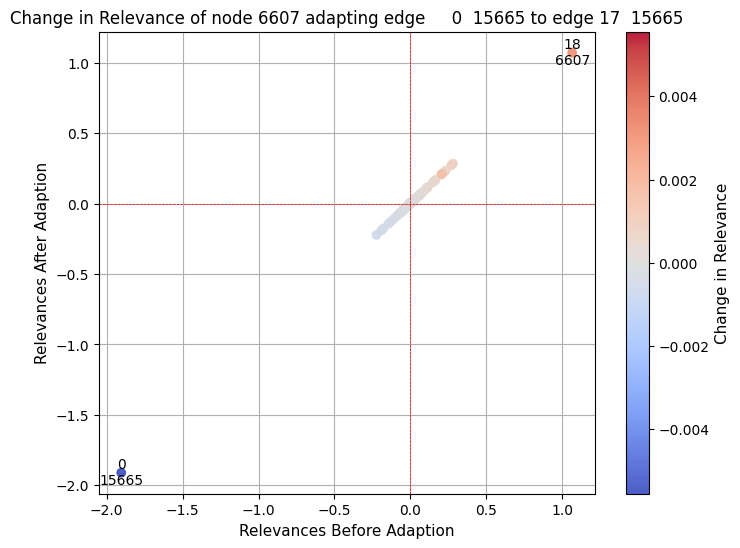

relevances_after_edge_edge_8783_18185adapt_tensor([   18, 18185])_13.pt 8783  18185 relevances_edge_8783.pt
[[-4.46335748e-02 -4.46318723e-02  2.91400000e+03  0.00000000e+00]
 [ 9.27252024e-02  9.27216411e-02  3.21600000e+03  0.00000000e+00]
 [ 6.65601576e-03  6.65575918e-03  3.29800000e+03  0.00000000e+00]
 ...
 [-1.41933071e-03 -1.41927612e-03  2.18800000e+04  1.80000000e+01]
 [ 1.38992118e-03  1.38986716e-03  2.20580000e+04  1.80000000e+01]
 [ 4.17486811e-03  4.17470746e-03  2.24630000e+04  1.80000000e+01]]
-2.2602507669944316e-06
0.020642518997192383 -0.013094425201416016
non : 1


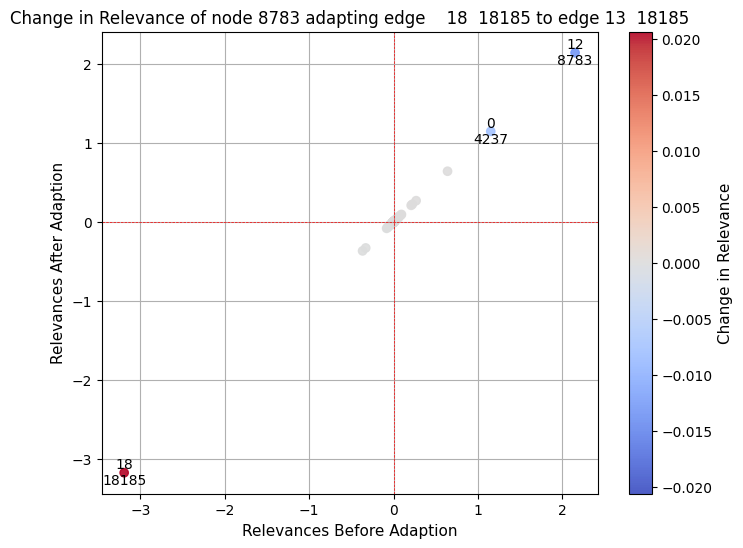

In [49]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_edge_edge_")]
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_edge_')[1].split('_')[0]
    adapt_edge_name = rel.split('[')[1].split(',')[0]
    to_edge = rel.split('_')[-1].split('.')[0]
    adapt_node = rel.split(',')[-1].split(']')[0]
    XX,YY = np.meshgrid(np.arange(ra.shape[1]),np.arange(ra.shape[0]))
    
    for rel2 in rel_before:
        

         if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            table = np.vstack((ra.ravel(),rb.ravel(),XX.ravel(),YY.ravel())).T
            table = table[table[:,0] != 0]
            print(table)
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = table[:,0] - table[:,1]
            print(change.sum())
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 0.003

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            print('non :',len(nonzero_indices))
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                table[:,1],
                table[:,0],
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            

            # Add index labels for each point
            for i, (idx1, idx2) in enumerate(zip(table[:,3][nonzero_indices], table[:,2][nonzero_indices])):
                label = f'{int(idx1)}\n{int(idx2)}'  # Combine the two indices into one label
                plt.text(table[:,1][nonzero_indices][i], table[:,0][nonzero_indices][i], label, fontsize=10, ha='center', va='center')



            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting edge {} {} to edge {} {}'.format(node_name, adapt_edge_name, adapt_node, to_edge, adapt_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

# RGAT

### Auswertung Relevanzen

In [22]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'
dist = 'out/MUTAG/RGAT_emb/DistMult/relevances/'
transe = 'out/MUTAG/RGAT_emb/TransE/relevances/'
transh = 'out/MUTAG/RGAT_emb/TransH/relevances/'
list_paths = [path,dist,transe,transh]
fil = os.listdir(path)
dist2 = os.listdir(dist)
transe2 = os.listdir(transe)
transh2 = os.listdir(transh)
rel_before = [file for file in fil if file.startswith("relevances_node_")]
rel_bef_dist = [file for file in dist2 if file.startswith("relevances_node_")]
rel_bef_transe = [file for file in transe2 if file.startswith("relevances_node_")]
rel_bef_transh = [file for file in transh2 if file.startswith("relevances_node_")]
count_path= 0
for l in [rel_before,rel_bef_dist,rel_bef_transe,rel_bef_transh]:
    path2 = list_paths[count_path]
    count_path += 1
    print('######',path2,'######')
    mean_rel_ges = 0 
    count_zero_ges = 0
    count_positive_ges = 0
    count_negative_ges = 0 
    mean_positive = 0
    mean_negative = 0
    max_positive = 0
    max_negative = 0
    count = 0
    #print(path2)
    for rel in l:
        #print(rel)
        #print(path2)
        rb = torch.load(path2 + rel)
        rb_non_zero = rb[rb != 0]
        rb_count_zero = rb[rb == 0]
        mean_rel= rb_non_zero.mean(axis=0)
        rb_count_positive = rb[rb > 0]
        rb_count_negative = rb[rb < 0]
        mean_rel_ges += mean_rel
        count_zero_ges += len(rb_count_zero)
        count_positive_ges += len(rb_count_positive)
        count_negative_ges += len(rb_count_negative)
        count += 1
        mean_positive += rb_count_positive.mean(axis=0)
        if len(rb_count_negative) != 0:
            mean_negative += rb_count_negative.mean(axis=0)
        if int(rb_count_positive.max(axis=0)[0]) > max_positive:
            max_positive =int( rb_count_positive.max(axis=0)[0])
        if len(rb_count_negative) != 0:
            if int(rb_count_negative.min(axis=0)[0]) < max_negative:
                max_negative = int(rb_count_negative.min(axis=0)[0])
        else:
            max_negative = 0
    mean_positive_ges = mean_positive / count
    mean_negative_ges = mean_negative / count
    percentage_zero =   count_zero_ges / (len(rb)* len(l))
    percentage_positive = count_positive_ges / (len(rb)* len(l))
    percentage_negative = count_negative_ges / (len(rb)* len(l))
    mean_rel_ges = mean_rel_ges / count
    print('Average_relevance without zero: ',mean_rel_ges, '\n',
            'Proportion 0 relevance: ', percentage_zero, '\n',
            'Proportion positive relevance: ', percentage_positive, '\n',
            'Proportion negative relevance: ',percentage_negative, '\n',
            'Average positive relevance: ', mean_positive_ges, '\n',
            'Average negative relevance: ',mean_negative_ges, '\n',
            'Max positive relevance: ', max_positive, '\n',
            'Max negative relevance: ', max_negative, '\n',)

###### out/MUTAG/RGAT_no_emb/relevances/ ######
Average_relevance without zero:  tensor(0.0145) 
 Proportion 0 relevance:  0.9960586408476434 
 Proportion positive relevance:  0.002253510099692051 
 Proportion negative relevance:  0.0016878490526645441 
 Average positive relevance:  tensor(0.1026) 
 Average negative relevance:  tensor(-0.0988) 
 Max positive relevance:  7 
 Max negative relevance:  -5 

###### out/MUTAG/RGAT_emb/DistMult/relevances/ ######
Average_relevance without zero:  tensor(0.0145) 
 Proportion 0 relevance:  0.9960586408476434 
 Proportion positive relevance:  0.0023265828070358576 
 Proportion negative relevance:  0.001614776345320737 
 Average positive relevance:  tensor(0.1148) 
 Average negative relevance:  tensor(-0.1112) 
 Max positive relevance:  15 
 Max negative relevance:  -7 

###### out/MUTAG/RGAT_emb/TransE/relevances/ ######
Average_relevance without zero:  tensor(0.0145) 
 Proportion 0 relevance:  0.9960586408476434 
 Proportion positive relevance: 

# RGCN TransE

In [50]:
model = 'TransE'
csv = readallcsvinpath('out/MUTAG/RGCN_emb/')
pred_before = torch.load('out/MUTAG/RGCN_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/MUTAG/RGCN_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://dl-learner.org/carcinogenesis#bond3948
12
0
0
0
0
0
0
0
0
0
0
0
0
12 816 0
[]
0.0


(array([0], dtype=int64), array([68], dtype=int64))

12
0
pred_after10582adapt_3374_17.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


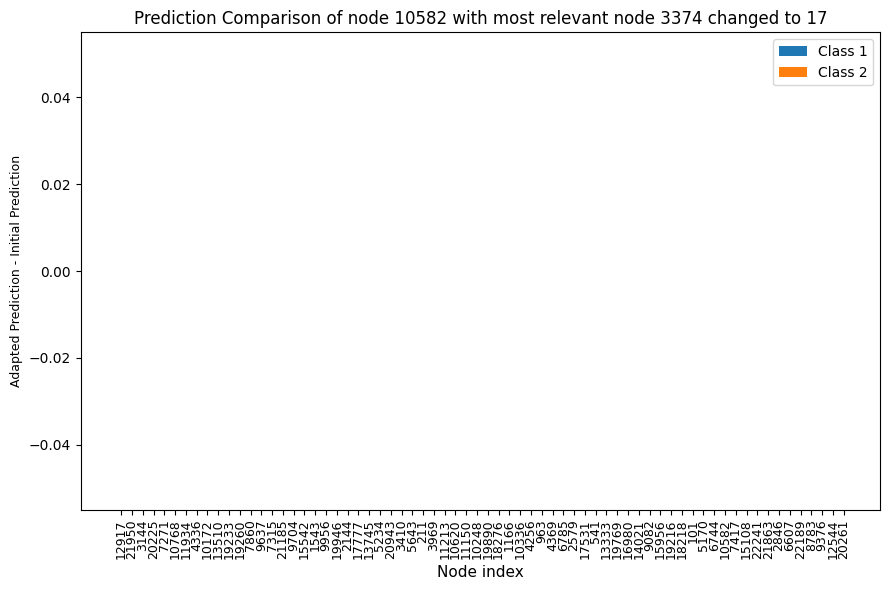

1
pred_after10582adapt_tensor([   0, 3374])_17.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


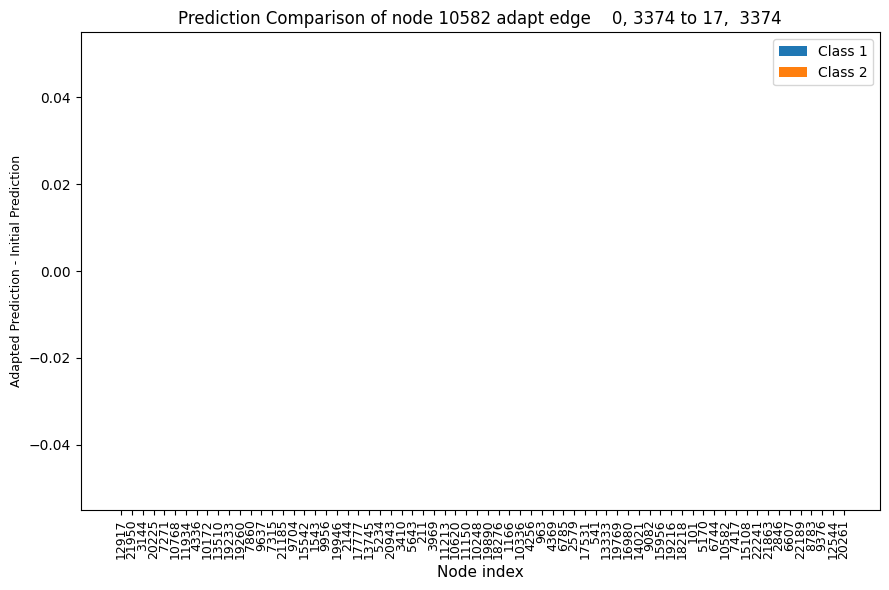

2
pred_after19216adapt_19818_4.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


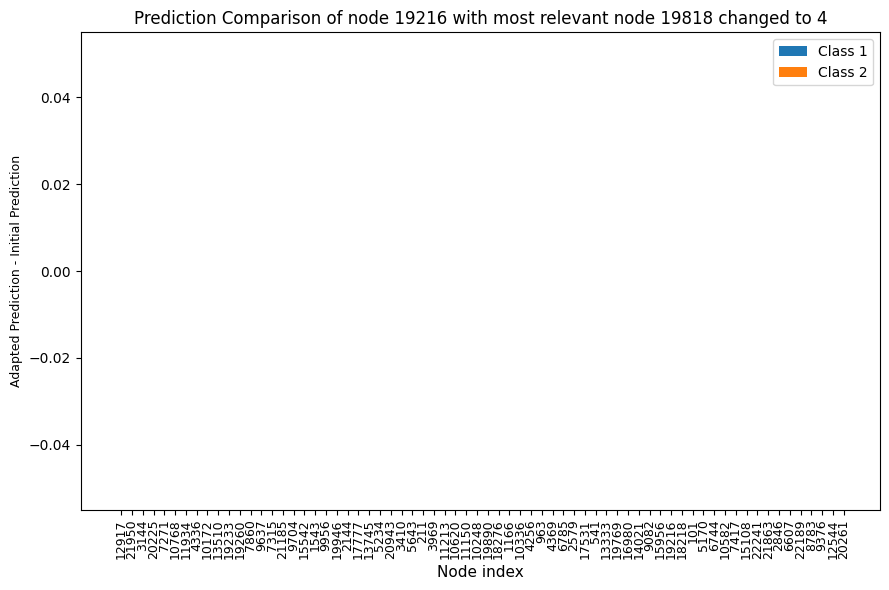

3
pred_after19216adapt_tensor([    0, 19818])_13.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


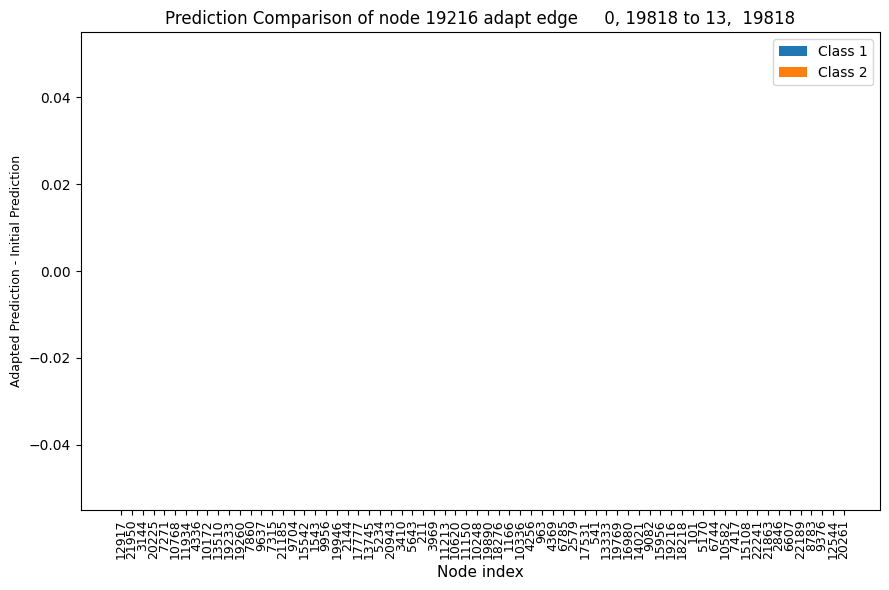

4
pred_after7315adapt_18281_4.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


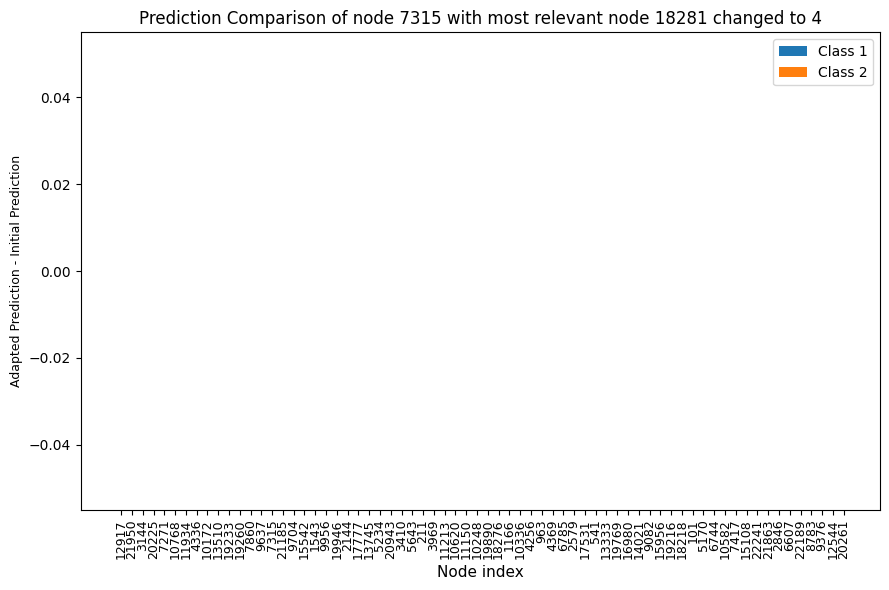

5
pred_after7315adapt_2816_14.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


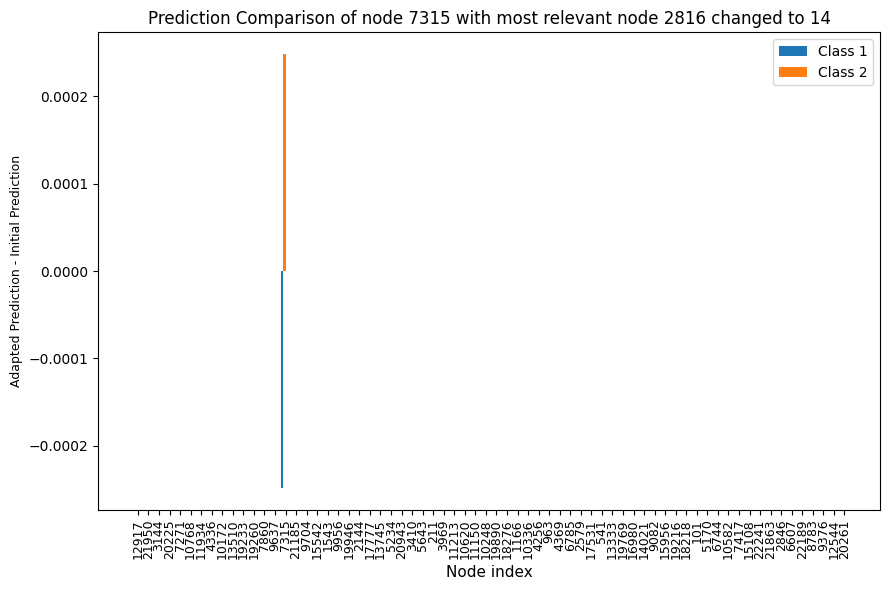

6
pred_after7315adapt_tensor([    0, 18281])_17.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


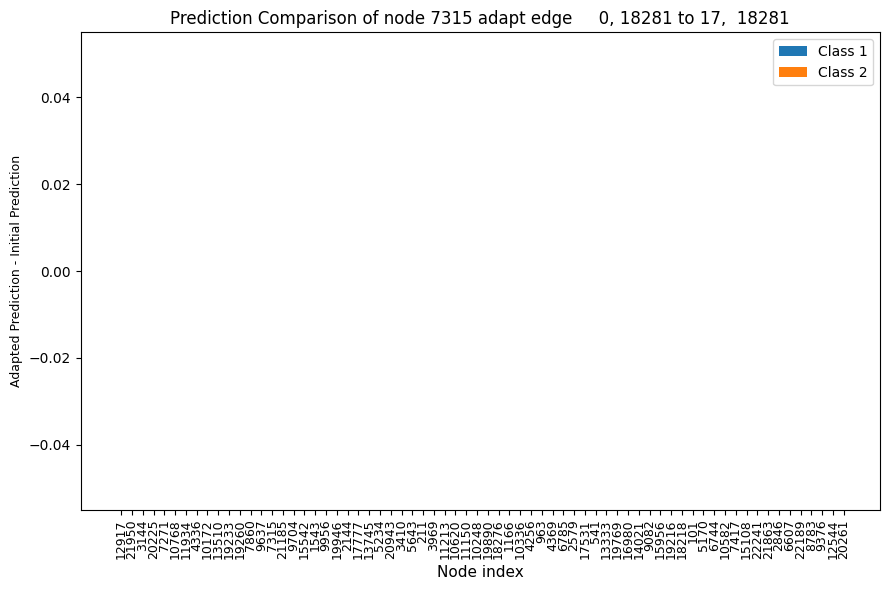

7
pred_after7315adapt_tensor([  10, 2816])_11.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


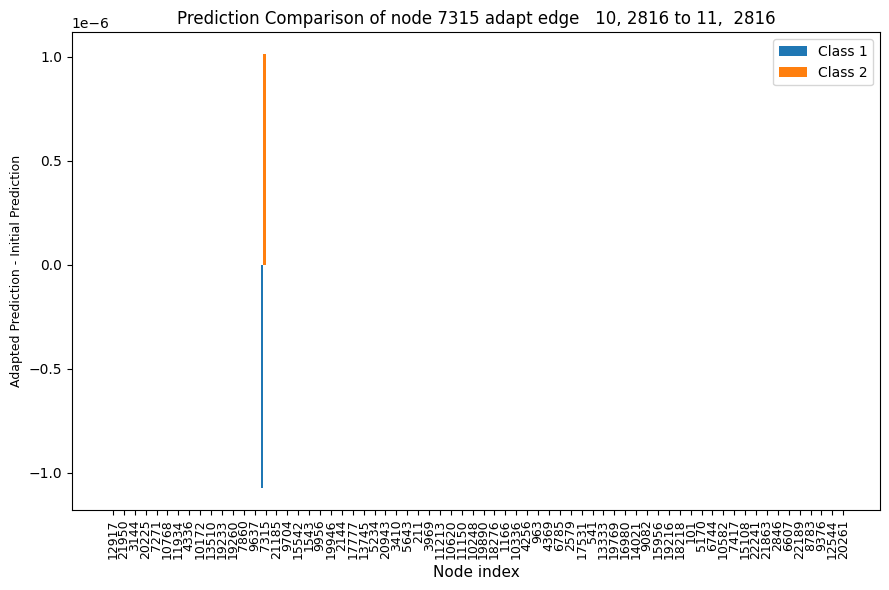

8
pred_after7417adapt_12652_4.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


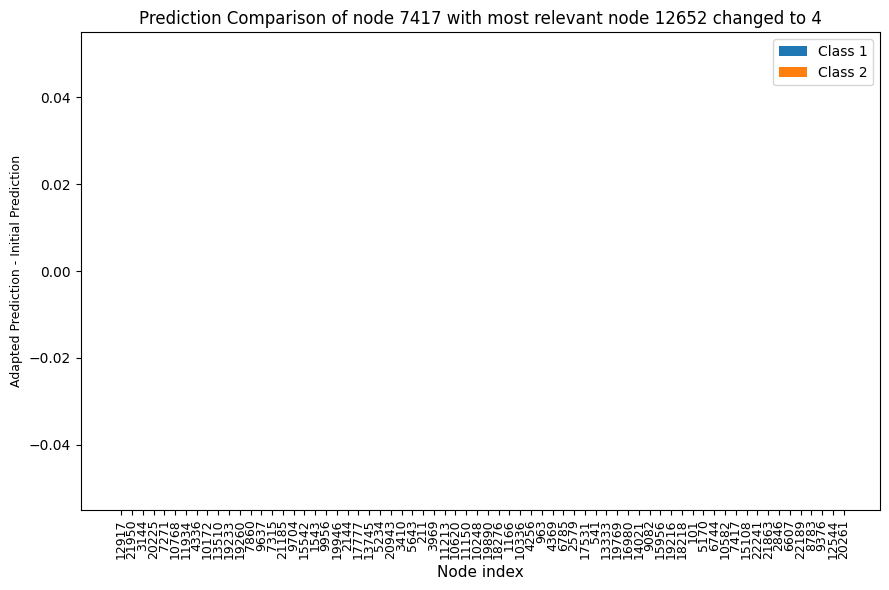

9
pred_after7417adapt_6164_14.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


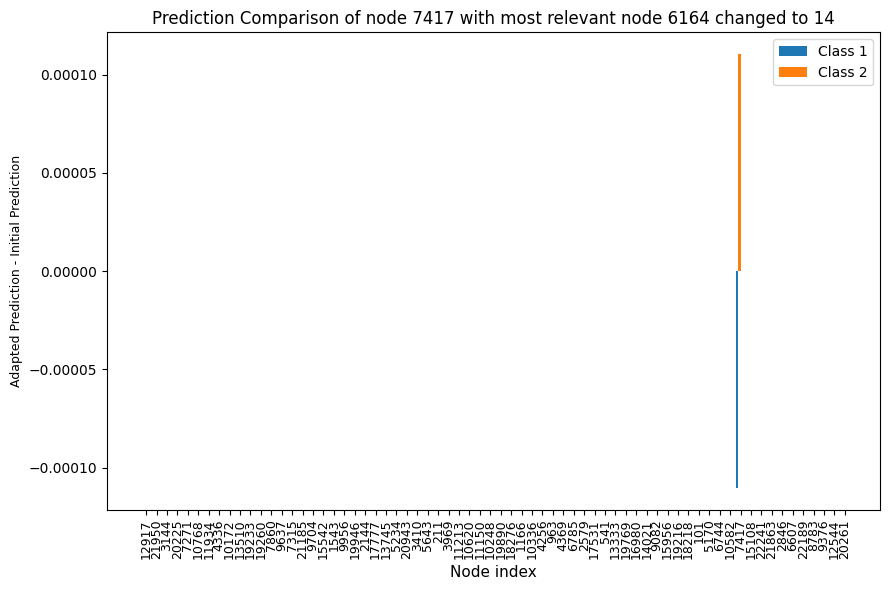

10
pred_after7417adapt_tensor([    0, 12652])_10.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


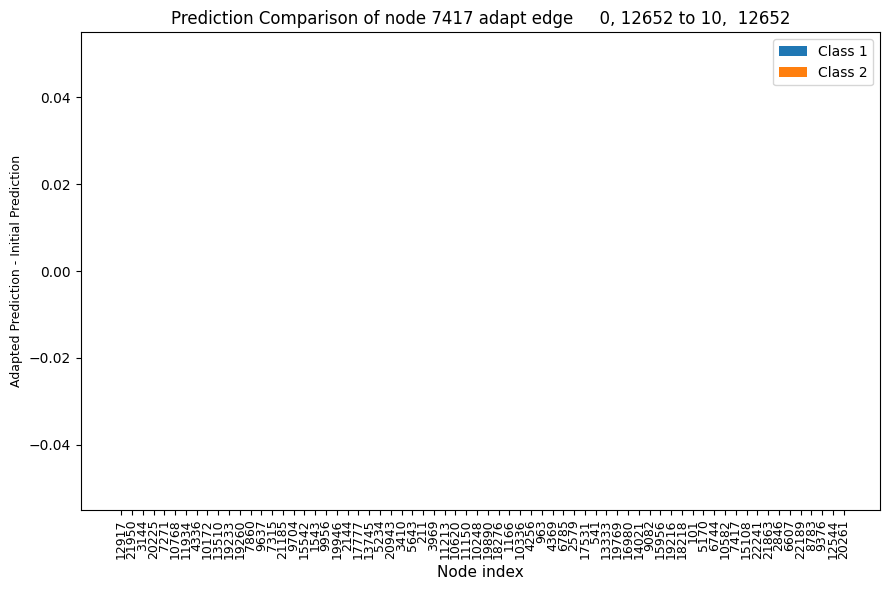

11
pred_after7417adapt_tensor([  18, 6164])_15.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


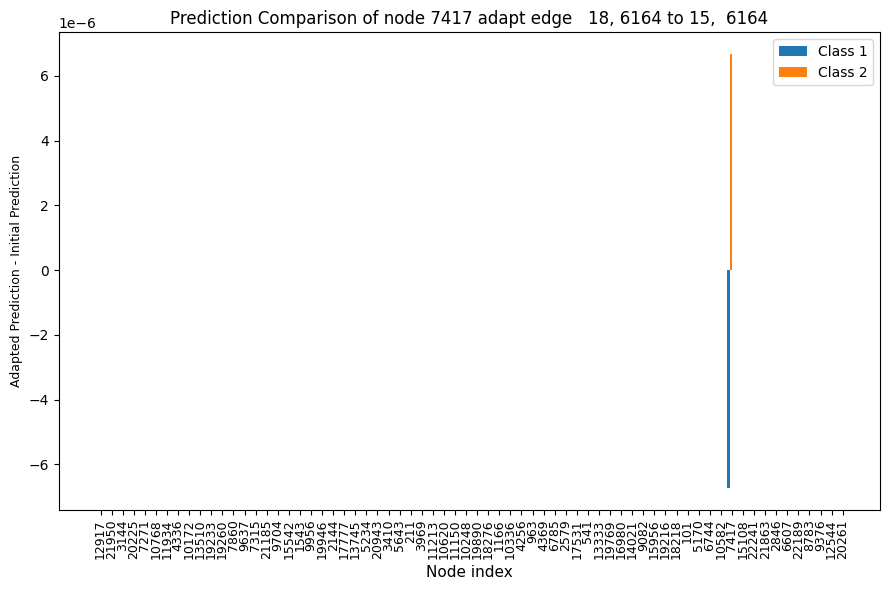

In [51]:
path = 'out/MUTAG/RGCN_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=9)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

#### Edges

relevances_after_edge_edge_18218_15665adapt_tensor([    0, 15665])_4.pt 18218  15665 relevances_edge_18218.pt
[[-2.12711282e-03 -1.97121291e-03  4.23000000e+02  0.00000000e+00]
 [ 3.38400062e-03  3.13597824e-03  5.21000000e+02  0.00000000e+00]
 [-1.44802071e-02 -1.34189017e-02  7.79000000e+02  0.00000000e+00]
 ...
 [-2.47742003e-03 -2.29584333e-03  2.21750000e+04  1.80000000e+01]
 [ 4.08819970e-03  3.78856598e-03  2.22020000e+04  1.80000000e+01]
 [ 1.20318111e-03  1.11499708e-03  2.25310000e+04  1.80000000e+01]]
-4.164917299931403e-07
0.29025959968566895 -0.277019739151001
non : 1


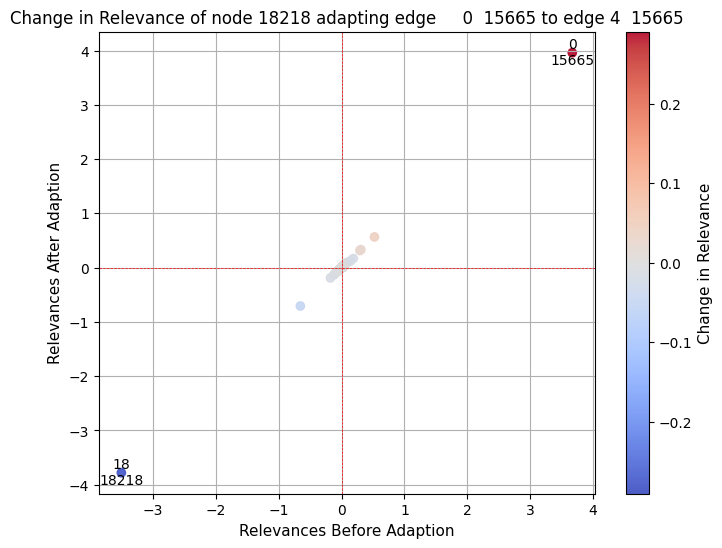

relevances_after_edge_edge_18218_18218adapt_tensor([   18, 18218])_12.pt 18218  18218 relevances_edge_18218.pt
[[-1.94473634e-03 -1.97121291e-03  4.23000000e+02  0.00000000e+00]
 [ 3.09386011e-03  3.13597824e-03  5.21000000e+02  0.00000000e+00]
 [-1.32386722e-02 -1.34189017e-02  7.79000000e+02  0.00000000e+00]
 ...
 [-2.26500770e-03 -2.29584333e-03  2.21750000e+04  1.80000000e+01]
 [ 3.73768155e-03  3.78856598e-03  2.22020000e+04  1.80000000e+01]
 [ 1.10002188e-03  1.11499708e-03  2.25310000e+04  1.80000000e+01]]
-3.487843969196547e-07
0.2721545696258545 -0.2668156623840332
non : 1


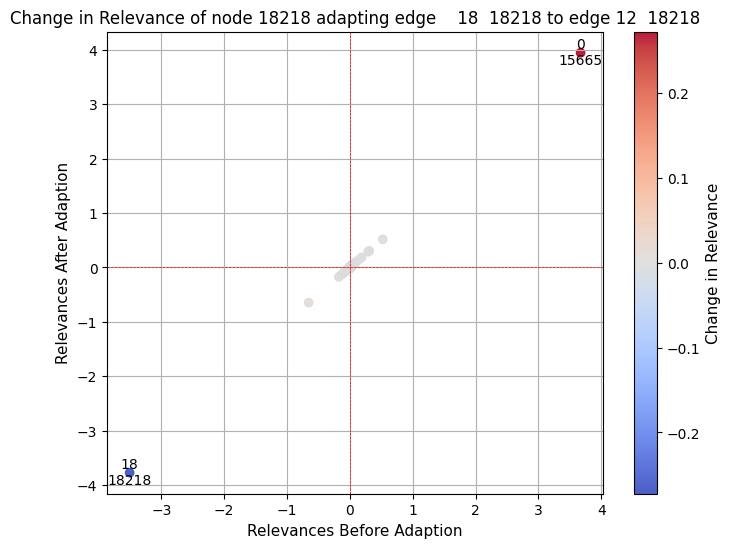

relevances_after_edge_edge_21185_18281adapt_tensor([    0, 18281])_12.pt 21185  18281 relevances_edge_21185.pt
[[ 5.07989675e-02  5.07989675e-02  4.23000000e+02  0.00000000e+00]
 [ 4.61128317e-02  4.61128317e-02  3.98500000e+03  0.00000000e+00]
 [ 3.76089942e-03  3.76089942e-03  5.66700000e+03  0.00000000e+00]
 ...
 [-1.04622319e-01 -1.04622319e-01  2.11850000e+04  1.80000000e+01]
 [ 5.35123253e+00  5.35123253e+00  2.20730000e+04  1.80000000e+01]
 [-5.62515389e-03 -5.62515389e-03  2.24530000e+04  1.80000000e+01]]
0.0
relevances_after_edge_edge_21185_22073adapt_tensor([   18, 22073])_5.pt 21185  22073 relevances_edge_21185.pt
[[ 5.08219227e-02  5.07989675e-02  4.23000000e+02  0.00000000e+00]
 [ 4.61336821e-02  4.61128317e-02  3.98500000e+03  0.00000000e+00]
 [ 3.76261212e-03  3.76089942e-03  5.66700000e+03  0.00000000e+00]
 ...
 [-1.04669638e-01 -1.04622319e-01  2.11850000e+04  1.80000000e+01]
 [ 5.07491398e+00  5.35123253e+00  2.20730000e+04  1.80000000e+01]
 [-5.62769687e-03 -5.625153

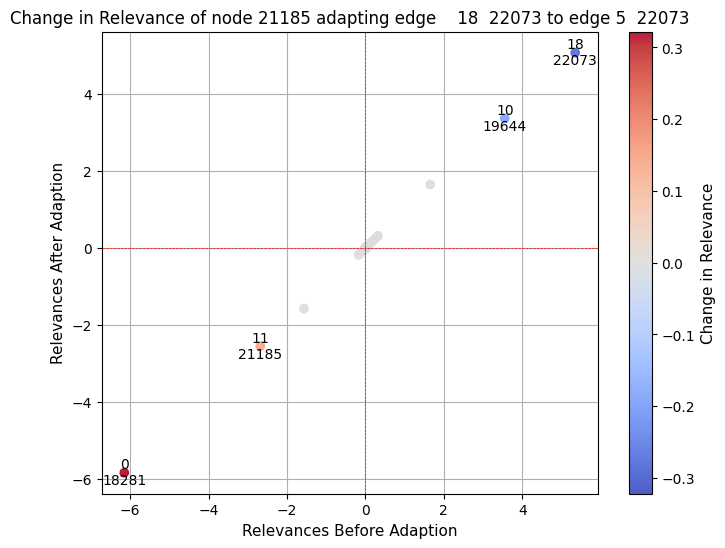

relevances_after_edge_edge_6607_12652adapt_tensor([    0, 12652])_9.pt 6607  12652 relevances_edge_6607.pt
[[ 1.00103952e-02  1.00103952e-02  4.23000000e+02  0.00000000e+00]
 [-3.00186872e-03 -3.00186872e-03  5.21000000e+02  0.00000000e+00]
 [ 8.54936838e-02  8.54936838e-02  3.21600000e+03  0.00000000e+00]
 ...
 [ 4.58490383e-03  4.58490383e-03  2.22370000e+04  1.80000000e+01]
 [-1.28137151e-04 -1.28137151e-04  2.23640000e+04  1.80000000e+01]
 [ 9.68102552e-03  9.68102552e-03  2.24480000e+04  1.80000000e+01]]
0.0
relevances_after_edge_edge_6607_4830adapt_tensor([  18, 4830])_0.pt 6607  4830 relevances_edge_6607.pt
[[ 1.00265332e-02  1.00103952e-02  4.23000000e+02  0.00000000e+00]
 [-3.00670974e-03 -3.00186872e-03  5.21000000e+02  0.00000000e+00]
 [ 8.56314972e-02  8.54936838e-02  3.21600000e+03  0.00000000e+00]
 ...
 [ 4.59230132e-03  4.58490383e-03  2.22370000e+04  1.80000000e+01]
 [-1.28343730e-04 -1.28137151e-04  2.23640000e+04  1.80000000e+01]
 [ 9.69663076e-03  9.68102552e-03  2.2

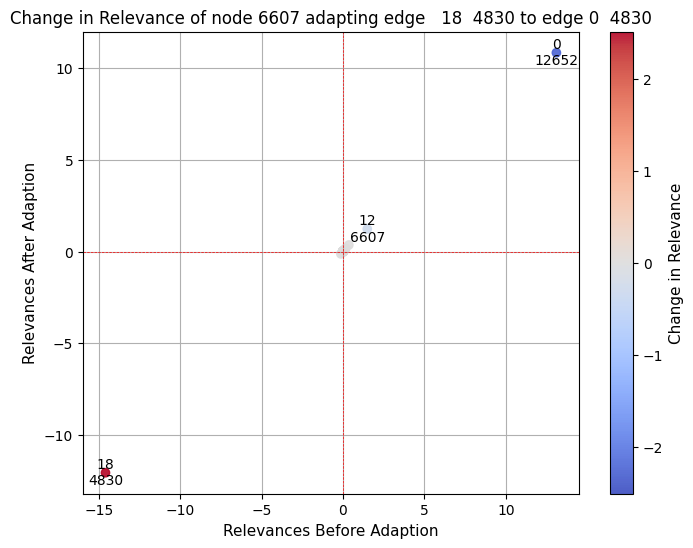

In [44]:
path = 'out/MUTAG/RGCN_emb/'+model+'/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_edge_edge_")]
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_edge_')[1].split('_')[0]
    adapt_edge_name = rel.split('[')[1].split(',')[0]
    to_edge = rel.split('_')[-1].split('.')[0]
    adapt_node = rel.split(',')[-1].split(']')[0]
    XX,YY = np.meshgrid(np.arange(ra.shape[1]),np.arange(ra.shape[0]))
    
    for rel2 in rel_before:
        

         if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            table = np.vstack((ra.ravel(),rb.ravel(),XX.ravel(),YY.ravel())).T
            table = table[table[:,0] != 0]
            print(table)
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = table[:,0] - table[:,1]
            print(change.sum())
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 0.1

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            print('non :',len(nonzero_indices))
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                table[:,1],
                table[:,0],
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            

            # Add index labels for each point
            for i, (idx1, idx2) in enumerate(zip(table[:,3][nonzero_indices], table[:,2][nonzero_indices])):
                label = f'{int(idx1)}\n{int(idx2)}'  # Combine the two indices into one label
                plt.text(table[:,1][nonzero_indices][i], table[:,0][nonzero_indices][i], label, fontsize=10, ha='center', va='center')



            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting edge {} {} to edge {} {}'.format(node_name, adapt_edge_name, adapt_node, to_edge, adapt_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

relevances_node_101.pt 101  6164 relevances_edge_9956.pt


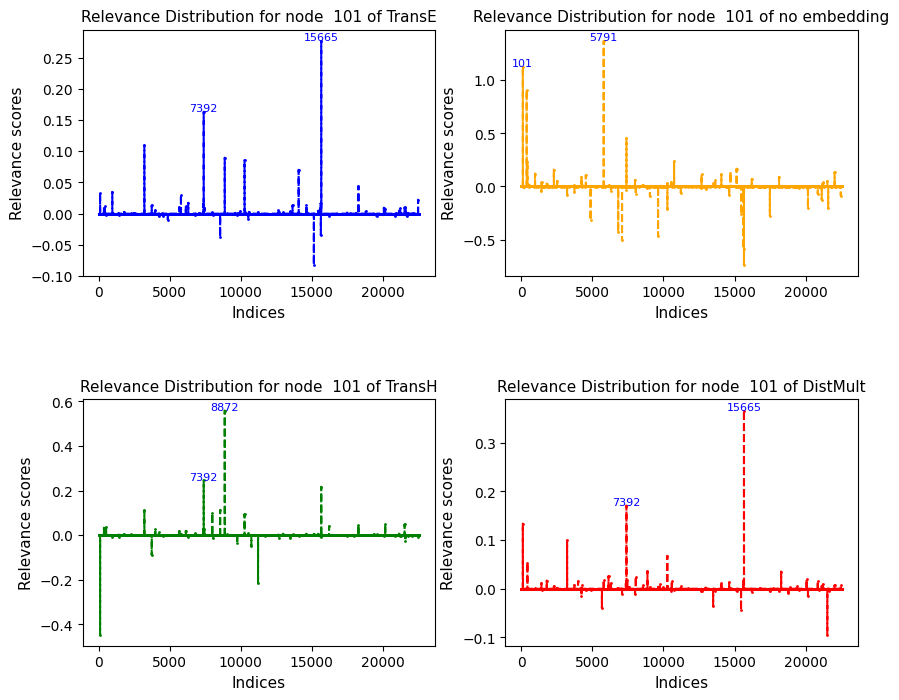

<Figure size 900x600 with 0 Axes>

relevances_node_10172.pt 10172  6164 relevances_edge_9956.pt


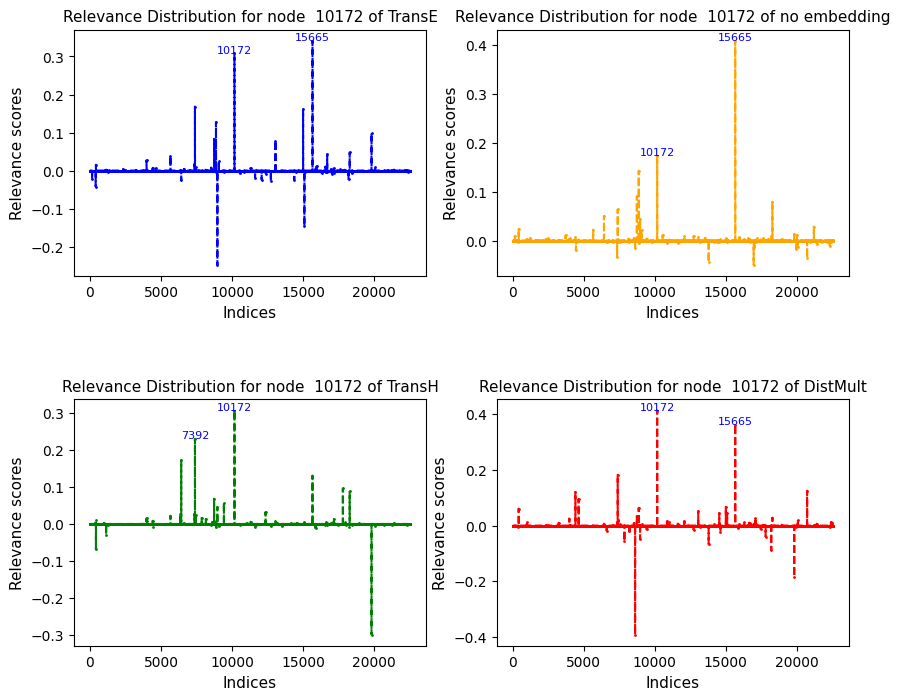

<Figure size 900x600 with 0 Axes>

relevances_node_10248.pt 10248  6164 relevances_edge_9956.pt


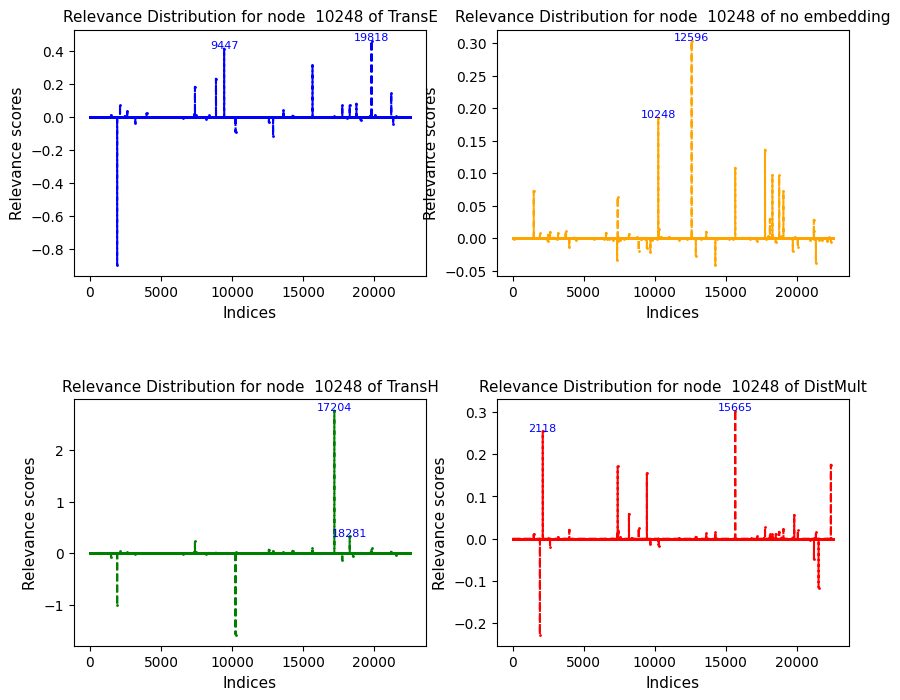

<Figure size 900x600 with 0 Axes>

relevances_node_10336.pt 10336  6164 relevances_edge_9956.pt


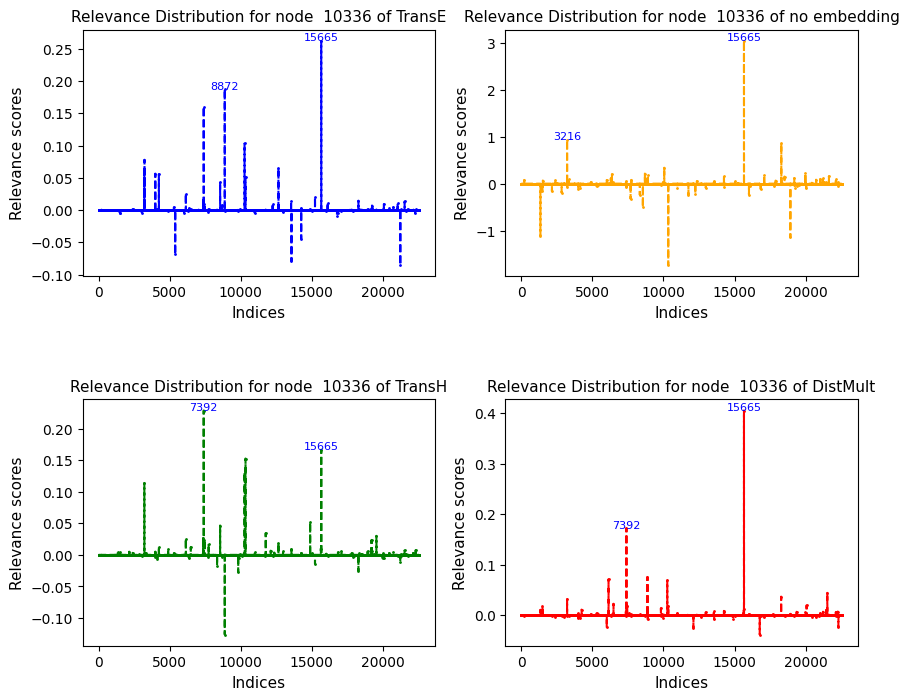

<Figure size 900x600 with 0 Axes>

relevances_node_10582.pt 10582  6164 relevances_edge_9956.pt


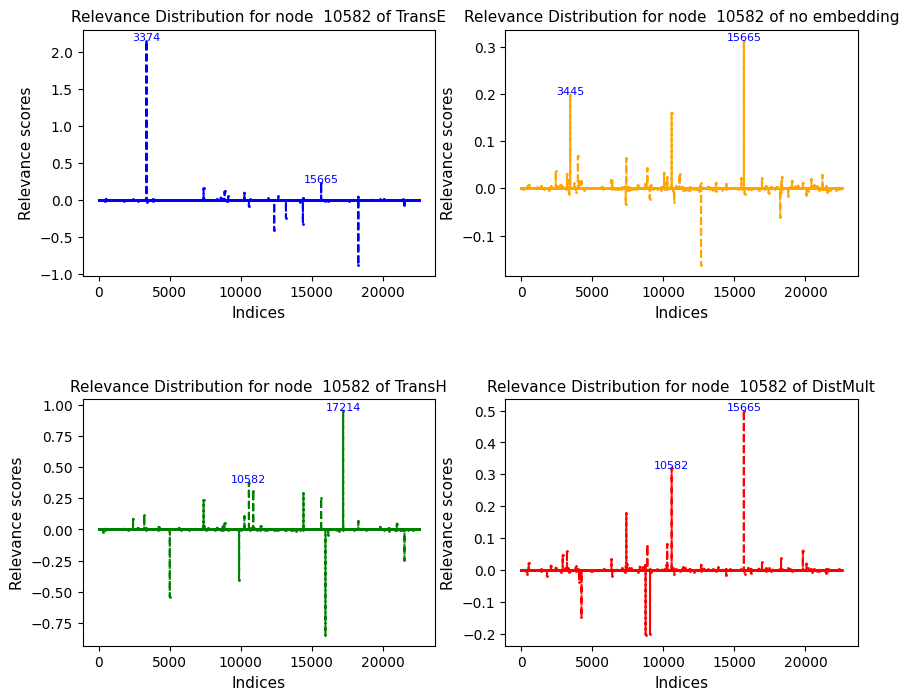

<Figure size 900x600 with 0 Axes>

relevances_node_10620.pt 10620  6164 relevances_edge_9956.pt


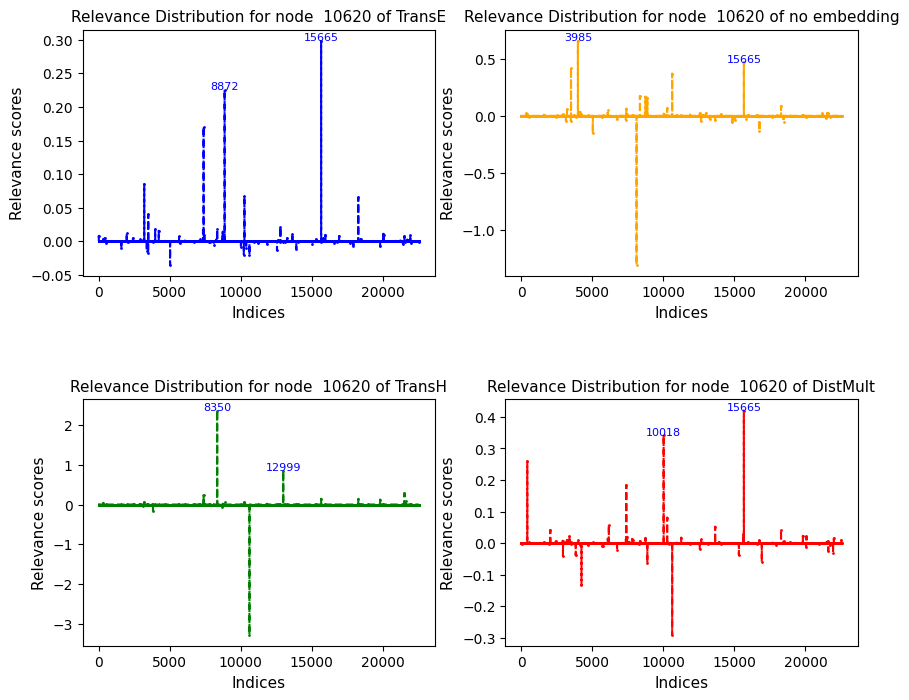

<Figure size 900x600 with 0 Axes>

relevances_node_10768.pt 10768  6164 relevances_edge_9956.pt


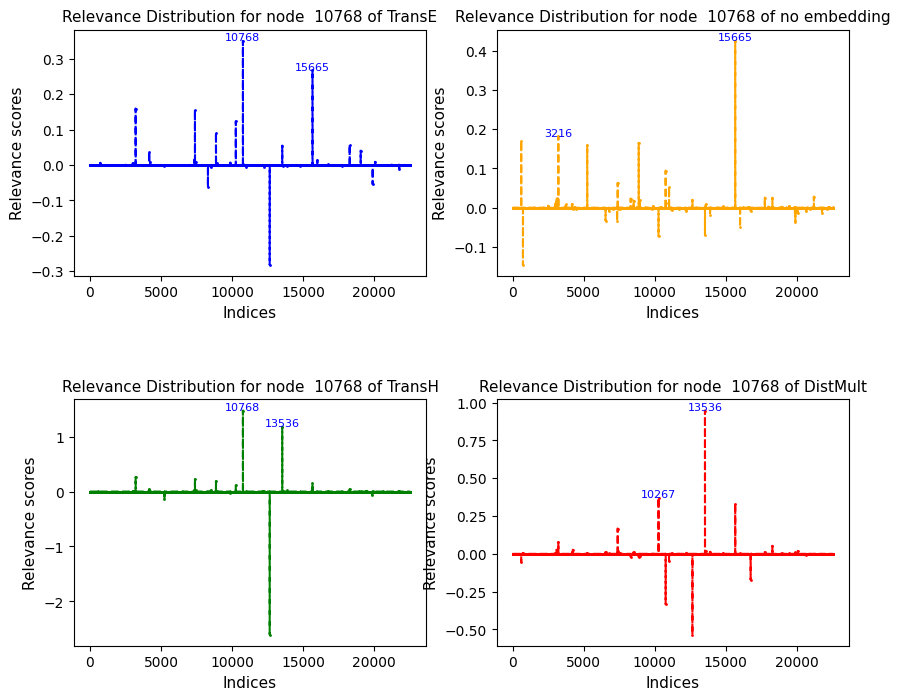

<Figure size 900x600 with 0 Axes>

relevances_node_11150.pt 11150  6164 relevances_edge_9956.pt


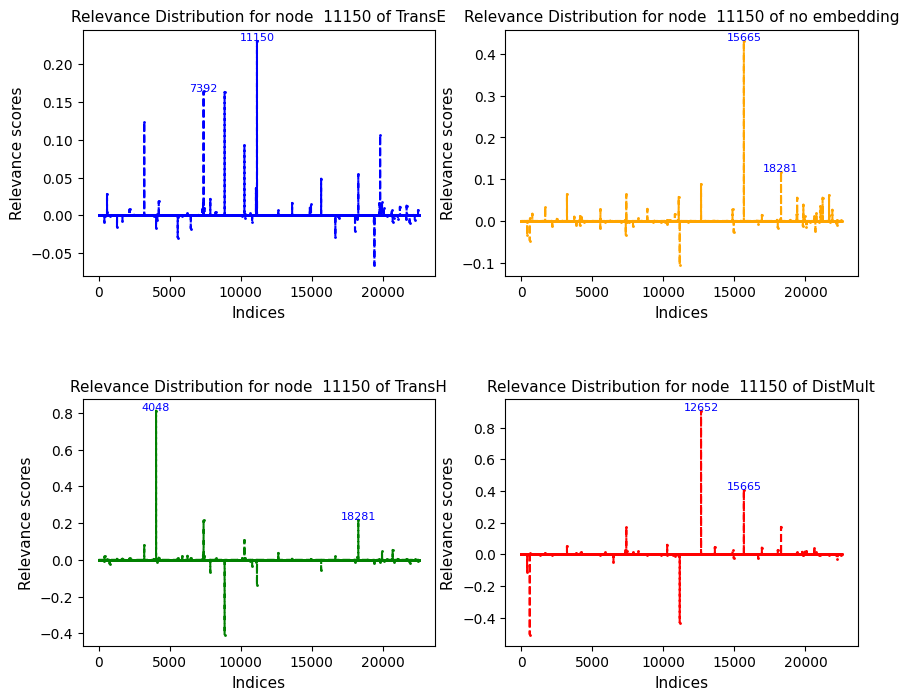

<Figure size 900x600 with 0 Axes>

relevances_node_11213.pt 11213  6164 relevances_edge_9956.pt


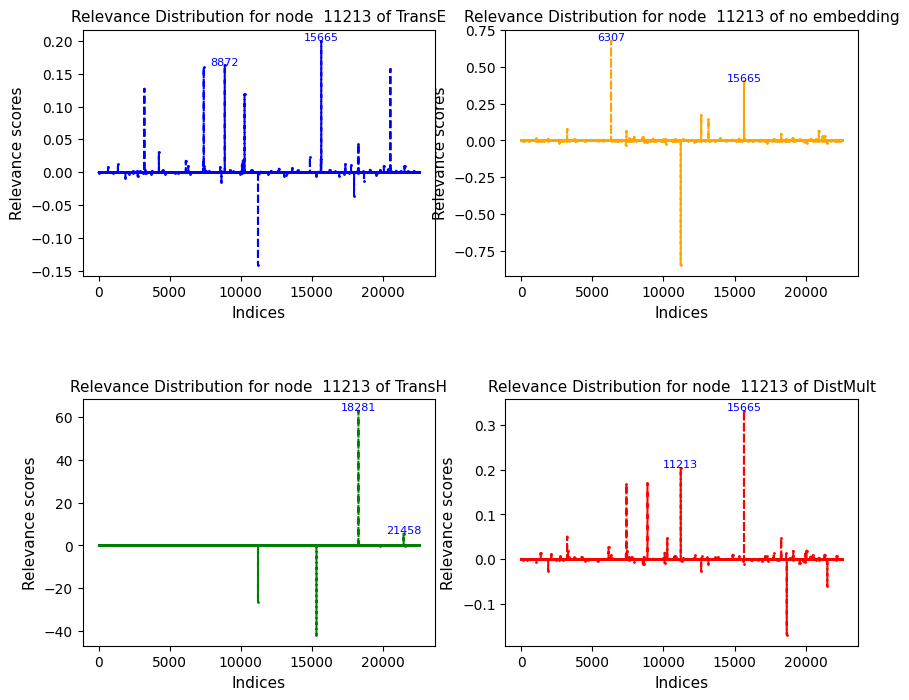

<Figure size 900x600 with 0 Axes>

relevances_node_1166.pt 1166  6164 relevances_edge_9956.pt


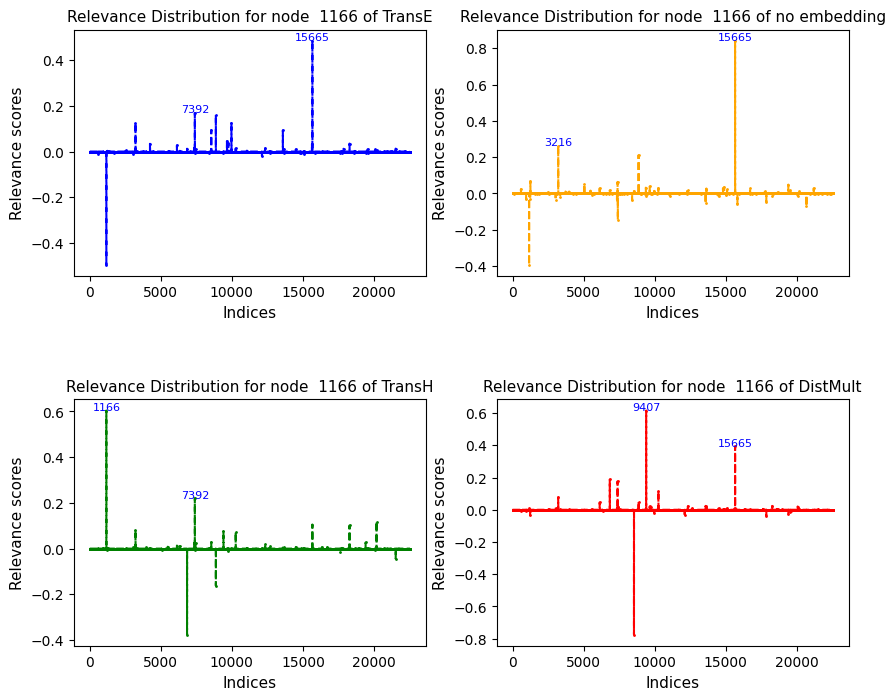

<Figure size 900x600 with 0 Axes>

relevances_node_11934.pt 11934  6164 relevances_edge_9956.pt


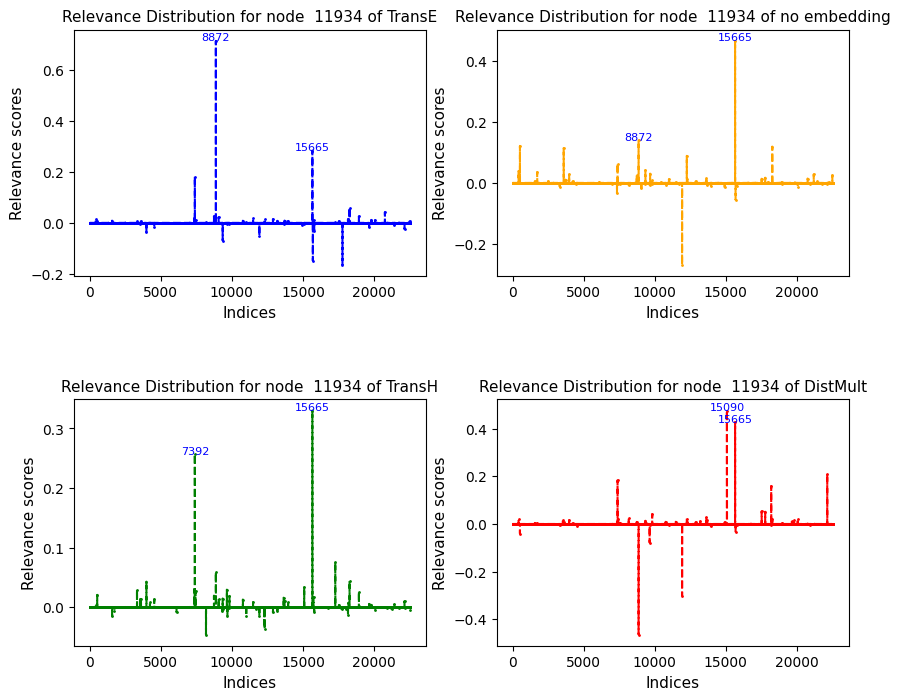

<Figure size 900x600 with 0 Axes>

relevances_node_12544.pt 12544  6164 relevances_edge_9956.pt


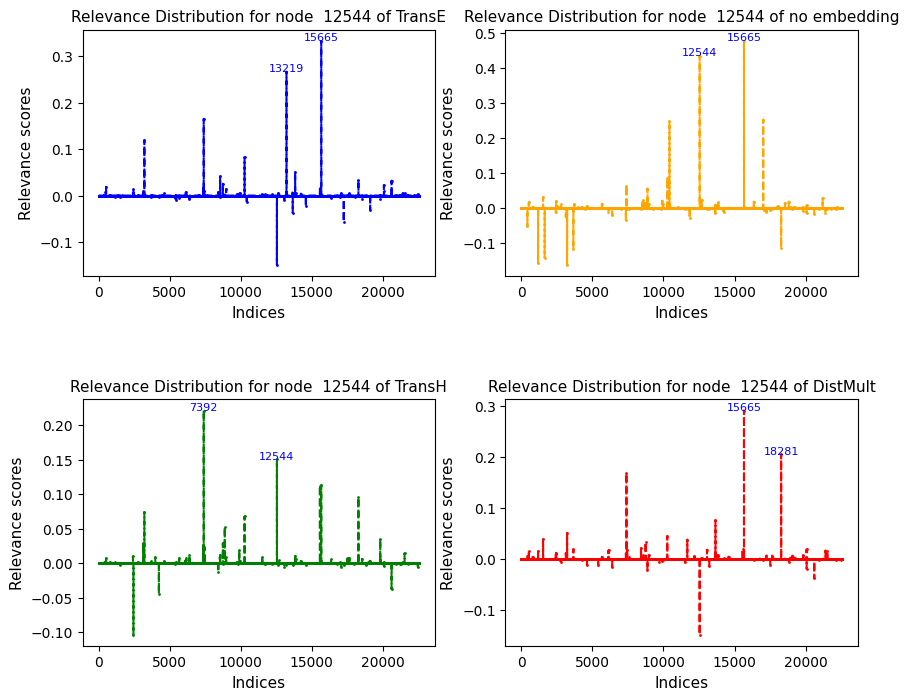

<Figure size 900x600 with 0 Axes>

relevances_node_12917.pt 12917  6164 relevances_edge_9956.pt


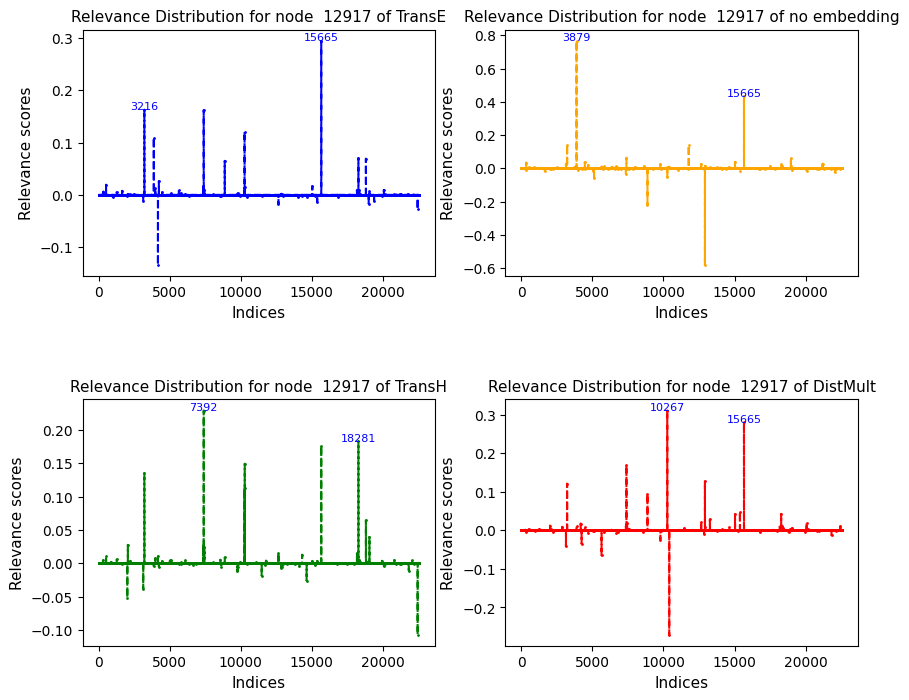

<Figure size 900x600 with 0 Axes>

relevances_node_13333.pt 13333  6164 relevances_edge_9956.pt


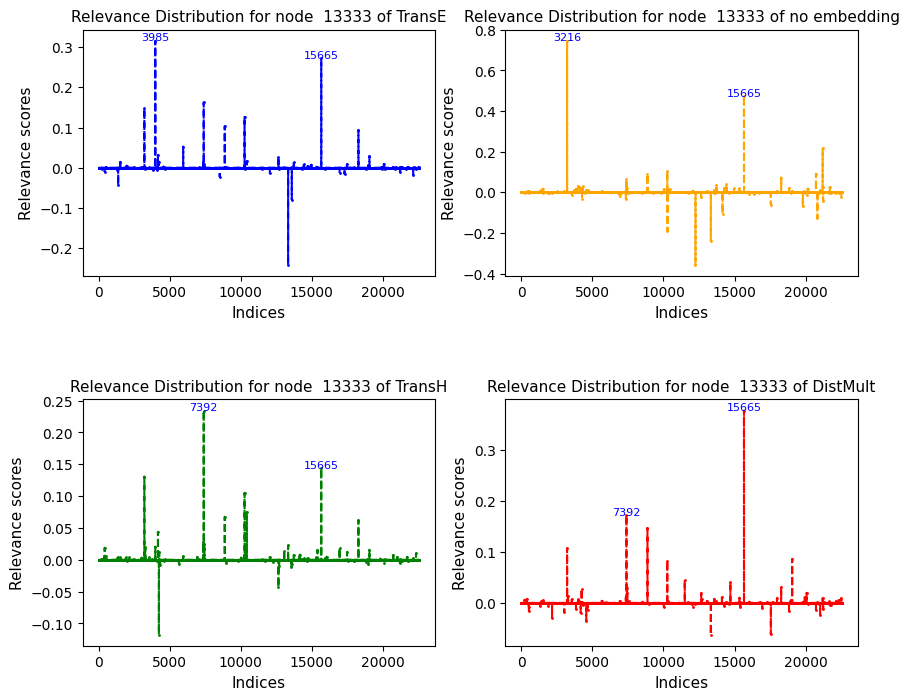

<Figure size 900x600 with 0 Axes>

relevances_node_13510.pt 13510  6164 relevances_edge_9956.pt


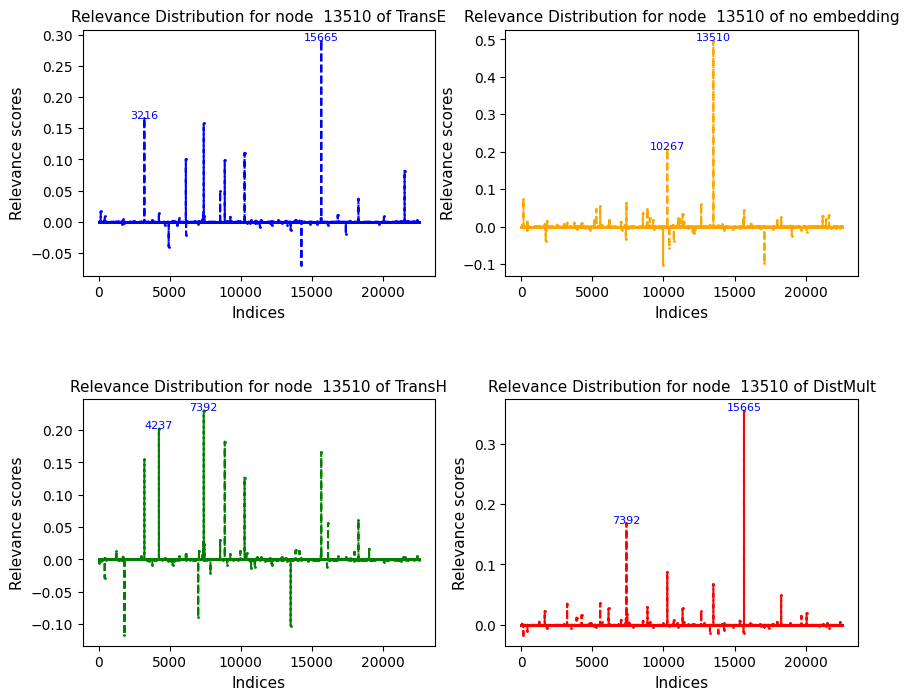

<Figure size 900x600 with 0 Axes>

relevances_node_13745.pt 13745  6164 relevances_edge_9956.pt


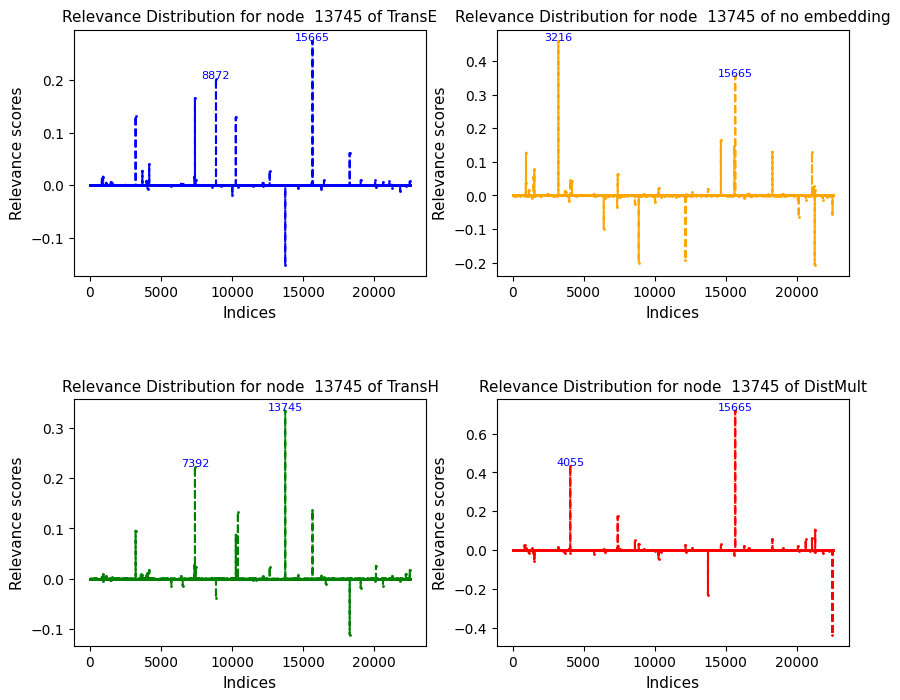

<Figure size 900x600 with 0 Axes>

relevances_node_14021.pt 14021  6164 relevances_edge_9956.pt


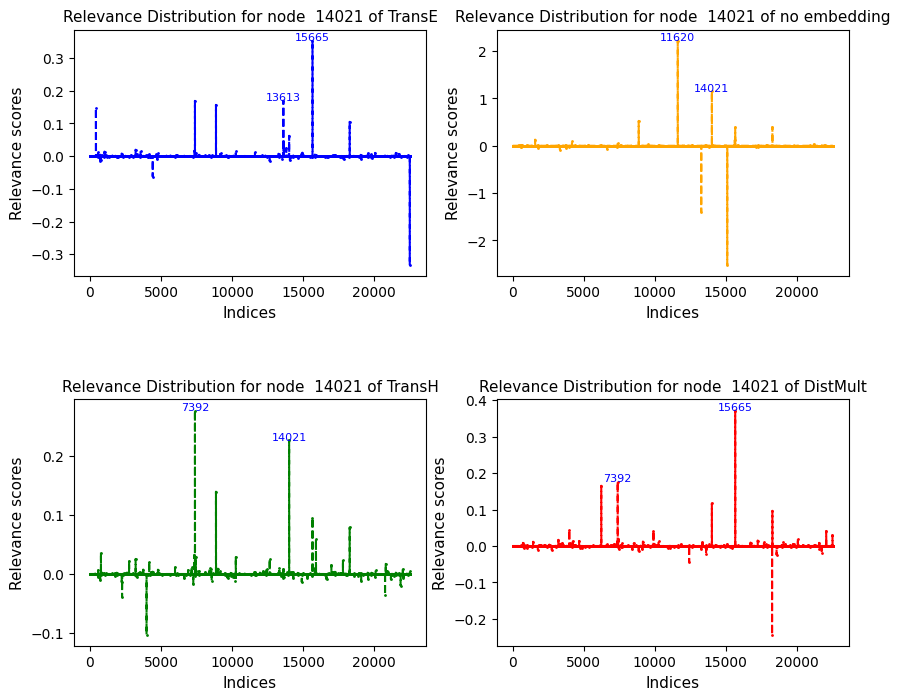

<Figure size 900x600 with 0 Axes>

relevances_node_15108.pt 15108  6164 relevances_edge_9956.pt


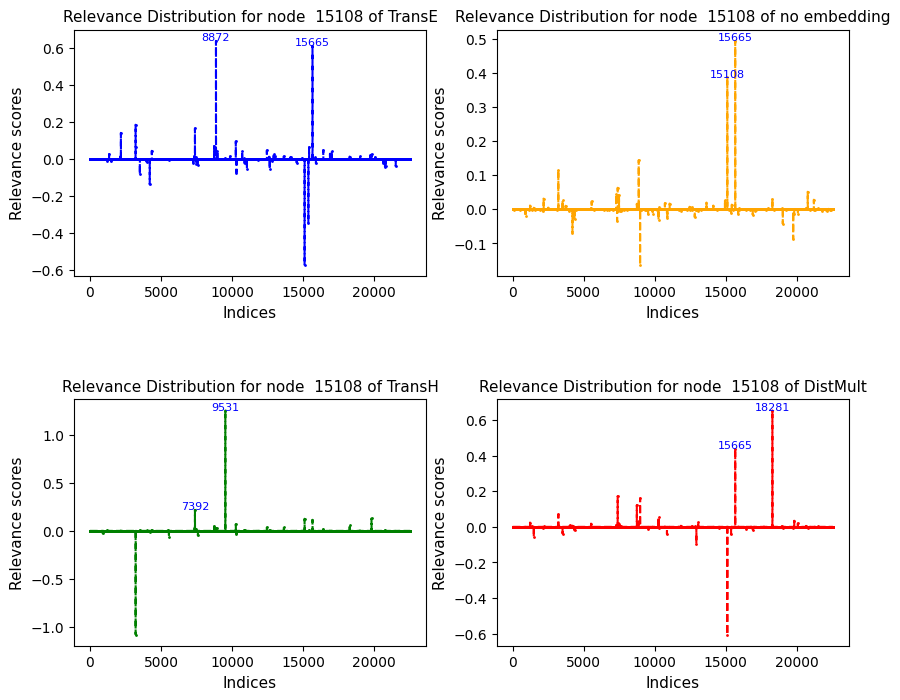

<Figure size 900x600 with 0 Axes>

relevances_node_1543.pt 1543  6164 relevances_edge_9956.pt


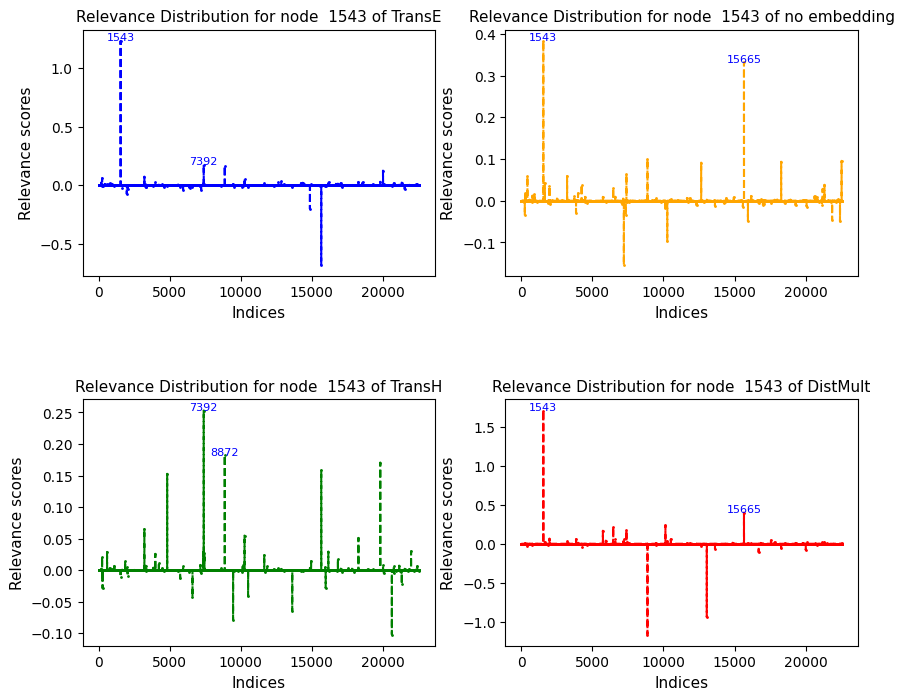

<Figure size 900x600 with 0 Axes>

relevances_node_15542.pt 15542  6164 relevances_edge_9956.pt


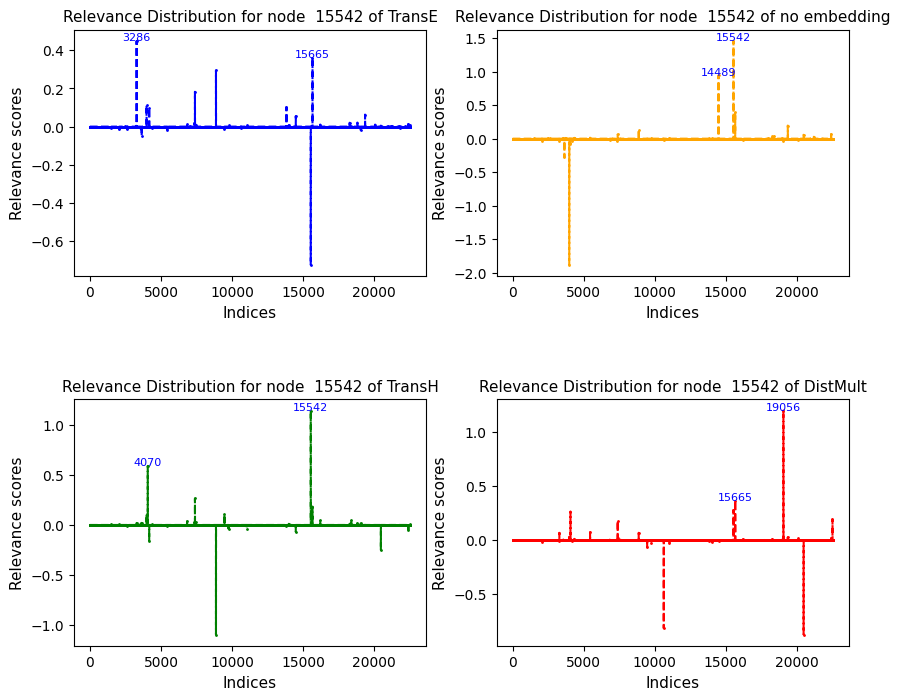

<Figure size 900x600 with 0 Axes>

relevances_node_15956.pt 15956  6164 relevances_edge_9956.pt


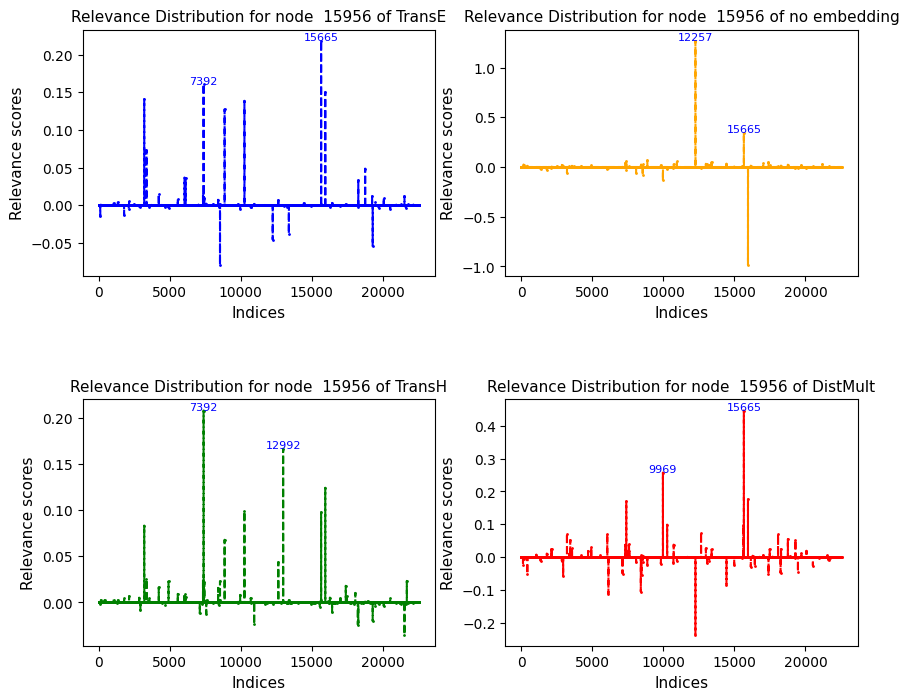

<Figure size 900x600 with 0 Axes>

relevances_node_16980.pt 16980  6164 relevances_edge_9956.pt


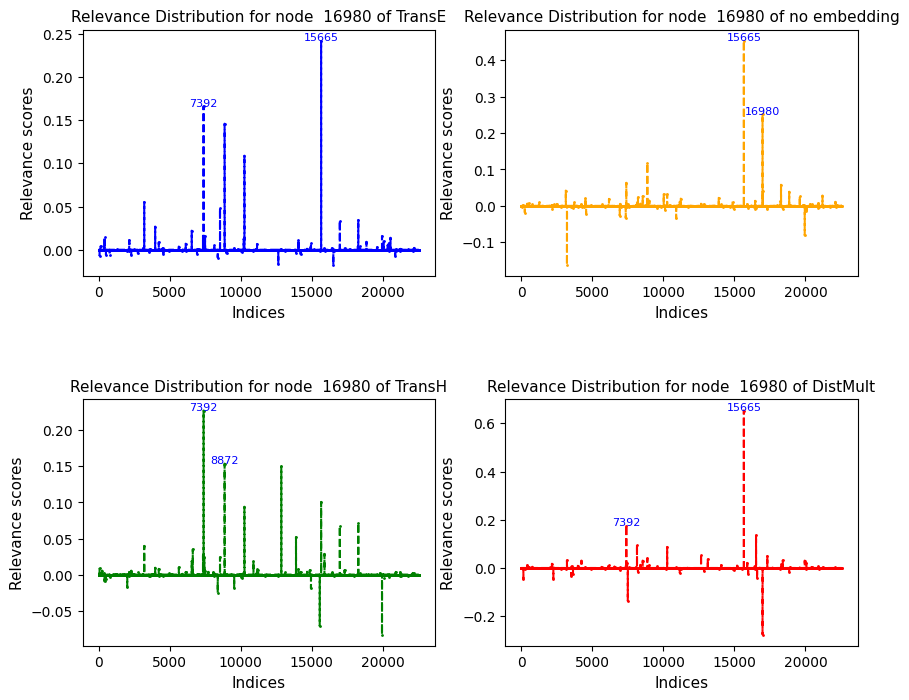

<Figure size 900x600 with 0 Axes>

relevances_node_17531.pt 17531  6164 relevances_edge_9956.pt


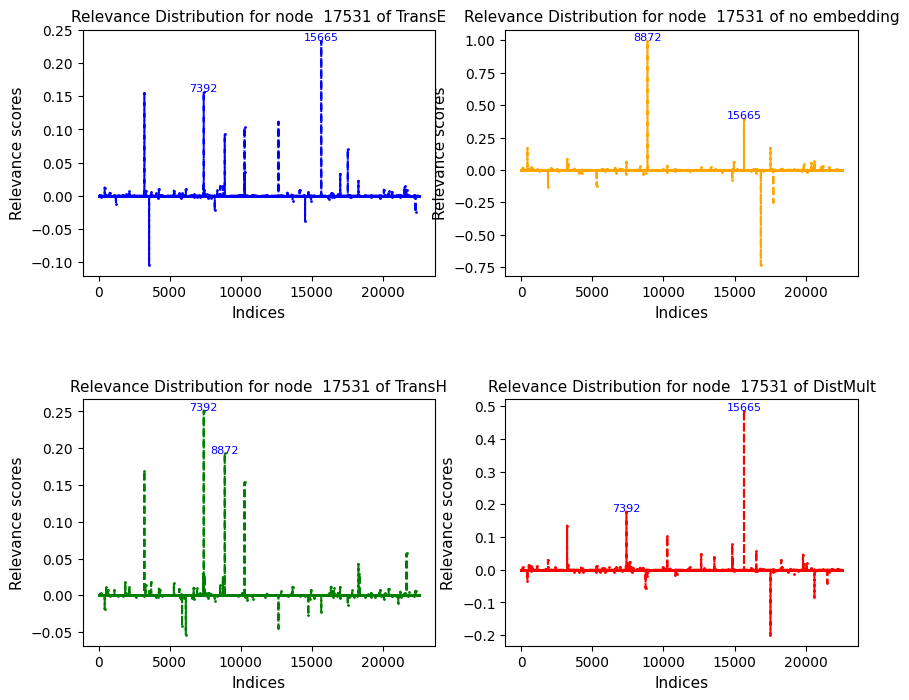

<Figure size 900x600 with 0 Axes>

relevances_node_17777.pt 17777  6164 relevances_edge_9956.pt


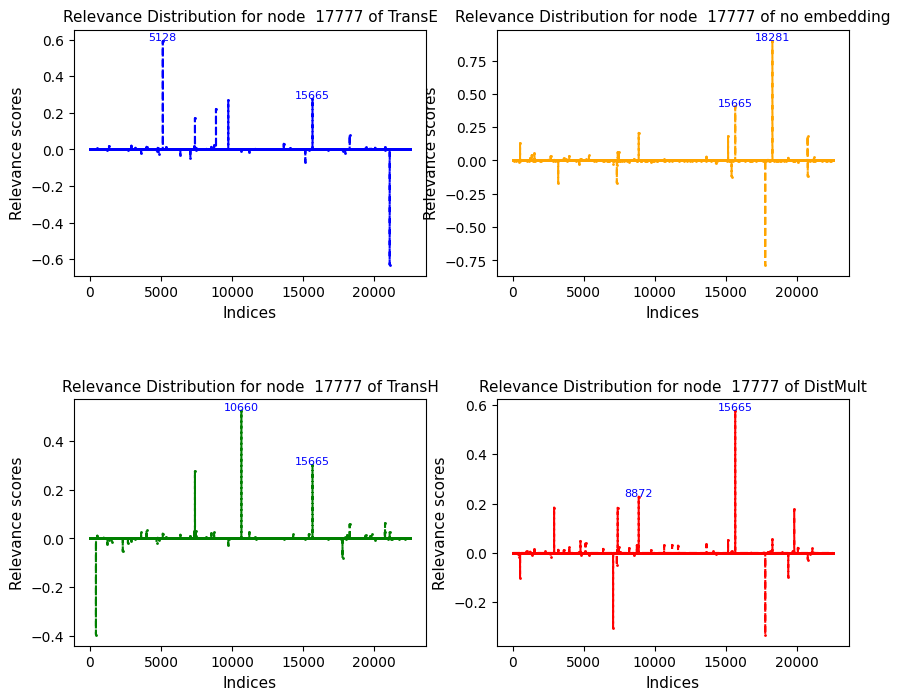

<Figure size 900x600 with 0 Axes>

relevances_node_18218.pt 18218  6164 relevances_edge_9956.pt


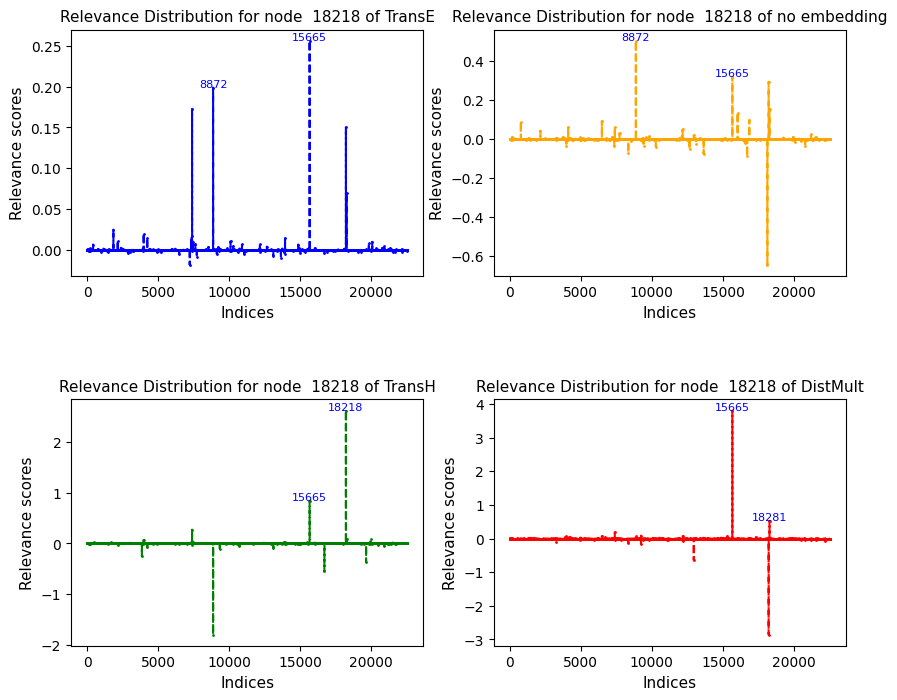

<Figure size 900x600 with 0 Axes>

relevances_node_18276.pt 18276  6164 relevances_edge_9956.pt


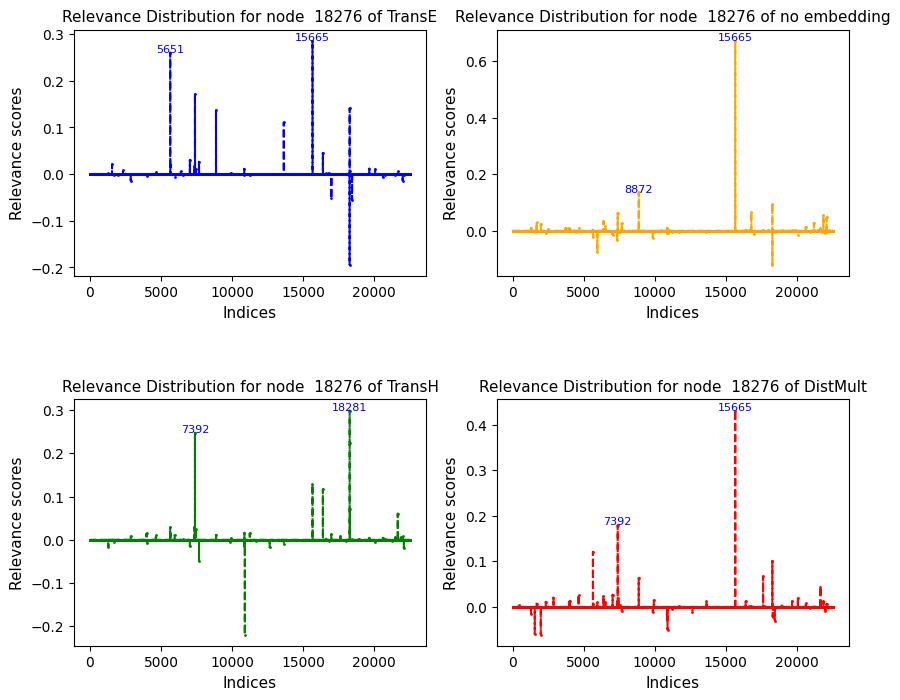

<Figure size 900x600 with 0 Axes>

relevances_node_19216.pt 19216  6164 relevances_edge_9956.pt


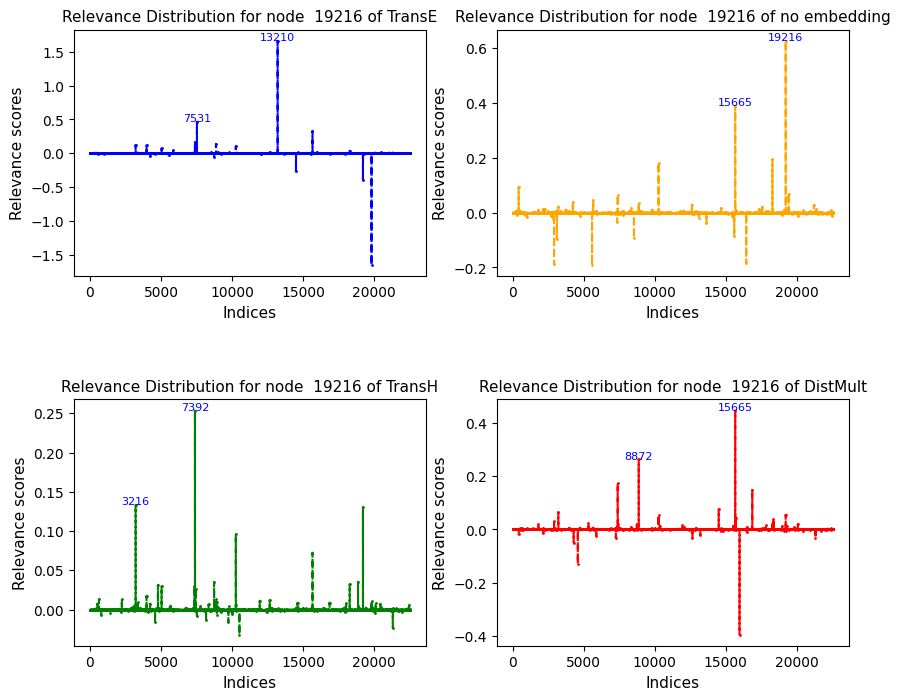

<Figure size 900x600 with 0 Axes>

relevances_node_19233.pt 19233  6164 relevances_edge_9956.pt


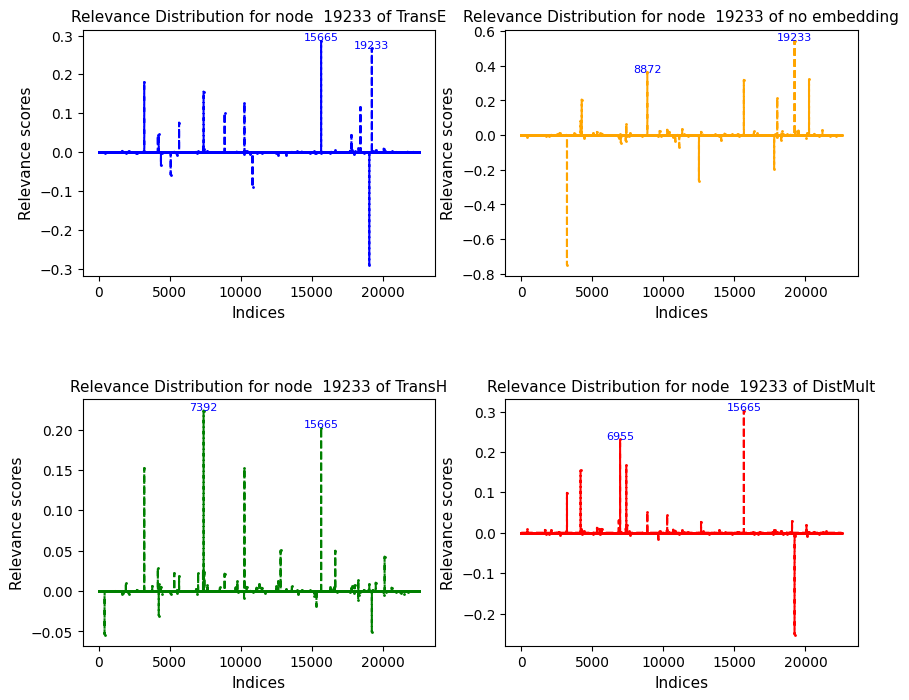

<Figure size 900x600 with 0 Axes>

relevances_node_19260.pt 19260  6164 relevances_edge_9956.pt


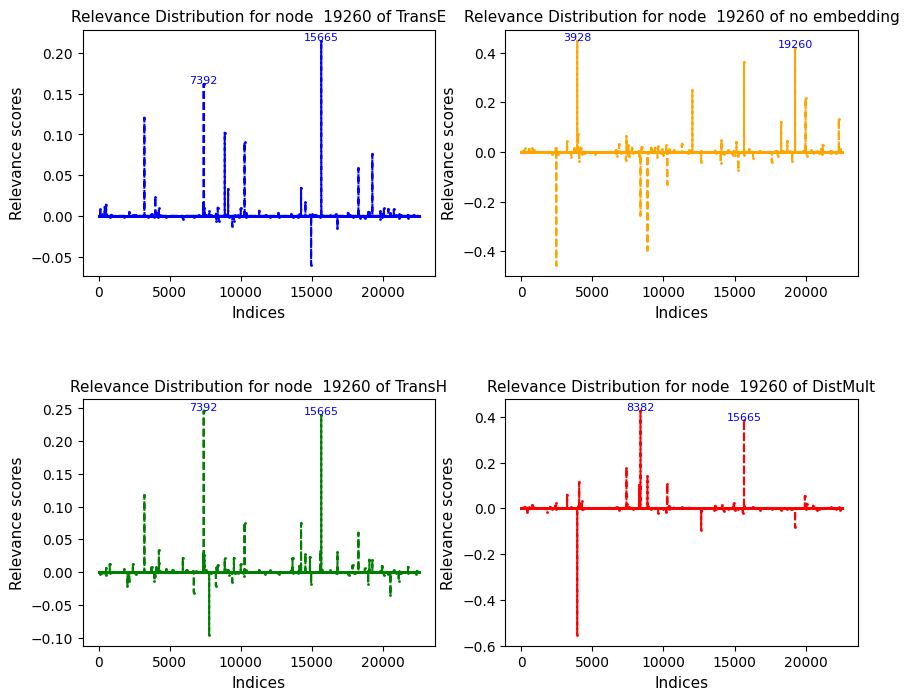

<Figure size 900x600 with 0 Axes>

relevances_node_19769.pt 19769  6164 relevances_edge_9956.pt


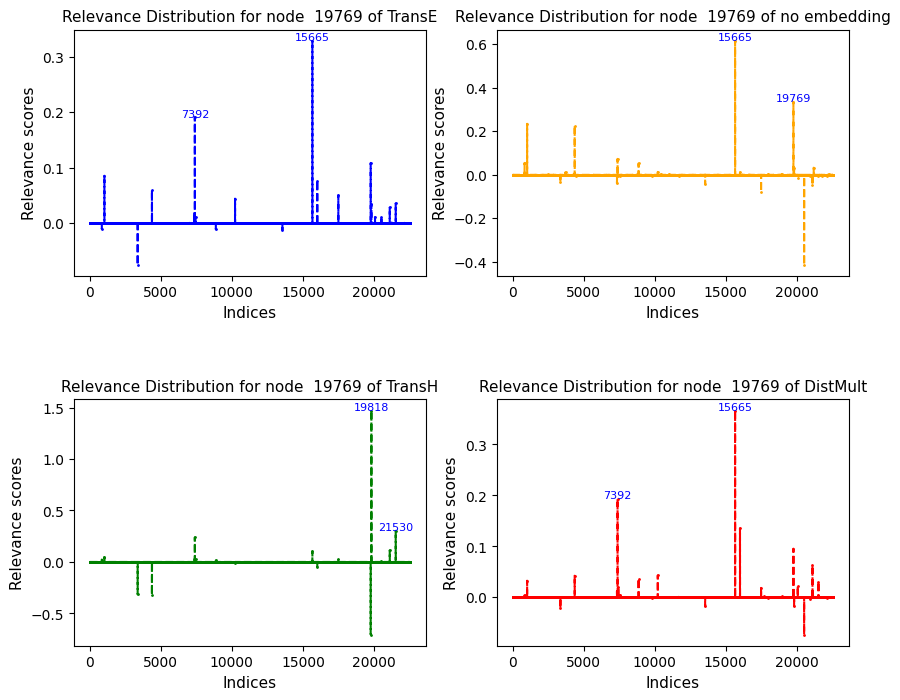

<Figure size 900x600 with 0 Axes>

relevances_node_19890.pt 19890  6164 relevances_edge_9956.pt


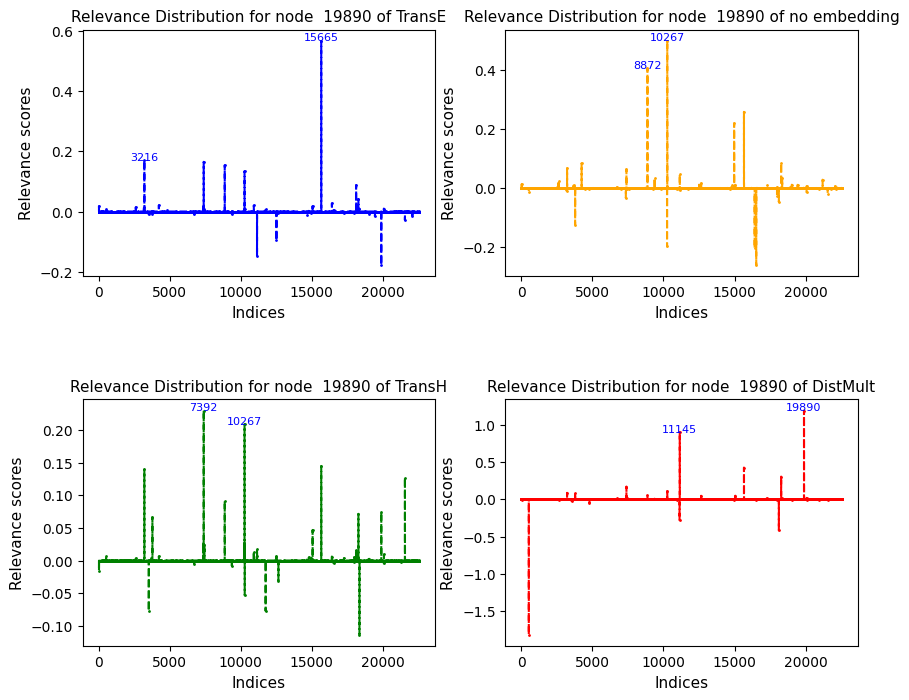

<Figure size 900x600 with 0 Axes>

relevances_node_19946.pt 19946  6164 relevances_edge_9956.pt


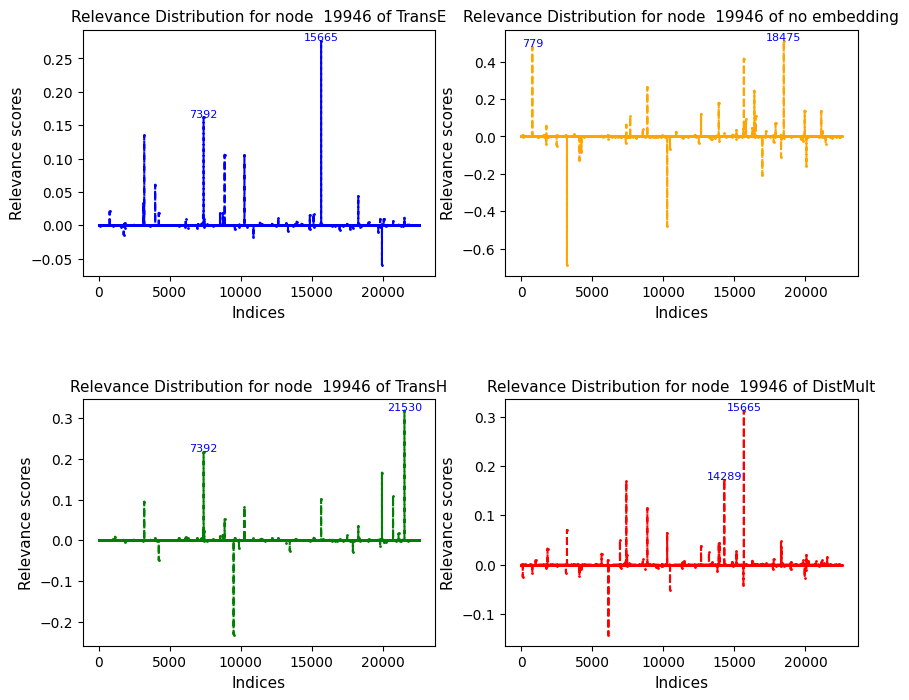

<Figure size 900x600 with 0 Axes>

relevances_node_20225.pt 20225  6164 relevances_edge_9956.pt


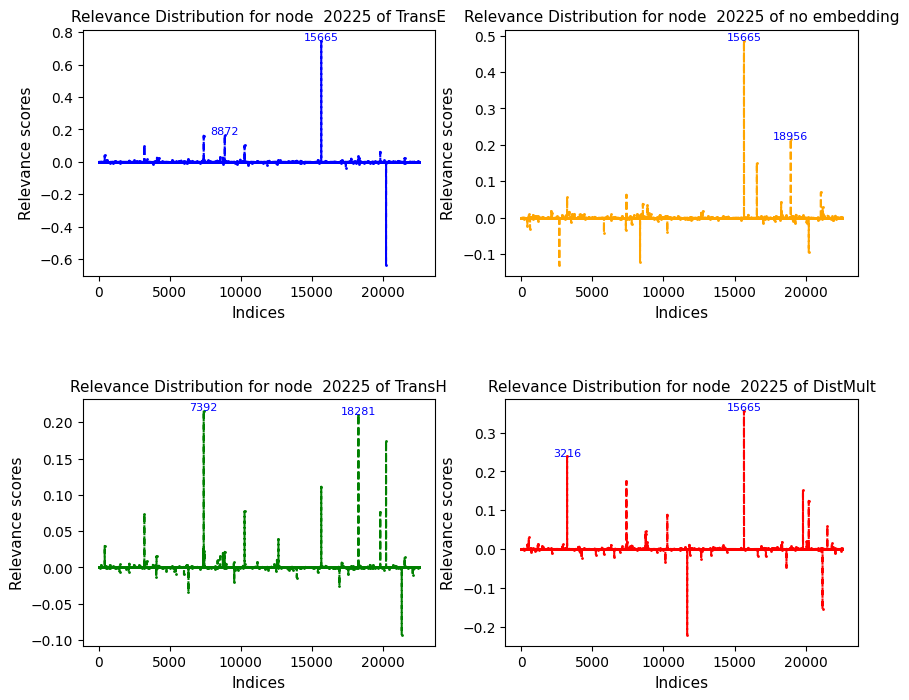

<Figure size 900x600 with 0 Axes>

relevances_node_20261.pt 20261  6164 relevances_edge_9956.pt


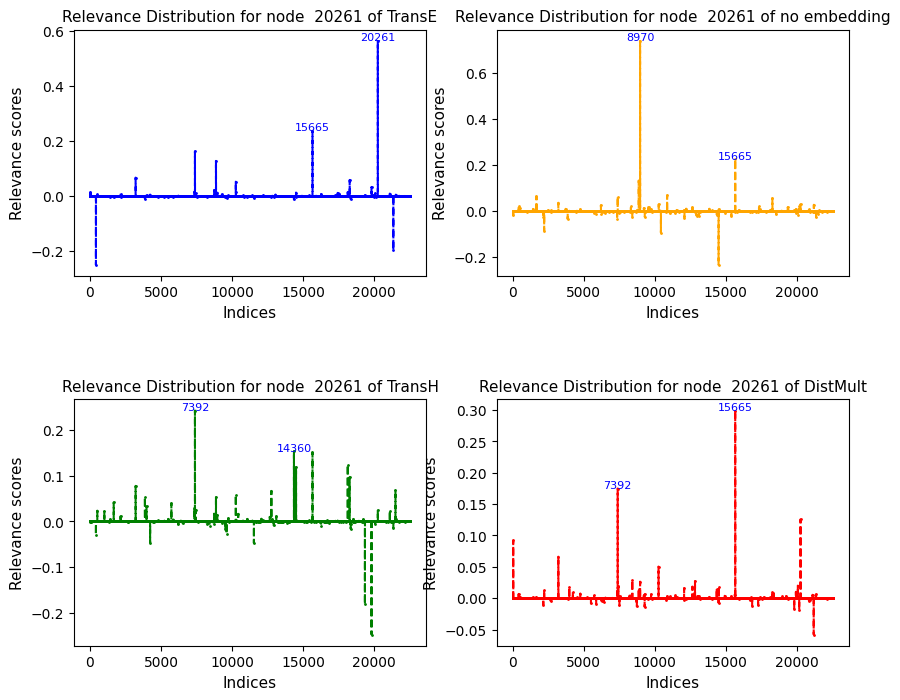

<Figure size 900x600 with 0 Axes>

relevances_node_20943.pt 20943  6164 relevances_edge_9956.pt


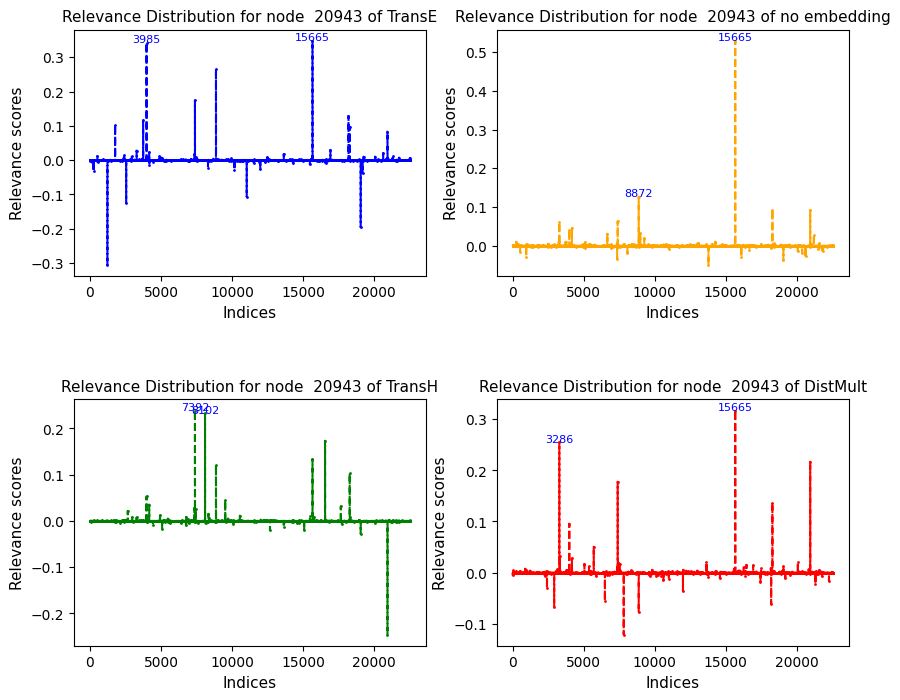

<Figure size 900x600 with 0 Axes>

relevances_node_211.pt 211  6164 relevances_edge_9956.pt


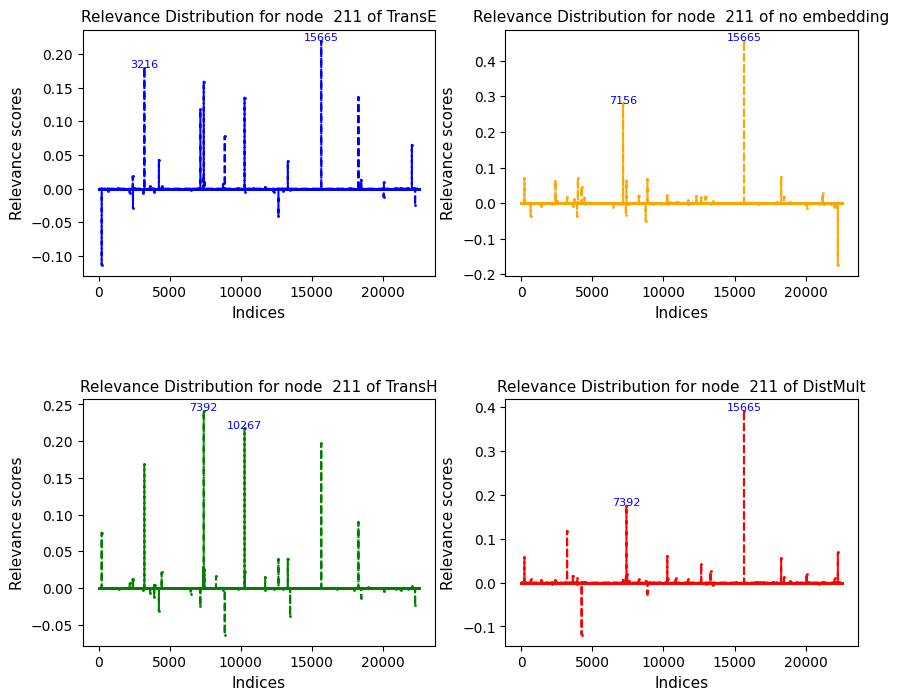

<Figure size 900x600 with 0 Axes>

relevances_node_21185.pt 21185  6164 relevances_edge_9956.pt


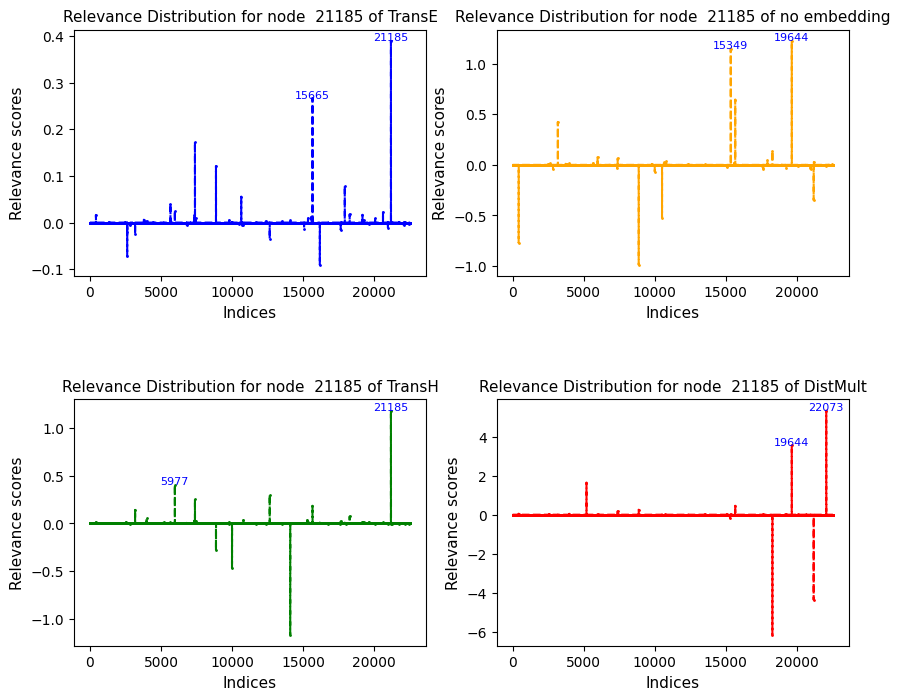

<Figure size 900x600 with 0 Axes>

relevances_node_2144.pt 2144  6164 relevances_edge_9956.pt


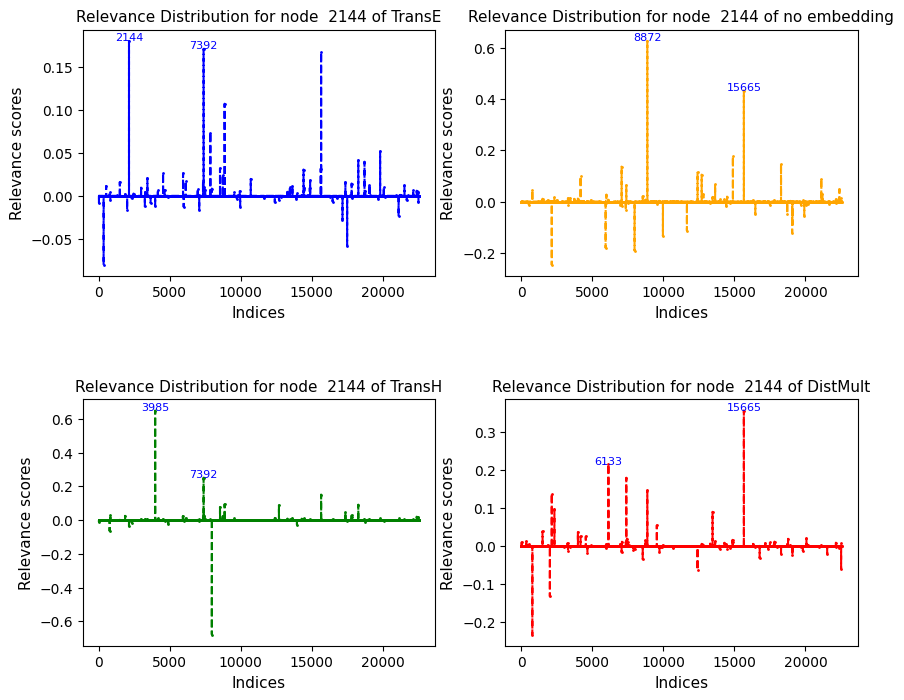

<Figure size 900x600 with 0 Axes>

relevances_node_21863.pt 21863  6164 relevances_edge_9956.pt


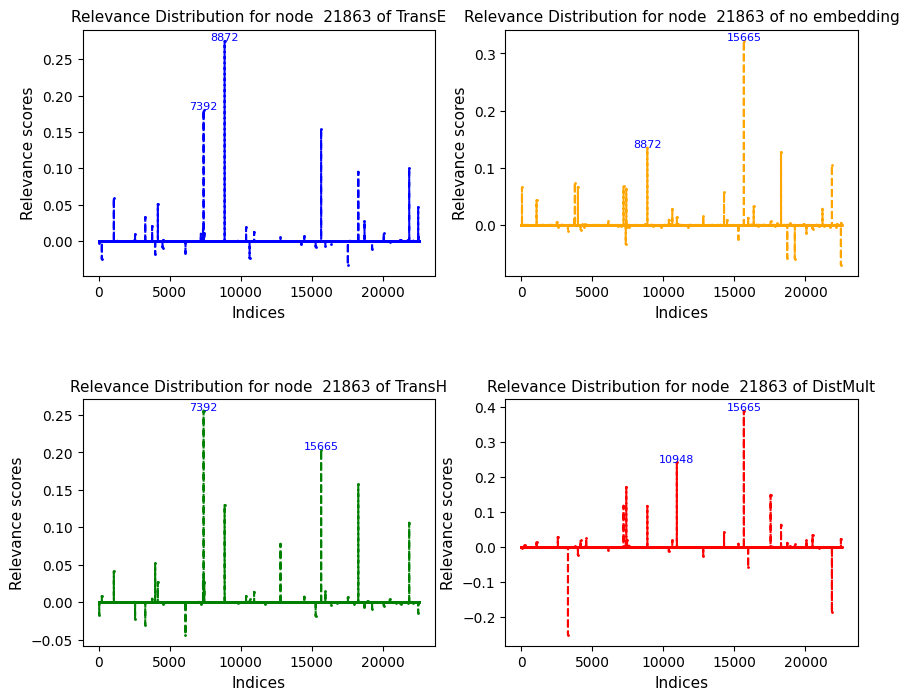

<Figure size 900x600 with 0 Axes>

relevances_node_21950.pt 21950  6164 relevances_edge_9956.pt


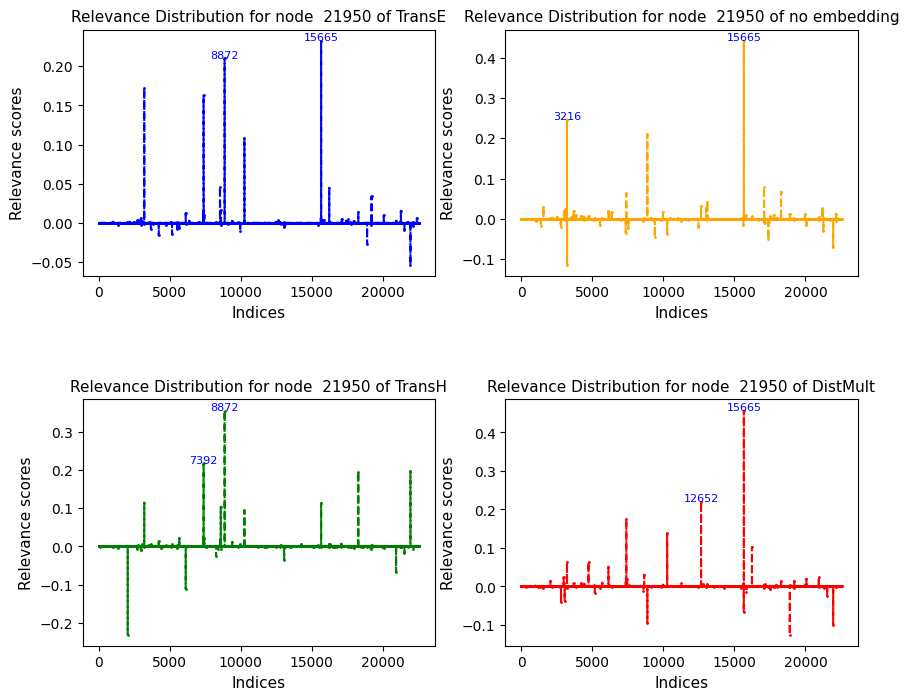

<Figure size 900x600 with 0 Axes>

relevances_node_22189.pt 22189  6164 relevances_edge_9956.pt


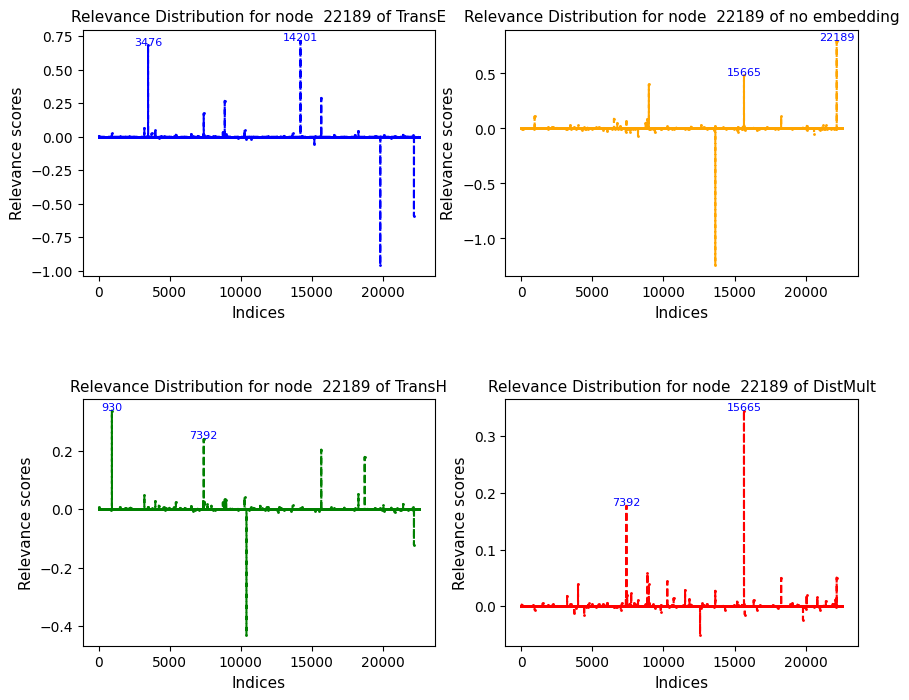

<Figure size 900x600 with 0 Axes>

relevances_node_22241.pt 22241  6164 relevances_edge_9956.pt


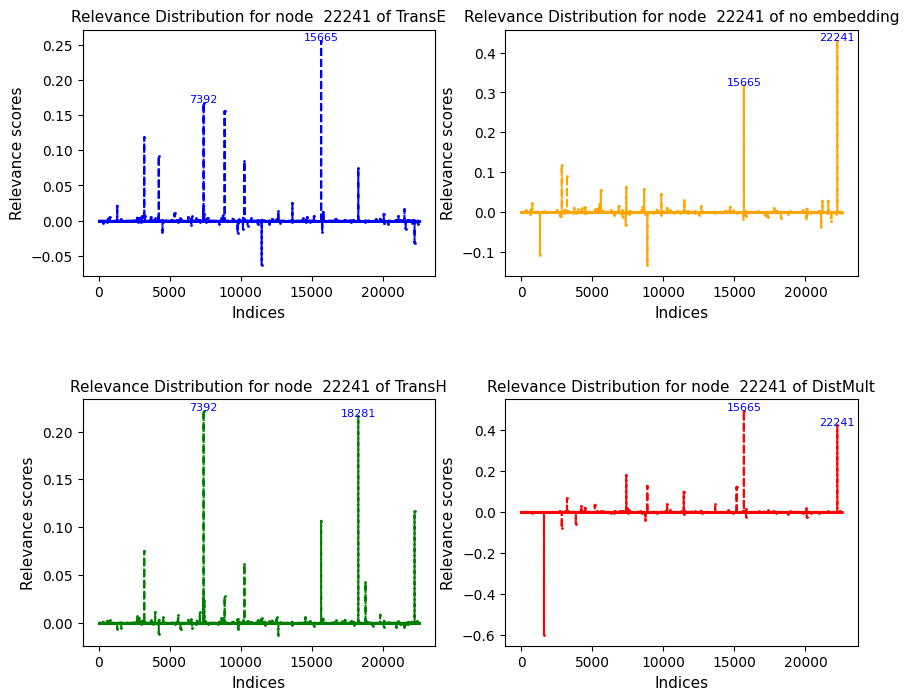

<Figure size 900x600 with 0 Axes>

relevances_node_2579.pt 2579  6164 relevances_edge_9956.pt


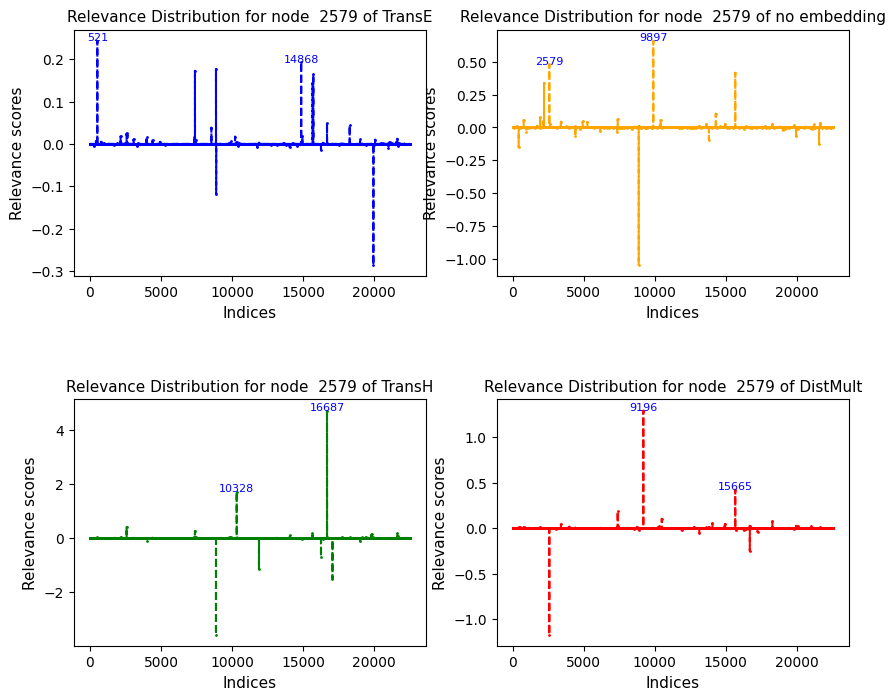

<Figure size 900x600 with 0 Axes>

relevances_node_2846.pt 2846  6164 relevances_edge_9956.pt


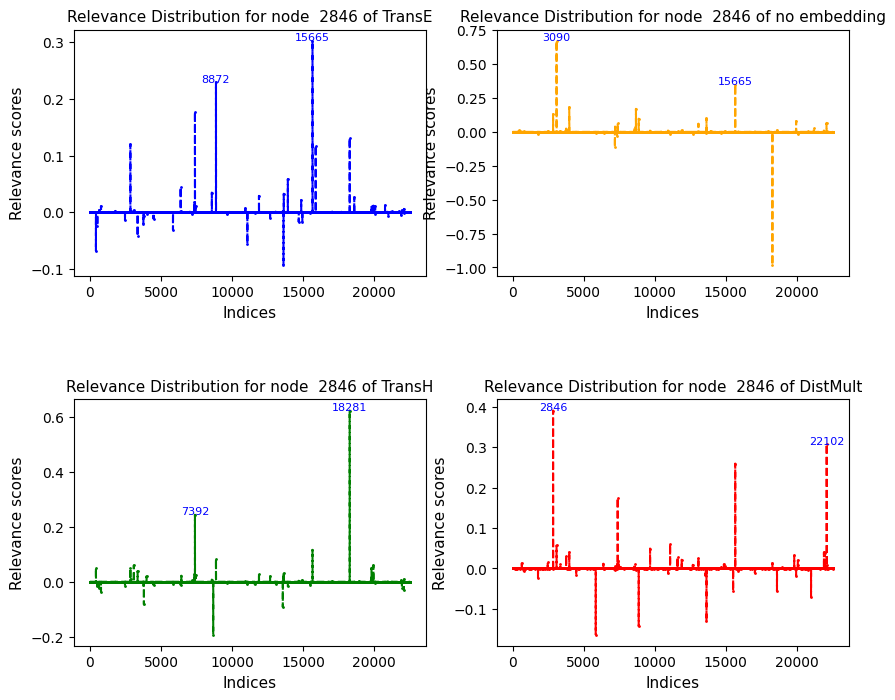

<Figure size 900x600 with 0 Axes>

relevances_node_3144.pt 3144  6164 relevances_edge_9956.pt


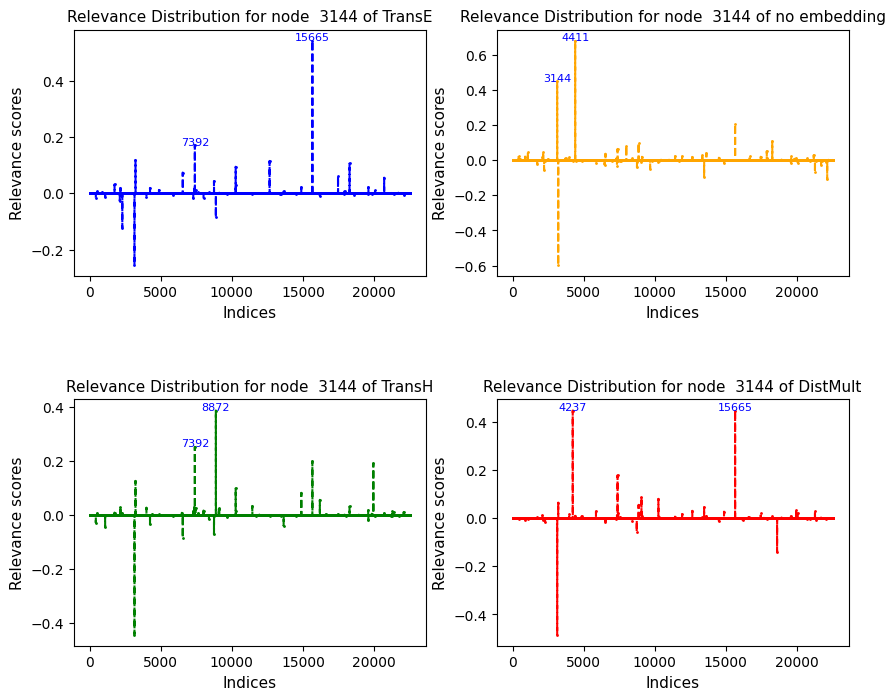

<Figure size 900x600 with 0 Axes>

relevances_node_3410.pt 3410  6164 relevances_edge_9956.pt


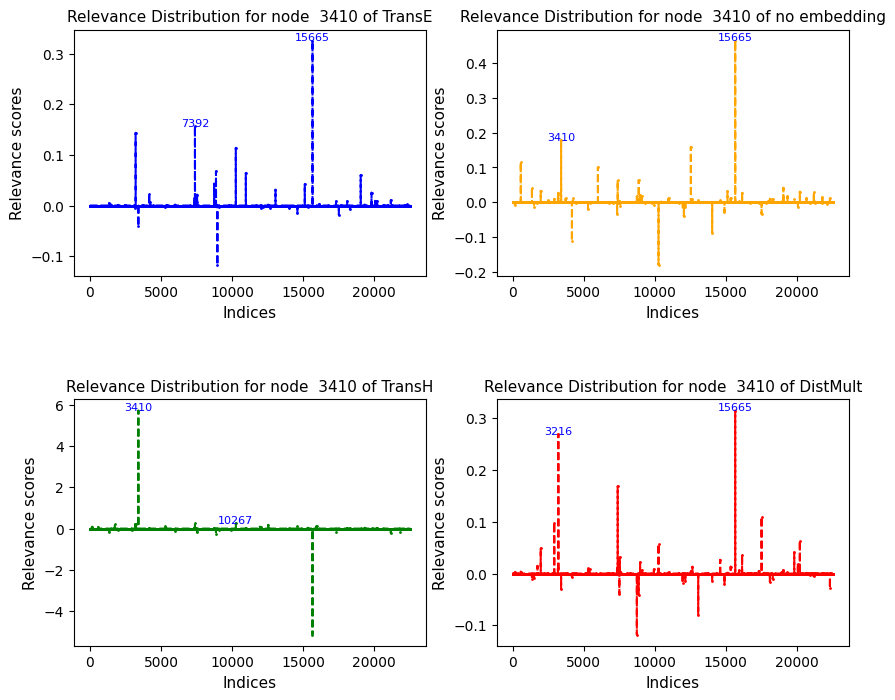

<Figure size 900x600 with 0 Axes>

relevances_node_3969.pt 3969  6164 relevances_edge_9956.pt


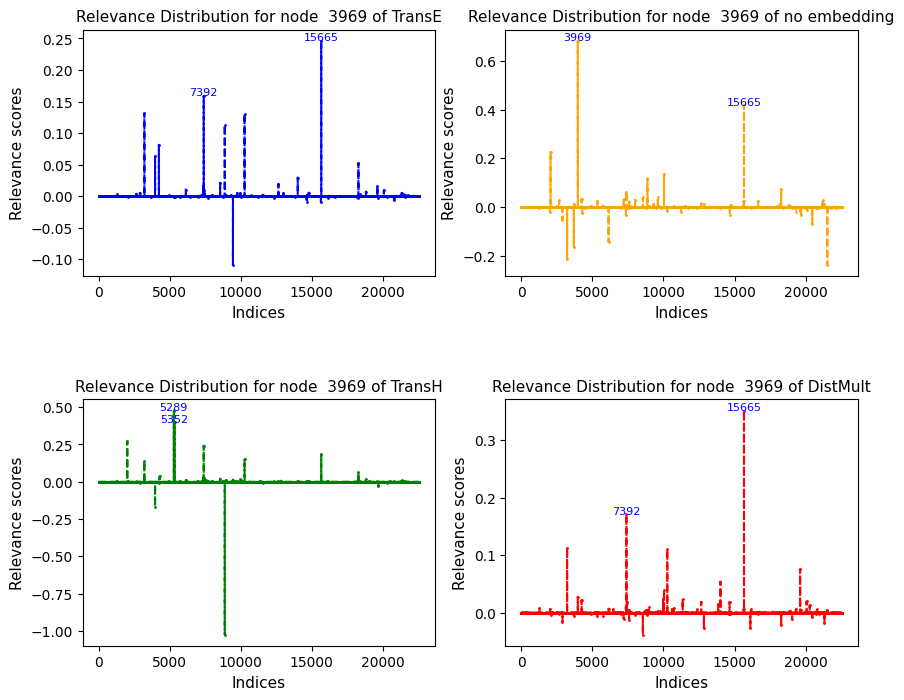

<Figure size 900x600 with 0 Axes>

relevances_node_4256.pt 4256  6164 relevances_edge_9956.pt


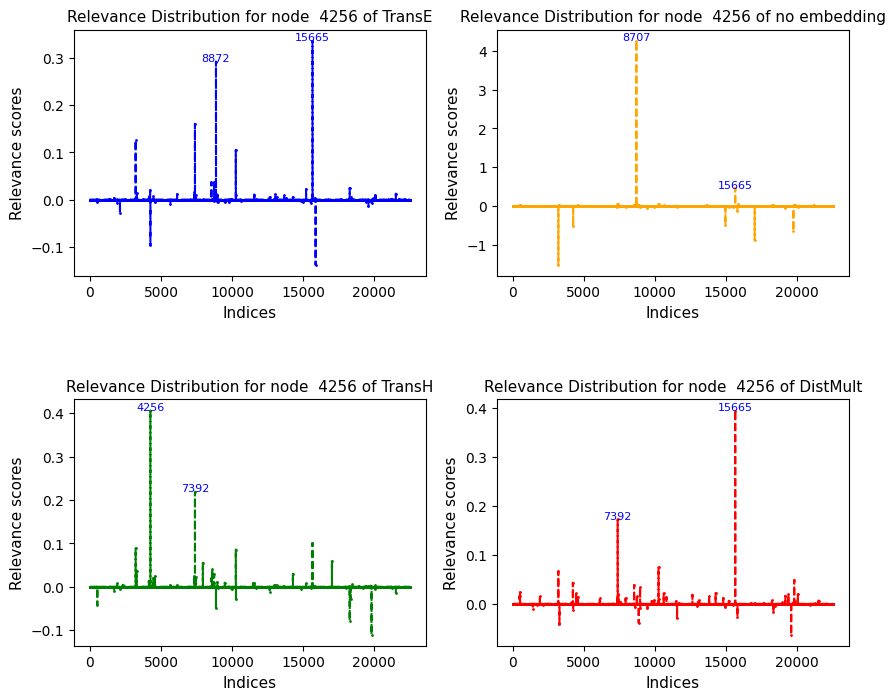

<Figure size 900x600 with 0 Axes>

relevances_node_4336.pt 4336  6164 relevances_edge_9956.pt


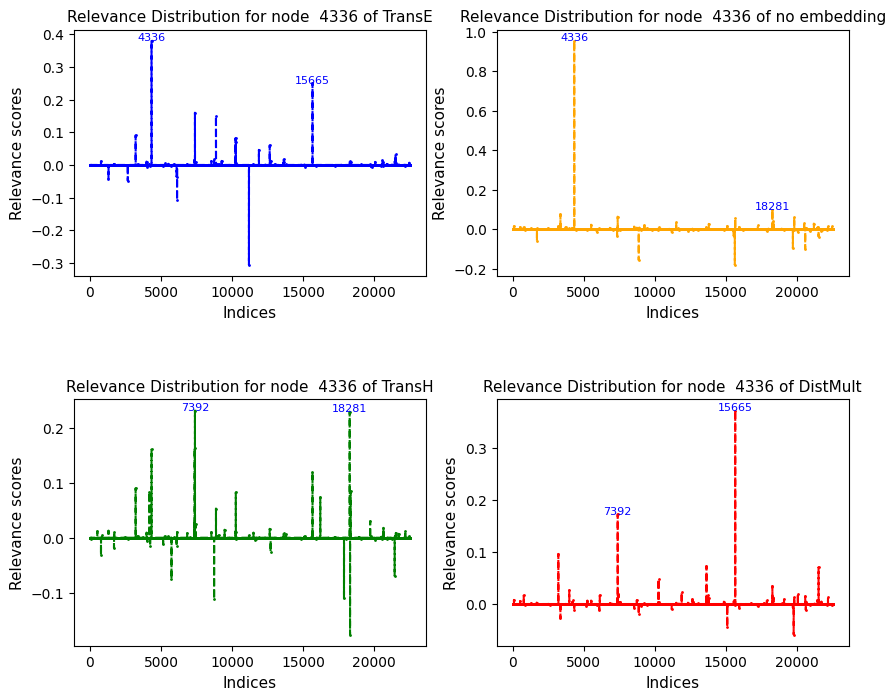

<Figure size 900x600 with 0 Axes>

relevances_node_4369.pt 4369  6164 relevances_edge_9956.pt


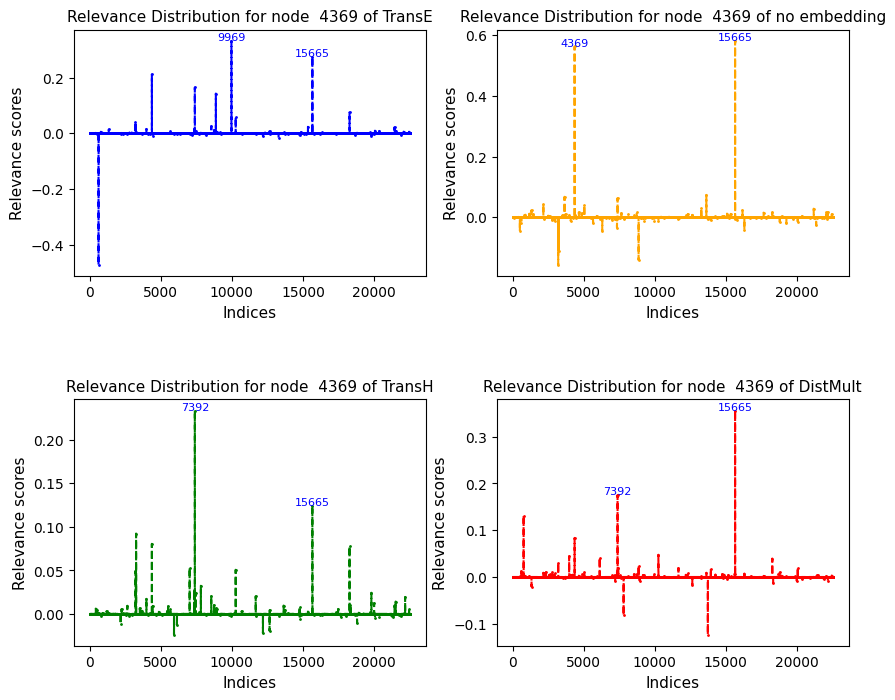

<Figure size 900x600 with 0 Axes>

relevances_node_5170.pt 5170  6164 relevances_edge_9956.pt


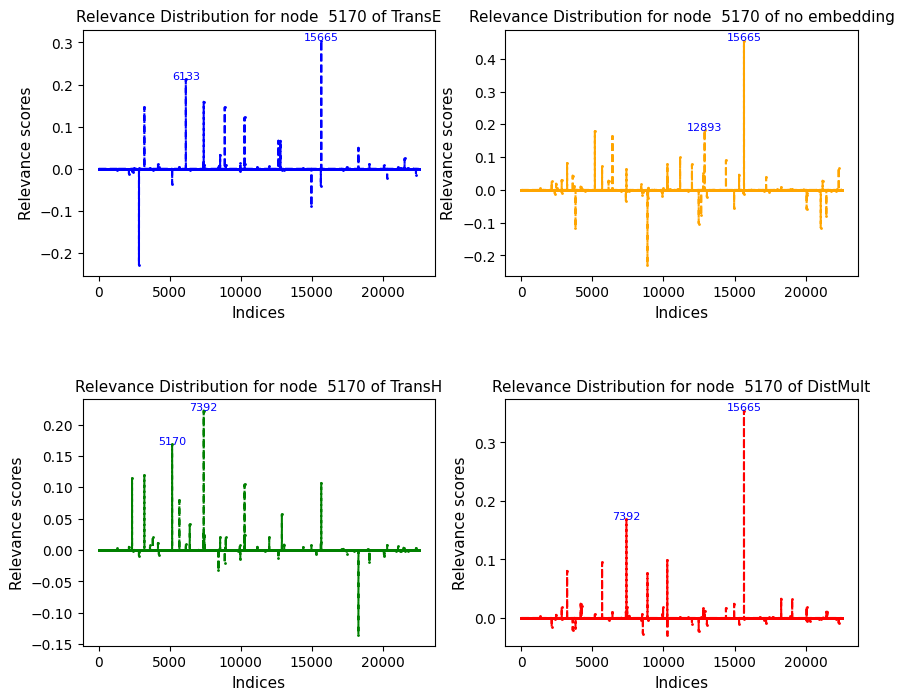

<Figure size 900x600 with 0 Axes>

relevances_node_5234.pt 5234  6164 relevances_edge_9956.pt


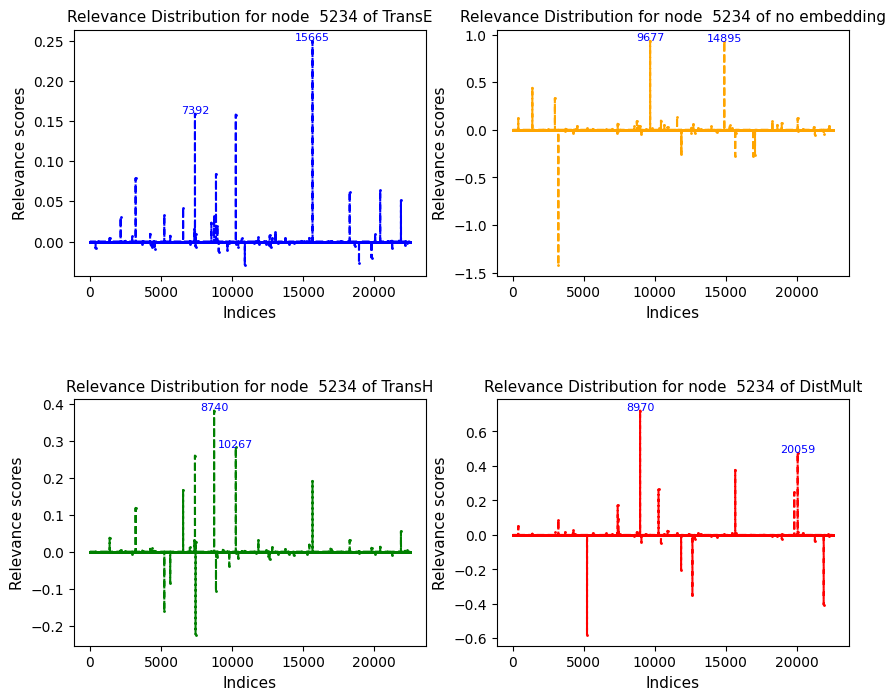

<Figure size 900x600 with 0 Axes>

relevances_node_541.pt 541  6164 relevances_edge_9956.pt


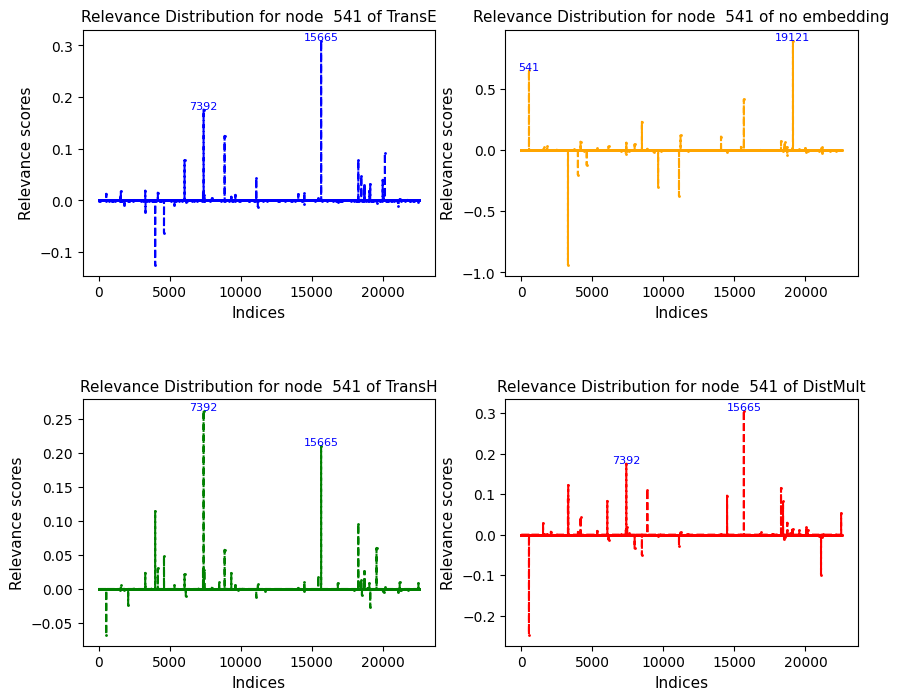

<Figure size 900x600 with 0 Axes>

relevances_node_5643.pt 5643  6164 relevances_edge_9956.pt


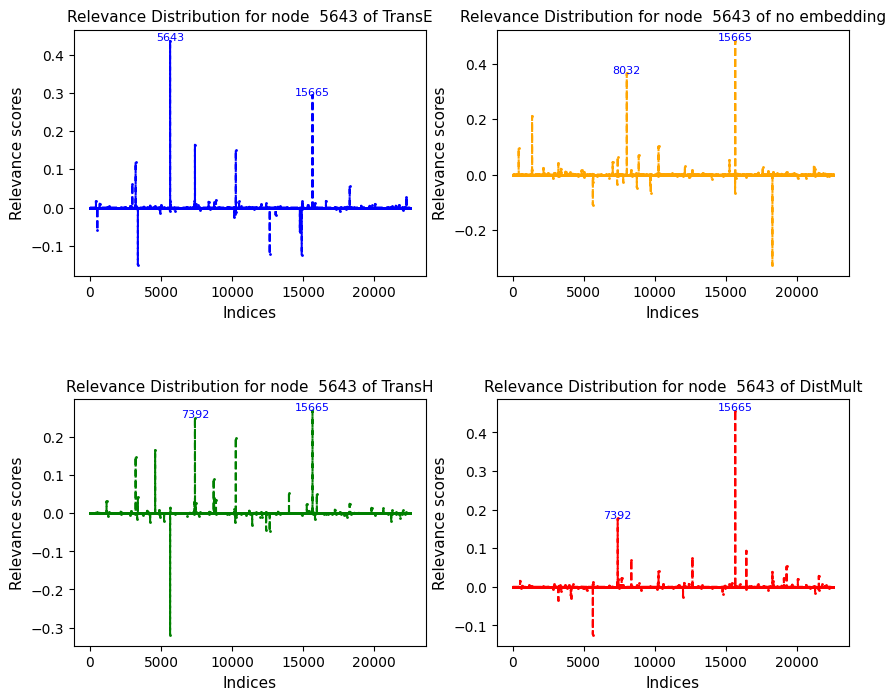

<Figure size 900x600 with 0 Axes>

relevances_node_6607.pt 6607  6164 relevances_edge_9956.pt


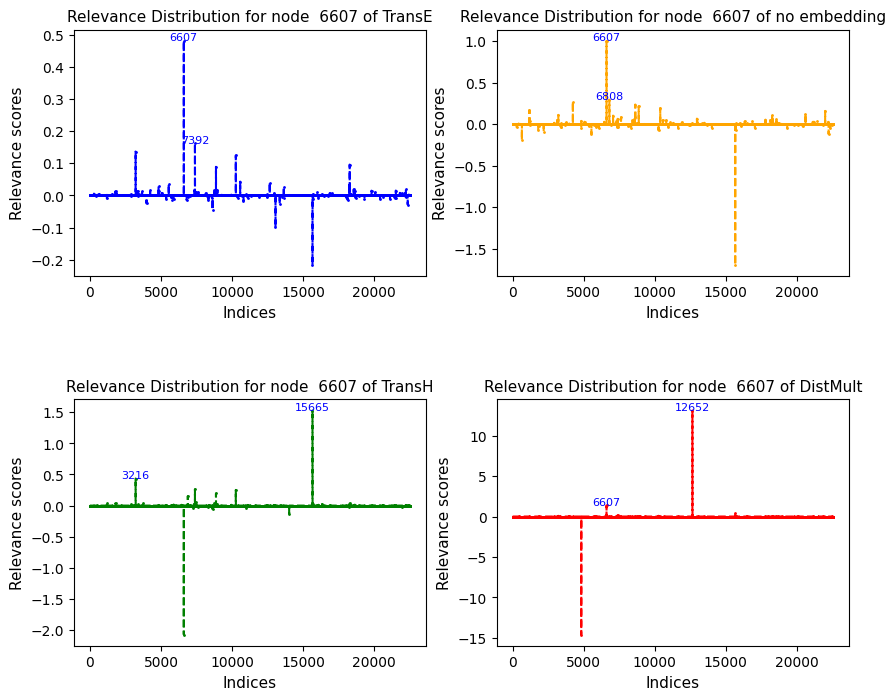

<Figure size 900x600 with 0 Axes>

relevances_node_6744.pt 6744  6164 relevances_edge_9956.pt


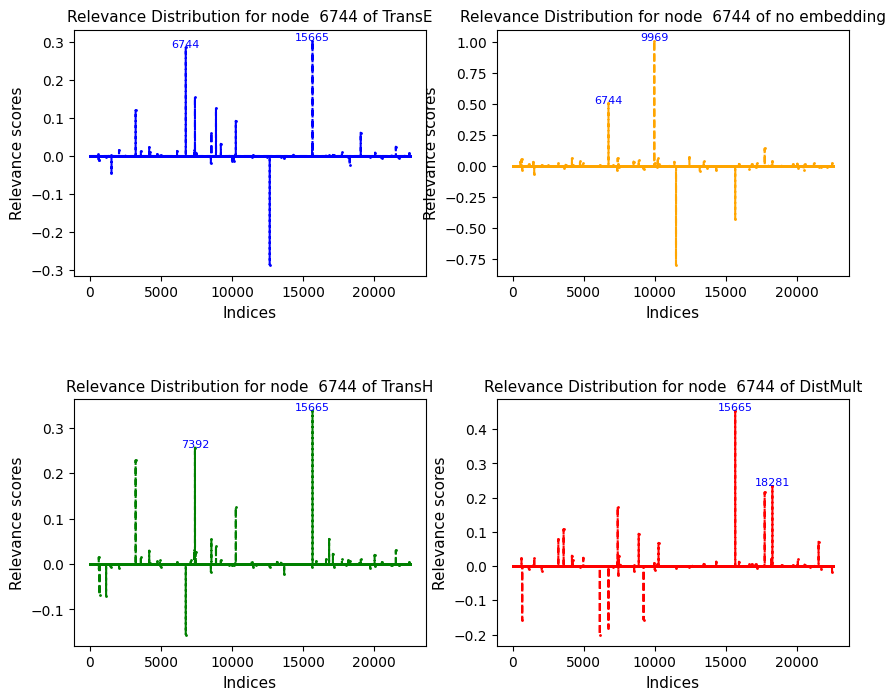

<Figure size 900x600 with 0 Axes>

relevances_node_6785.pt 6785  6164 relevances_edge_9956.pt


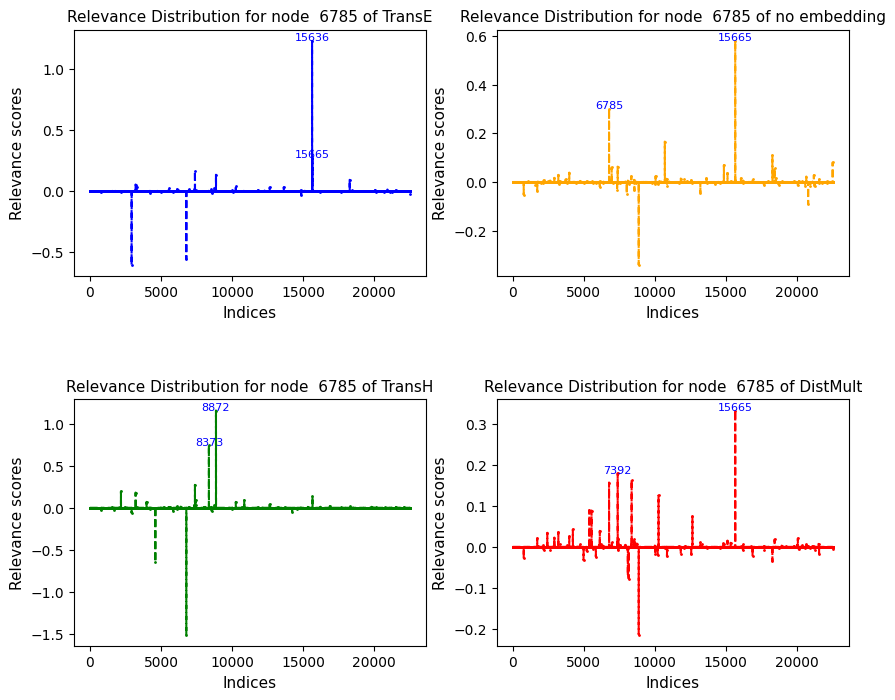

<Figure size 900x600 with 0 Axes>

relevances_node_7271.pt 7271  6164 relevances_edge_9956.pt


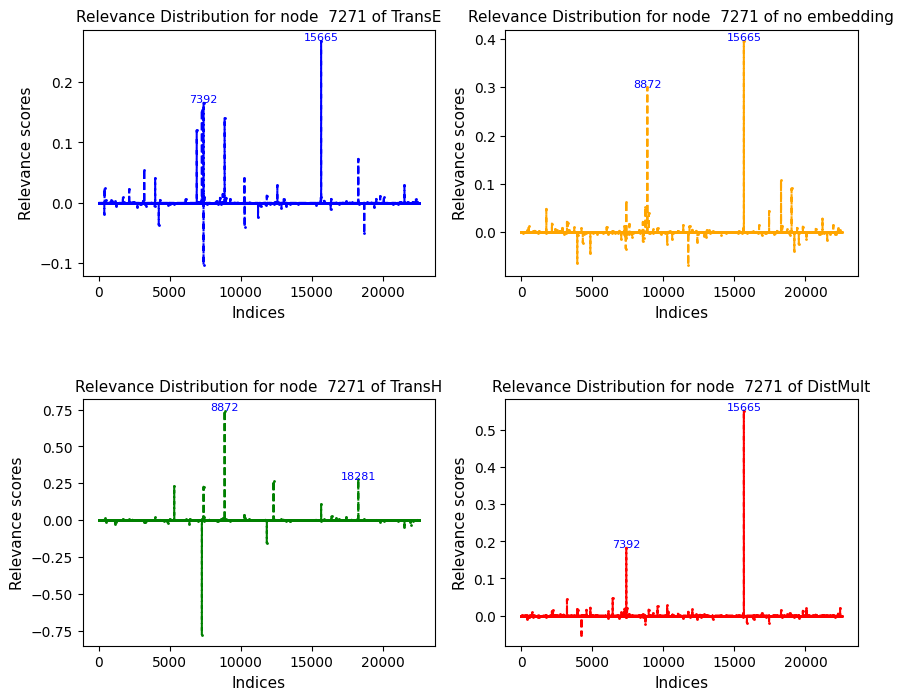

<Figure size 900x600 with 0 Axes>

relevances_node_7315.pt 7315  6164 relevances_edge_9956.pt


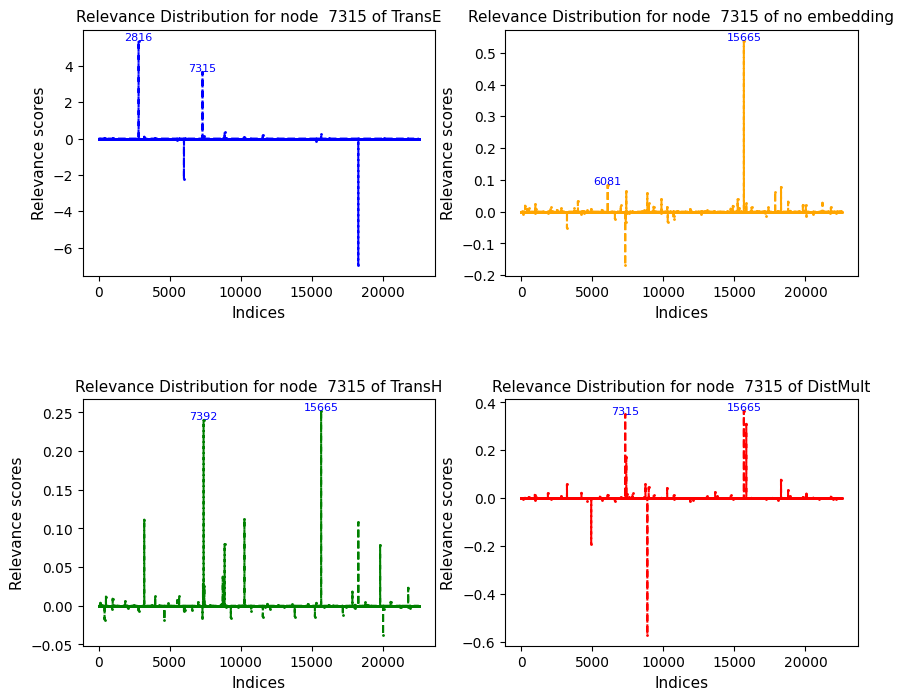

<Figure size 900x600 with 0 Axes>

relevances_node_7417.pt 7417  6164 relevances_edge_9956.pt


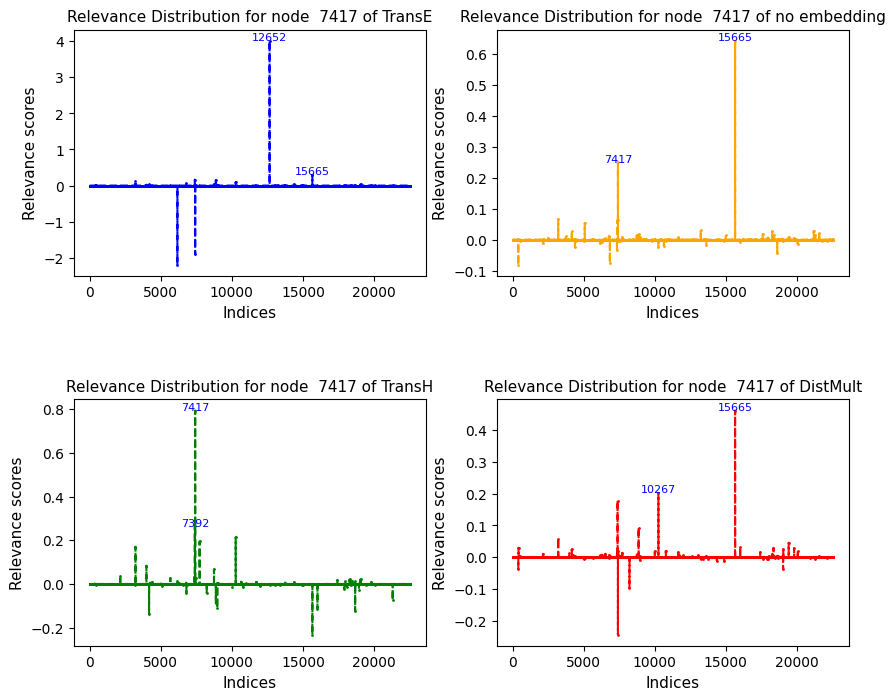

<Figure size 900x600 with 0 Axes>

relevances_node_7860.pt 7860  6164 relevances_edge_9956.pt


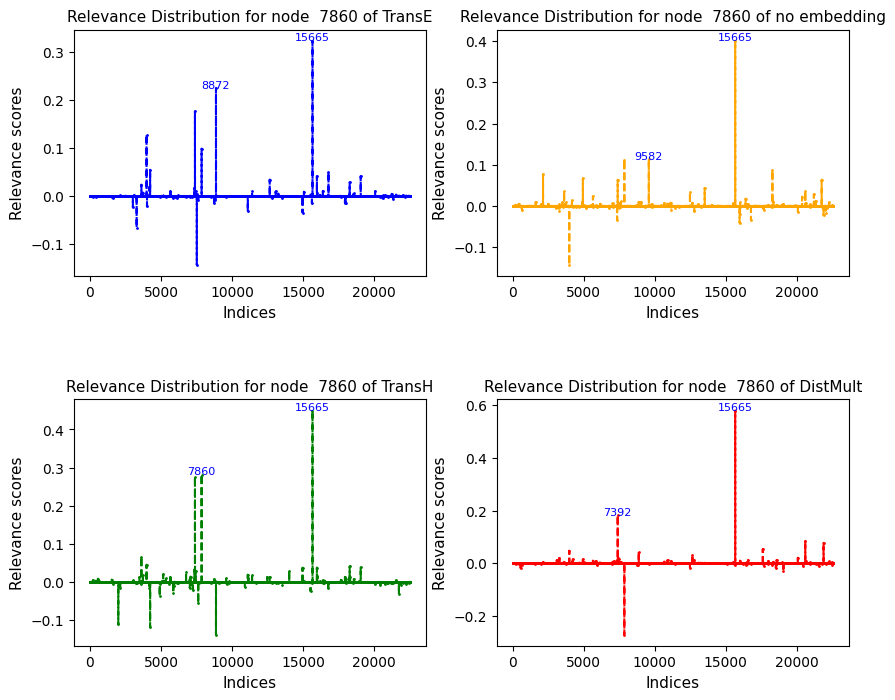

<Figure size 900x600 with 0 Axes>

relevances_node_8783.pt 8783  6164 relevances_edge_9956.pt


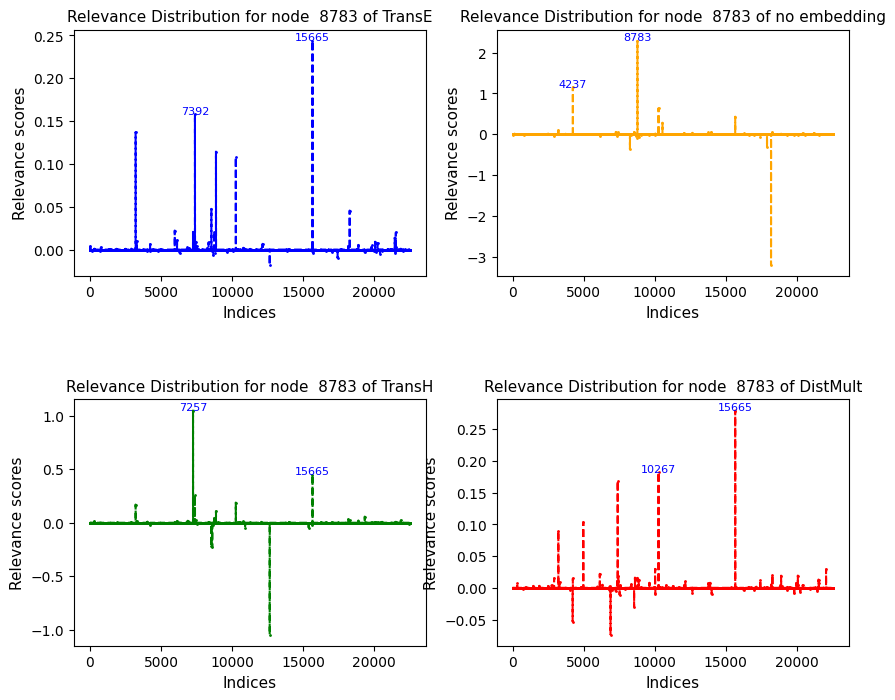

<Figure size 900x600 with 0 Axes>

relevances_node_9082.pt 9082  6164 relevances_edge_9956.pt


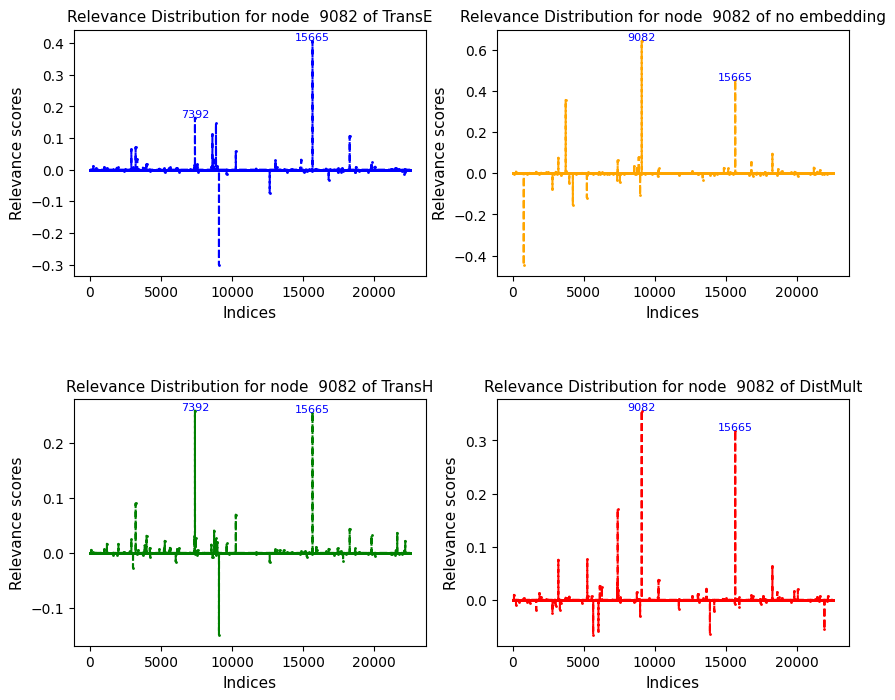

<Figure size 900x600 with 0 Axes>

relevances_node_9376.pt 9376  6164 relevances_edge_9956.pt


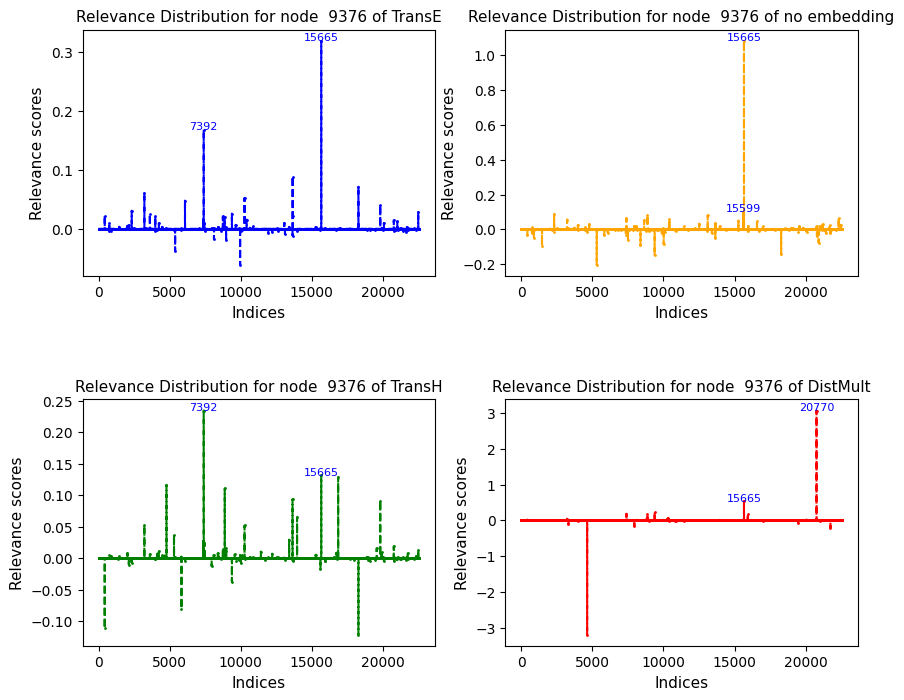

<Figure size 900x600 with 0 Axes>

relevances_node_963.pt 963  6164 relevances_edge_9956.pt


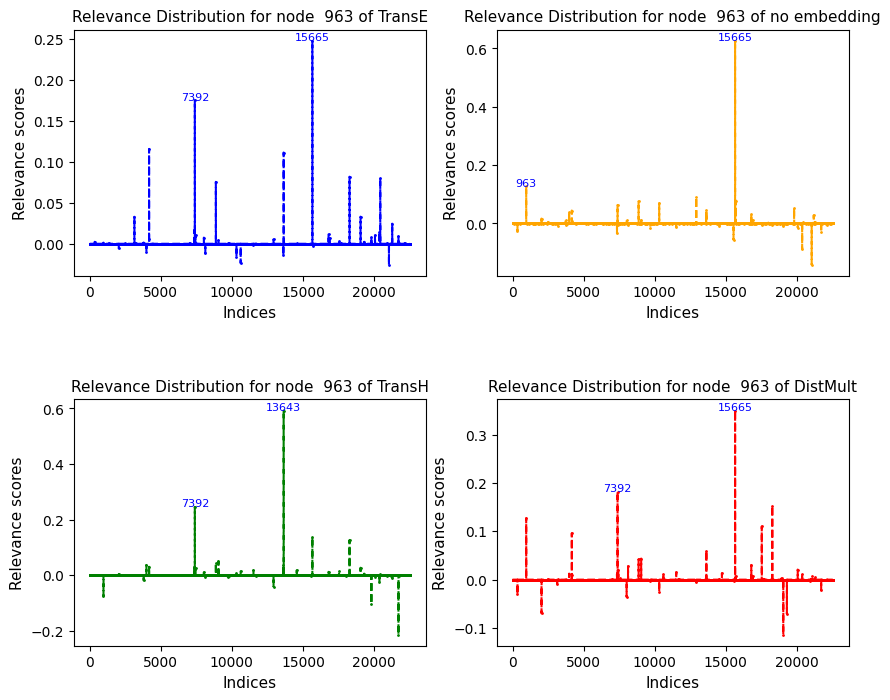

<Figure size 900x600 with 0 Axes>

relevances_node_9637.pt 9637  6164 relevances_edge_9956.pt


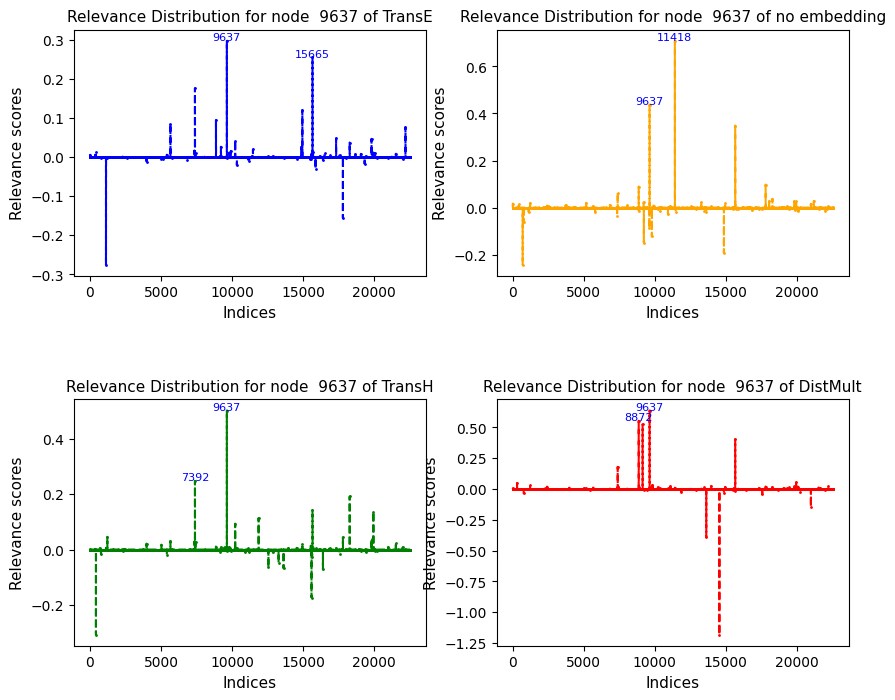

<Figure size 900x600 with 0 Axes>

relevances_node_9704.pt 9704  6164 relevances_edge_9956.pt


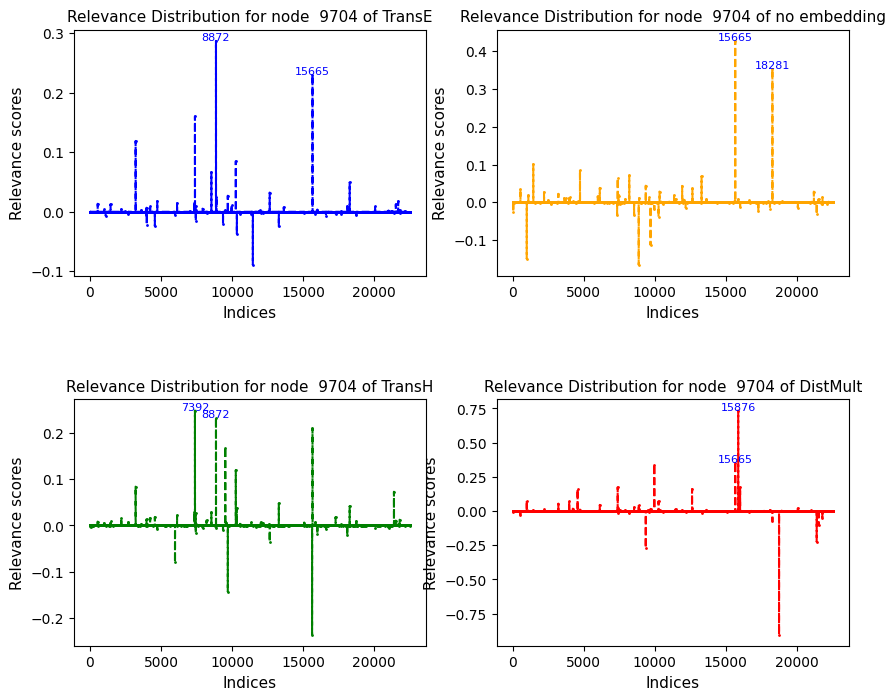

<Figure size 900x600 with 0 Axes>

relevances_node_9956.pt 9956  6164 relevances_edge_9956.pt


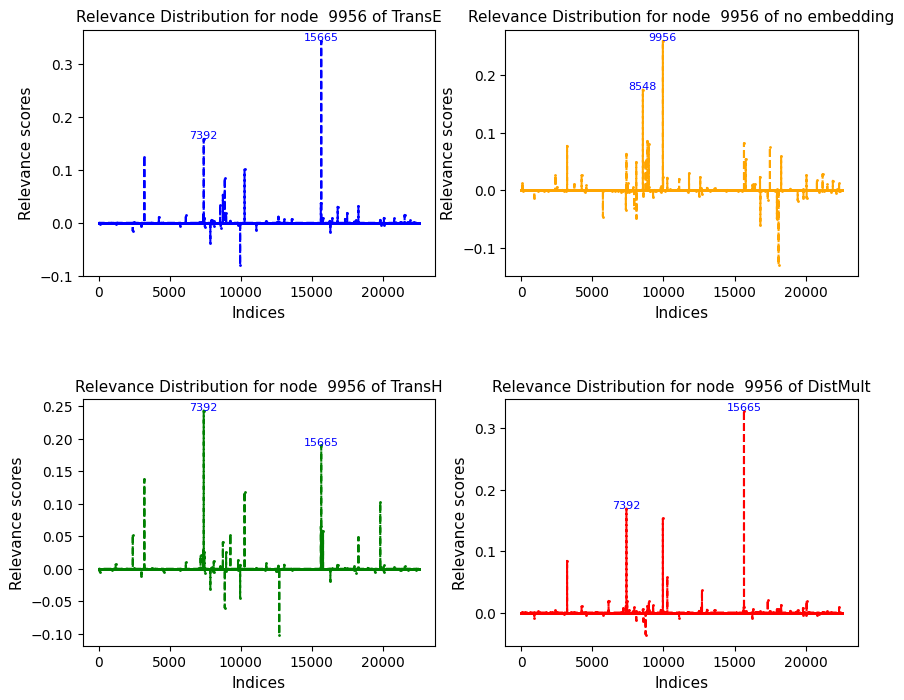

<Figure size 900x600 with 0 Axes>

In [28]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'
path_dist = 'out/MUTAG/RGCN_emb/DistMult/relevances/'
path_transe = 'out/MUTAG/RGCN_emb/TransE/relevances/'
path_transh = 'out/MUTAG/RGCN_emb/TransH/relevances/'
fil = os.listdir(path)
fil_transe = os.listdir('out/MUTAG/RGCN_emb/TransE/relevances/')
fil_transh = os.listdir('out/MUTAG/RGCN_emb/TransH/relevances/')
fil_dist = os.listdir('out/MUTAG/RGCN_emb/DistMult/relevances/')
rel_no = [file for file in fil if file.startswith("relevances_node_")]
rel_transe = [file for file in fil if file.startswith("relevances_node_")]
rel_transh = [file for file in fil if file.startswith("relevances_node_")]
rel_dist = [file for file in fil if file.startswith("relevances_node_")]

dfs = []
for rel in rel_transe:
    rte = torch.load(path_transe+rel).to_dense().detach().numpy()
    node_name = rel.split('node_')[1].split('.')[0]


    print(rel, node_name, adapt_node, rel2)
    rno = torch.load(path+rel).to_dense().detach().numpy()
    rth = torch.load(path_transh+rel).to_dense().detach().numpy()
    rdi = torch.load(path_dist+rel).to_dense().detach().numpy()
    #ra = np.sort(ra)
    #rb = np.sort(rb)
    #Create an array of indices for the sorted data
    indices = np.arange(1, len(rte) + 1)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.5})
    # Create a line plot with different line styles and markers
    plt.figure(figsize=(9, 6))
    axes[0,0].plot(indices, rte, color='blue', linestyle='--', marker='.', markersize=2, label='Relevance TransE')
    axes[0,1].plot(indices, rno, color='orange', linestyle='--', marker='.', markersize=2, label='Relevance no embedding')
    axes[1,0].plot(indices, rth, color='green', linestyle='--', marker='.', markersize=2, label='Relevance TransH')
    axes[1,1].plot(indices, rdi, color='red', linestyle='--', marker='.', markersize=2, label='Relevance DistMult')
    emb_type = ['TransE', 'no embedding', 'TransH', 'DistMult']
    plt.tight_layout()
    for i, ax in enumerate(axes.flatten()):
        ax.set_xlabel('Indices', fontsize=11)
        ax.set_ylabel('Relevance scores', fontsize=11)
        ax.set_title('Relevance Distribution for node  {} of {}'.format(node_name, emb_type[i]), fontsize=11)


        highest_indices = np.argsort(-[rte, rno, rth, rdi][i])[:2]
        #lowest_indices = np.argsort([rte, rno, rth, rdi][i])[:2]

        # Annotate highest indices at the top of the plot
        for idx in highest_indices:
            ax.annotate(str(idx), xy=(indices[idx], [rte, rno, rth, rdi][i][idx]),
                     xytext=(0, 0.1), textcoords='offset points', ha='center', fontsize=8, color='blue')


    plt.show()

### EDGE RELEVANCE

relevances_edge_101.pt 101


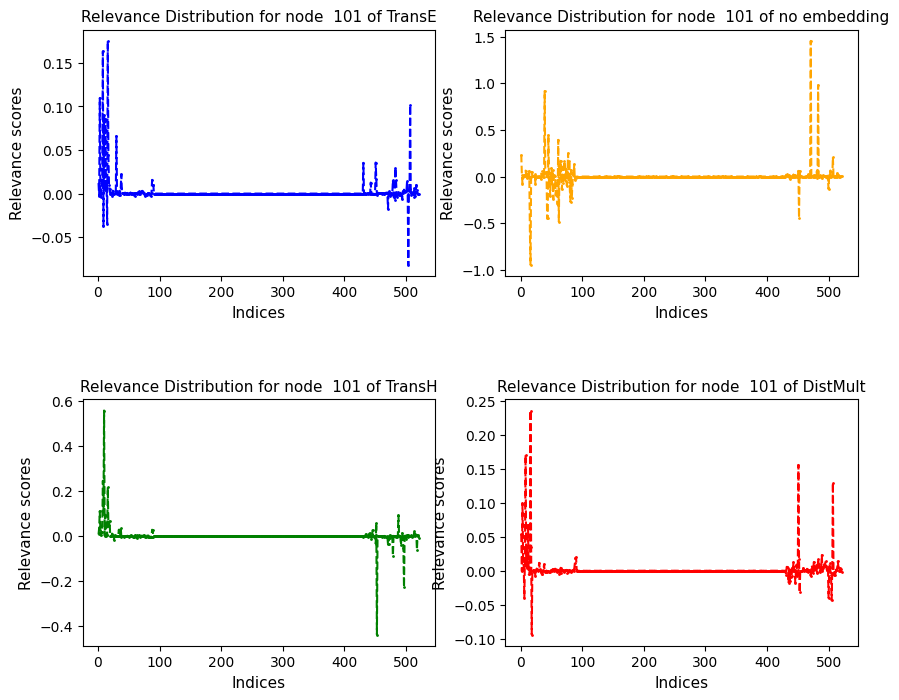

<Figure size 900x600 with 0 Axes>

relevances_edge_10172.pt 10172


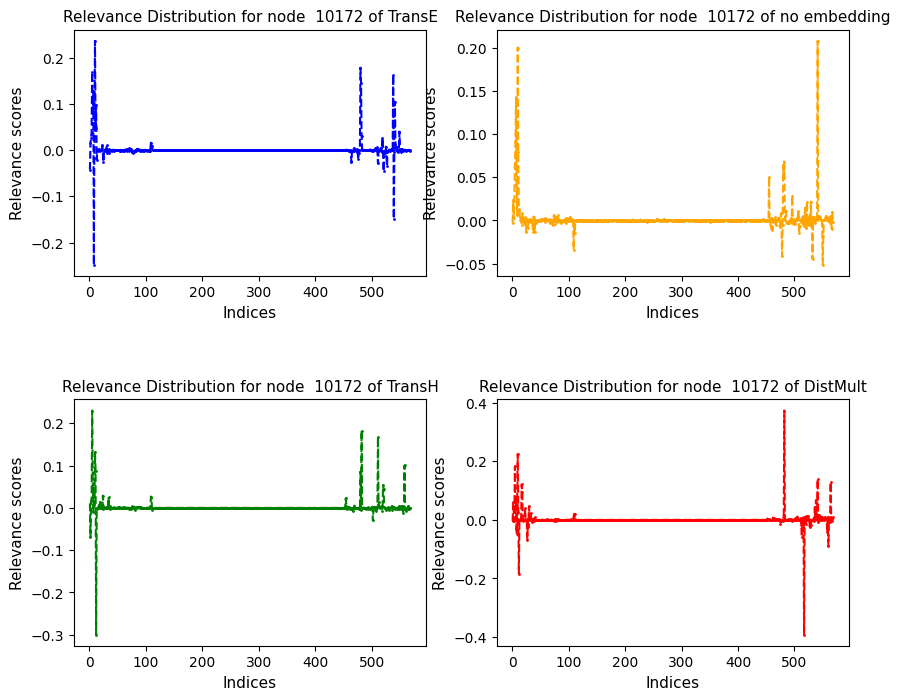

<Figure size 900x600 with 0 Axes>

relevances_edge_10248.pt 10248


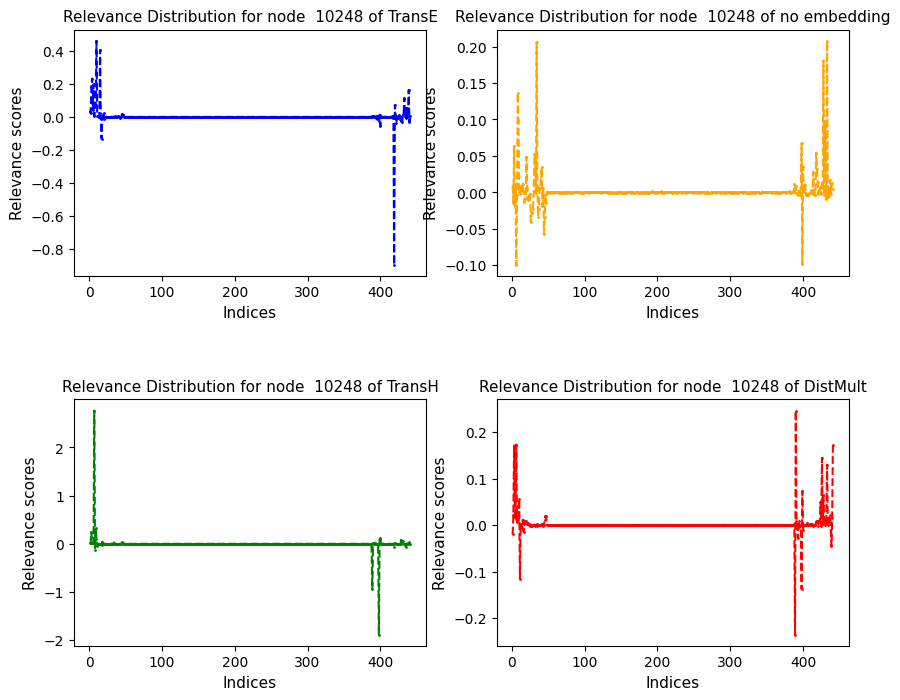

<Figure size 900x600 with 0 Axes>

relevances_edge_10336.pt 10336


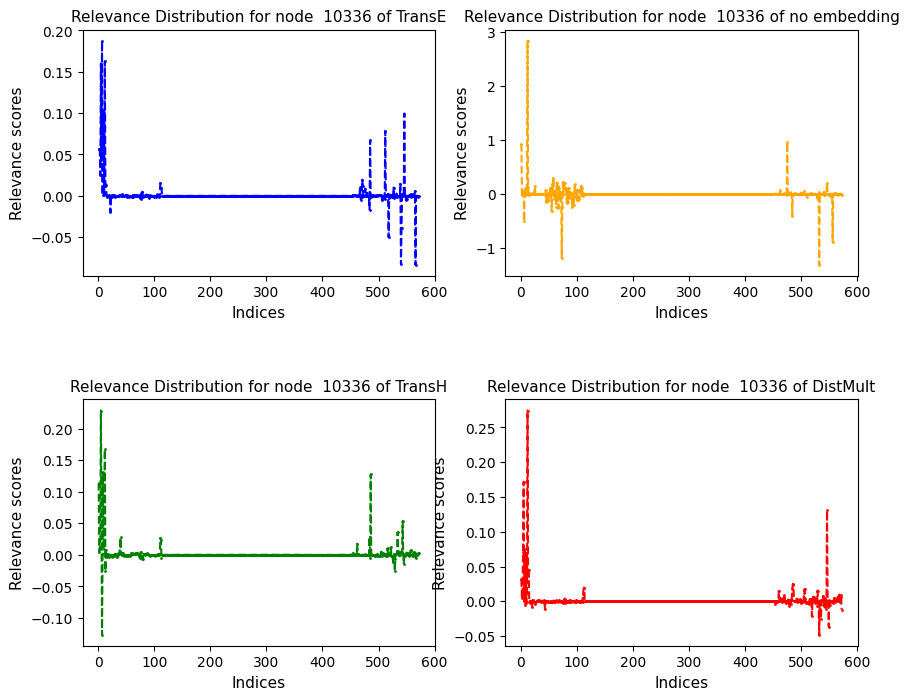

<Figure size 900x600 with 0 Axes>

relevances_edge_10582.pt 10582


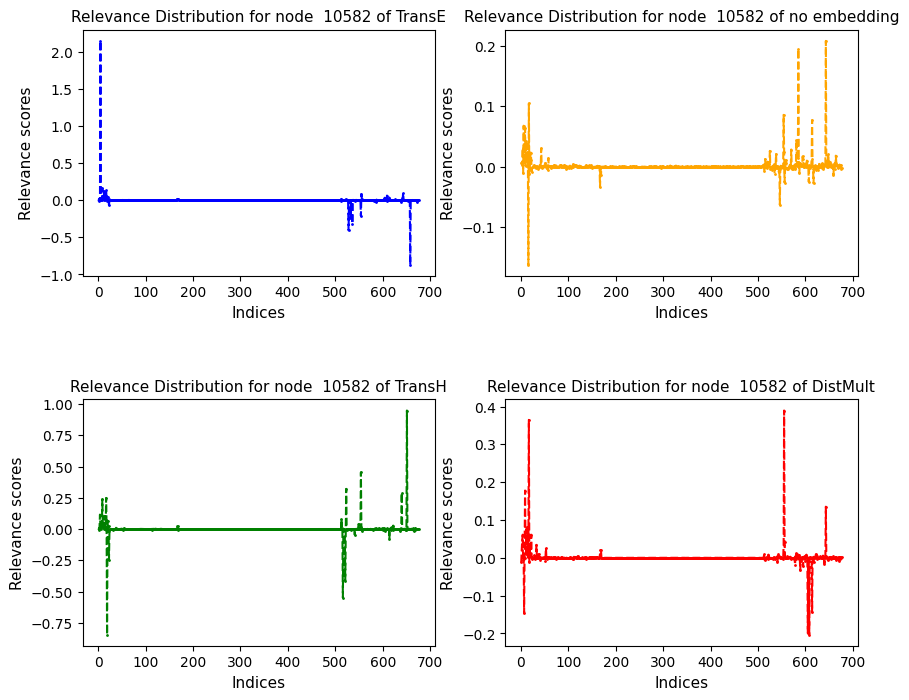

<Figure size 900x600 with 0 Axes>

relevances_edge_10620.pt 10620


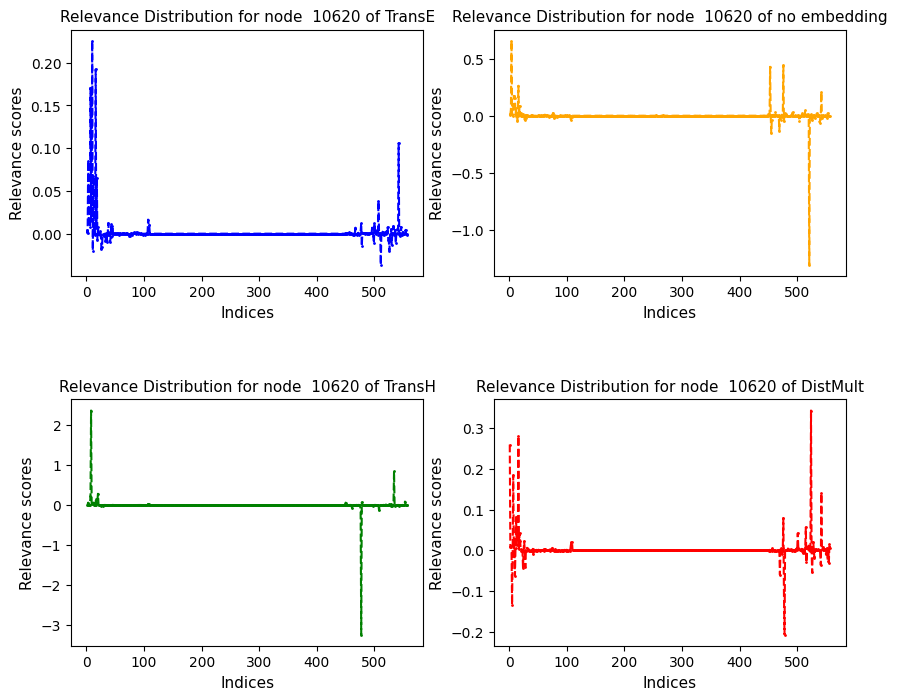

<Figure size 900x600 with 0 Axes>

relevances_edge_10768.pt 10768


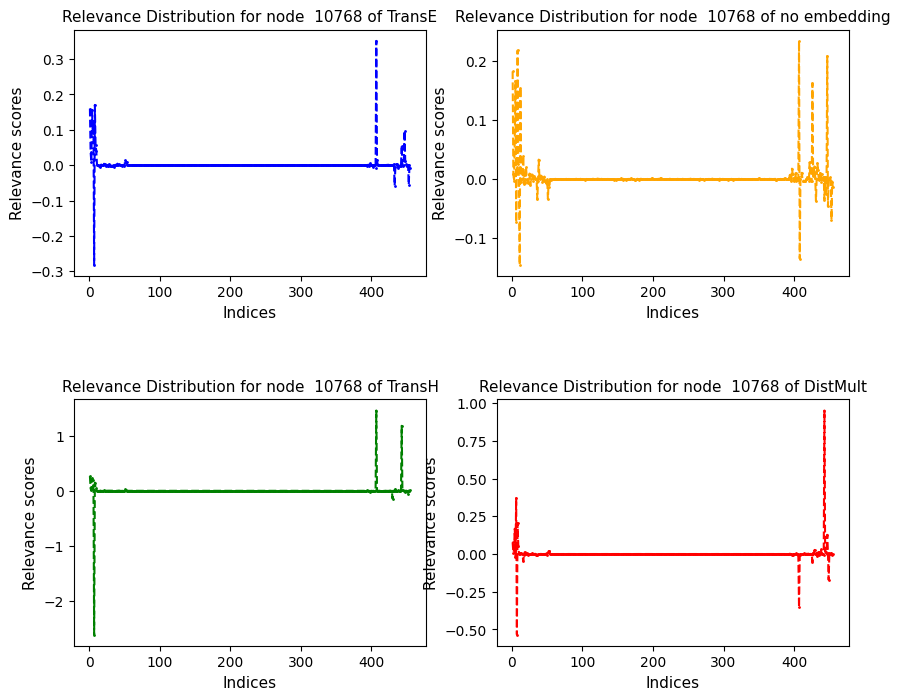

<Figure size 900x600 with 0 Axes>

relevances_edge_11150.pt 11150


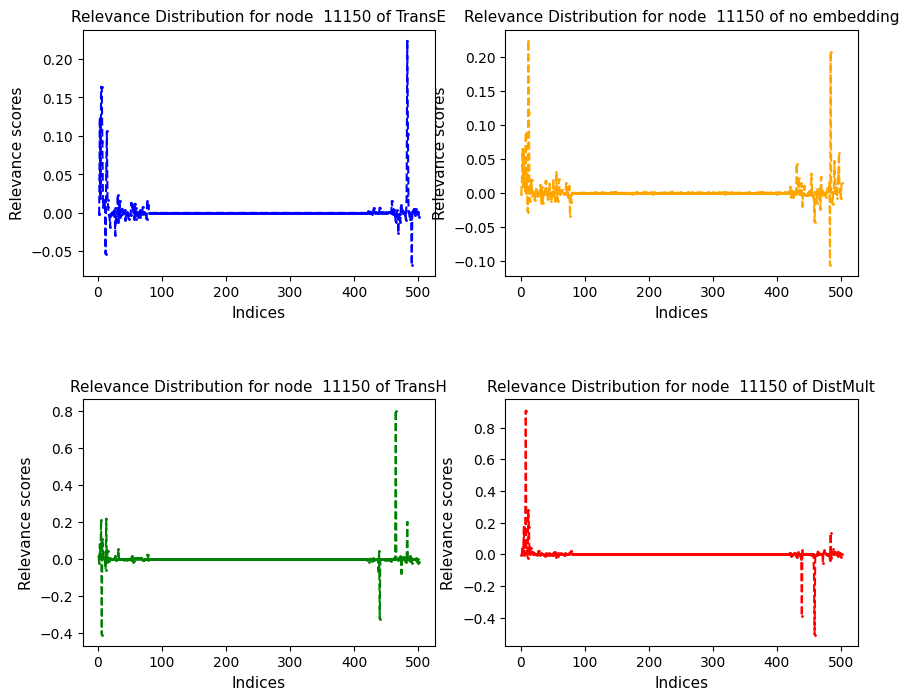

<Figure size 900x600 with 0 Axes>

relevances_edge_11213.pt 11213


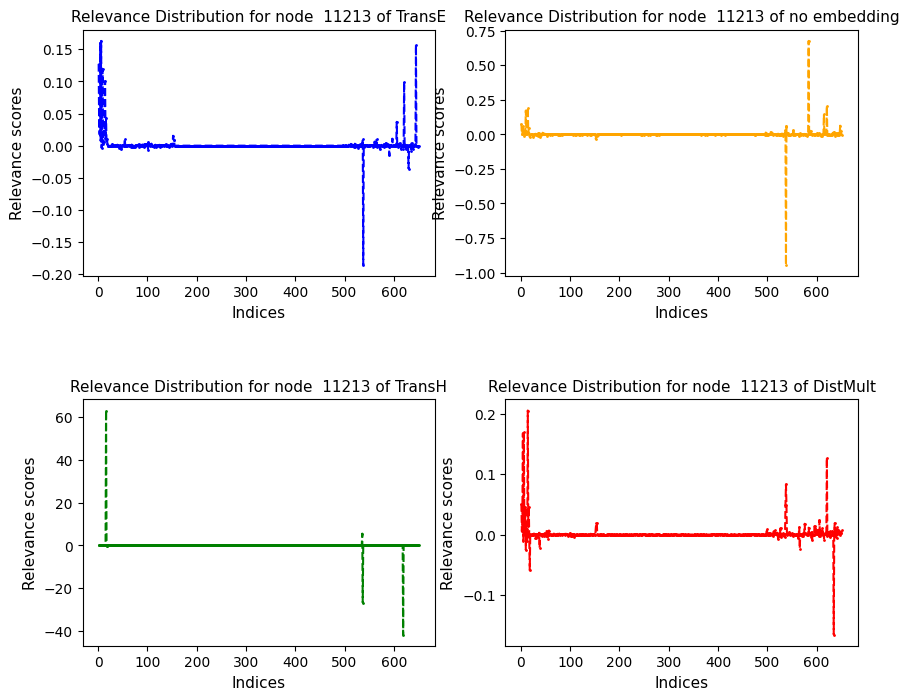

<Figure size 900x600 with 0 Axes>

relevances_edge_1166.pt 1166


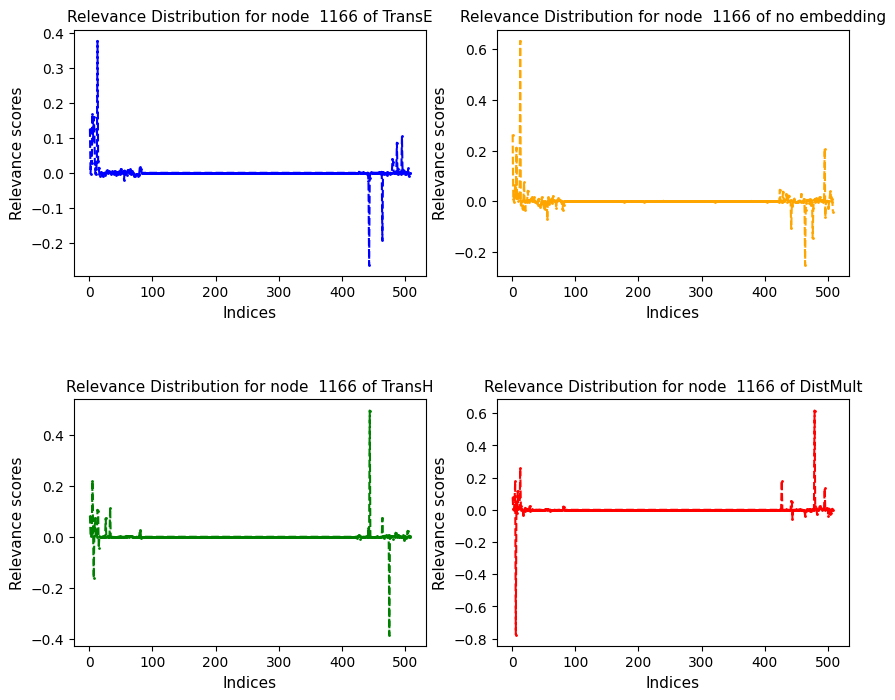

<Figure size 900x600 with 0 Axes>

relevances_edge_11934.pt 11934


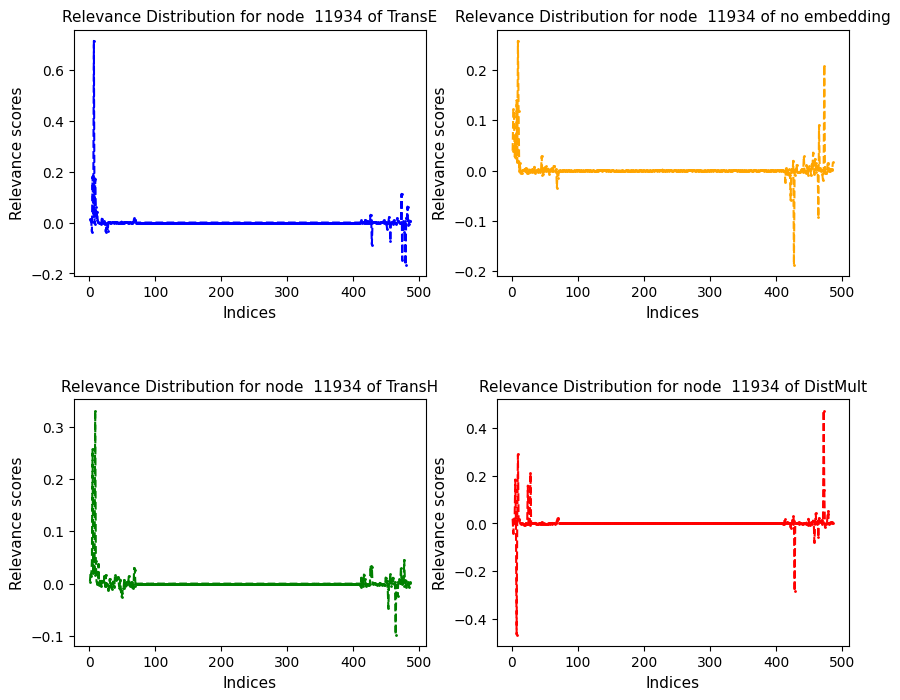

<Figure size 900x600 with 0 Axes>

relevances_edge_12544.pt 12544


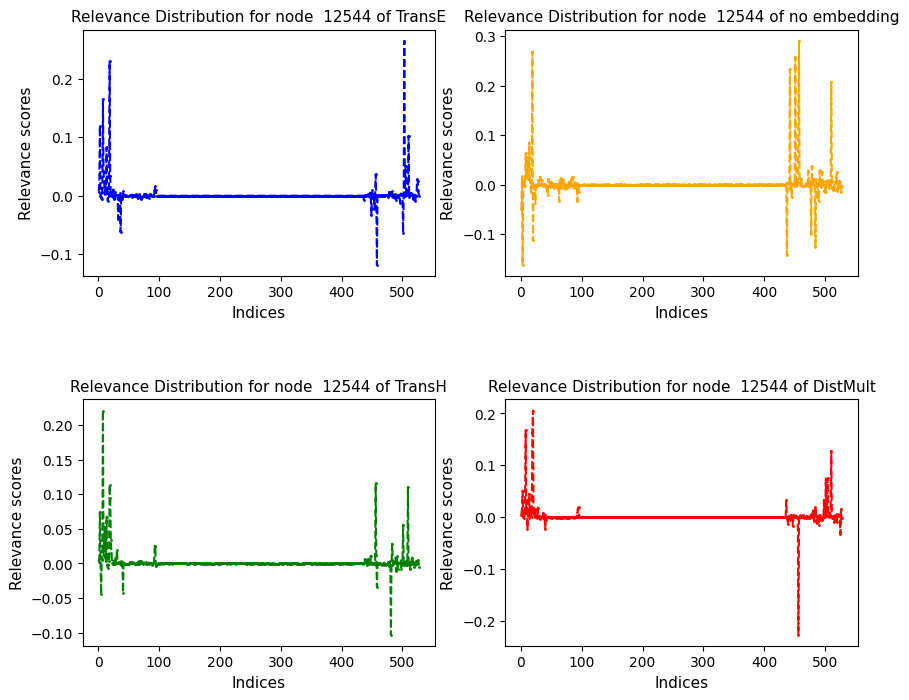

<Figure size 900x600 with 0 Axes>

relevances_edge_12917.pt 12917


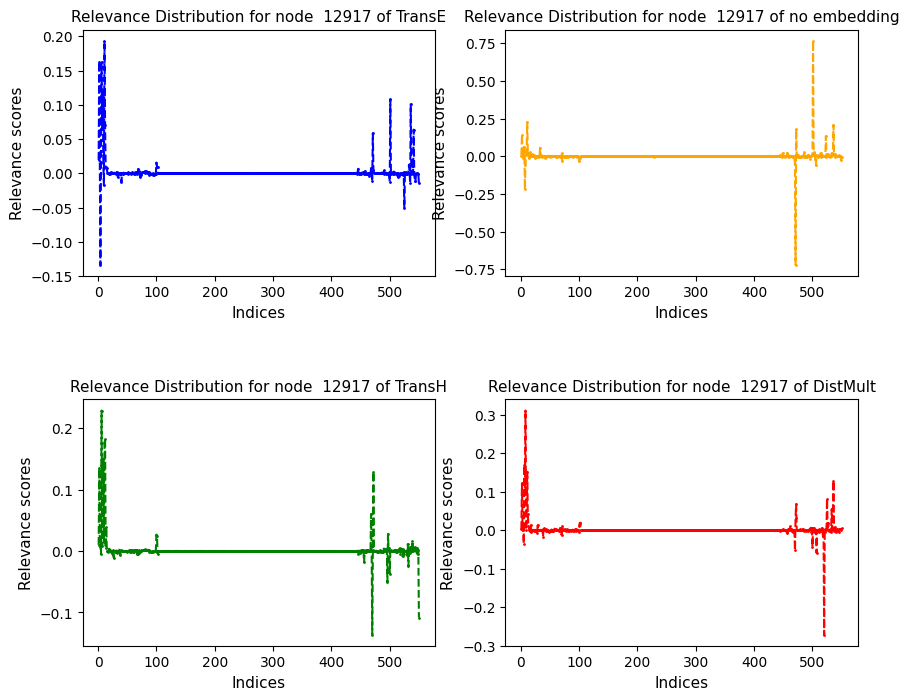

<Figure size 900x600 with 0 Axes>

relevances_edge_13333.pt 13333


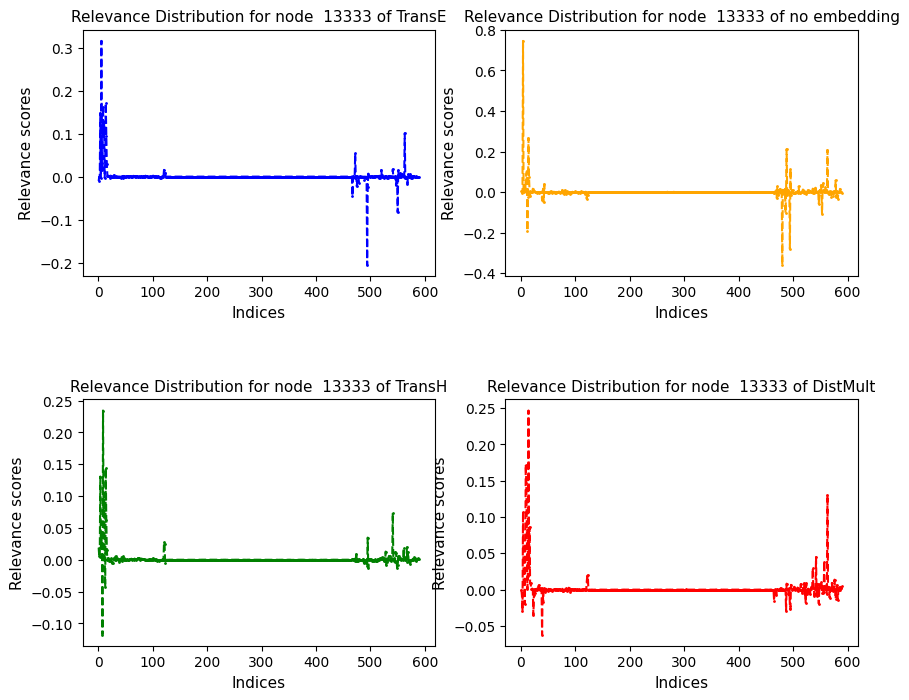

<Figure size 900x600 with 0 Axes>

relevances_edge_13510.pt 13510


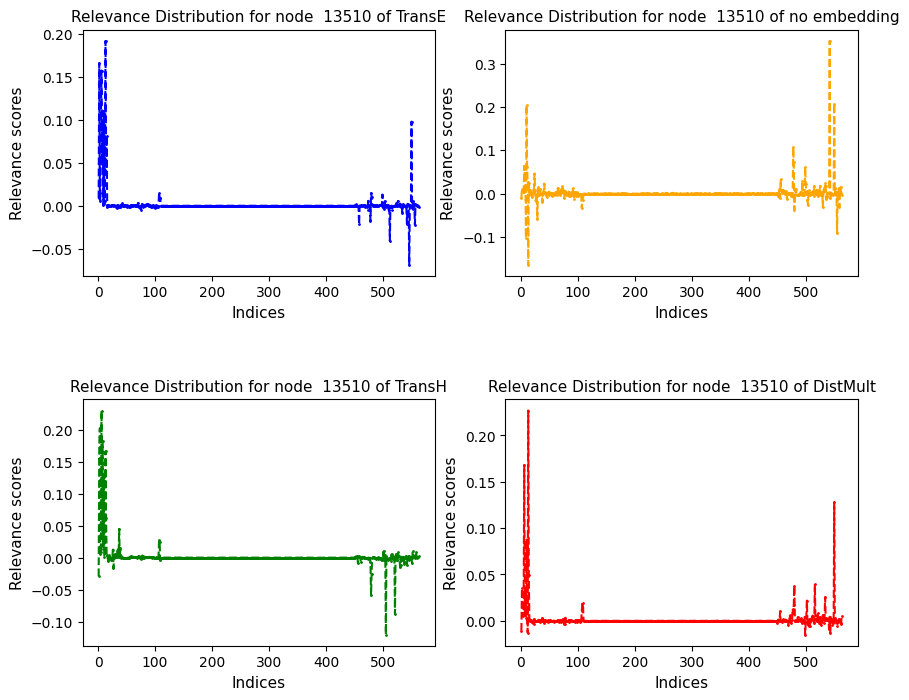

<Figure size 900x600 with 0 Axes>

relevances_edge_13745.pt 13745


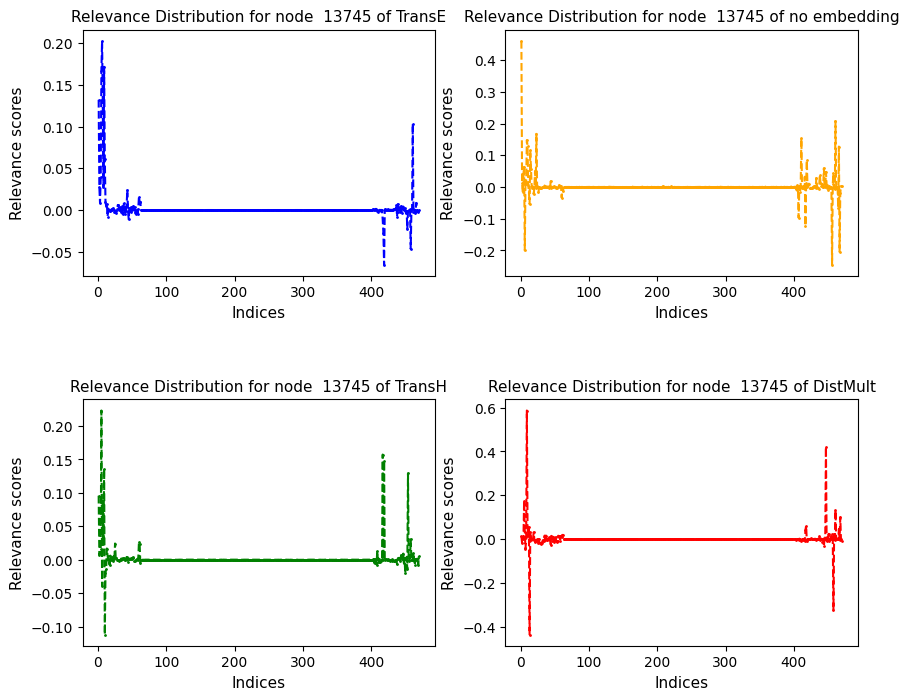

<Figure size 900x600 with 0 Axes>

relevances_edge_14021.pt 14021


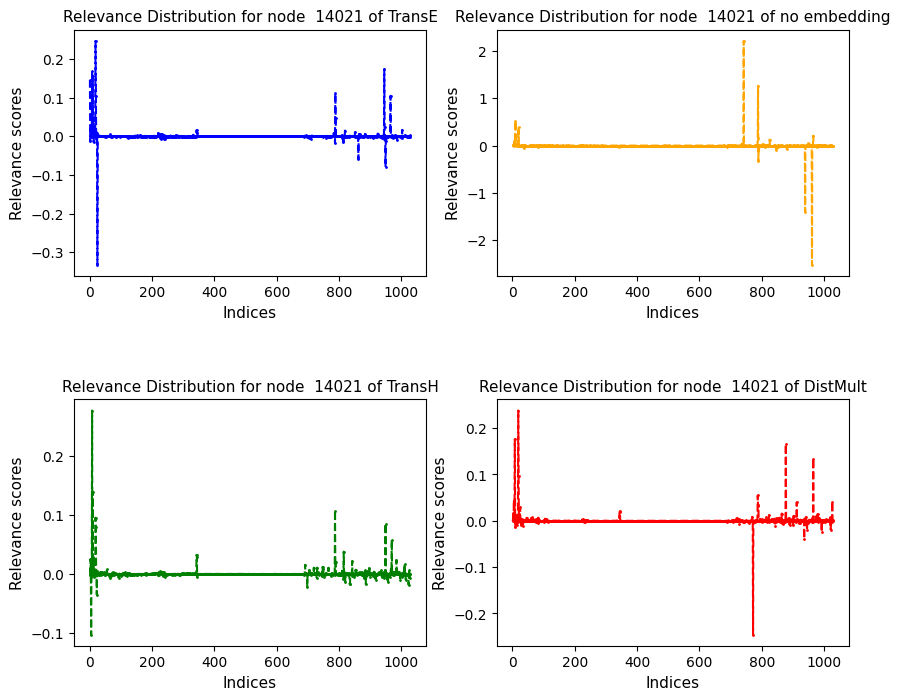

<Figure size 900x600 with 0 Axes>

relevances_edge_15108.pt 15108


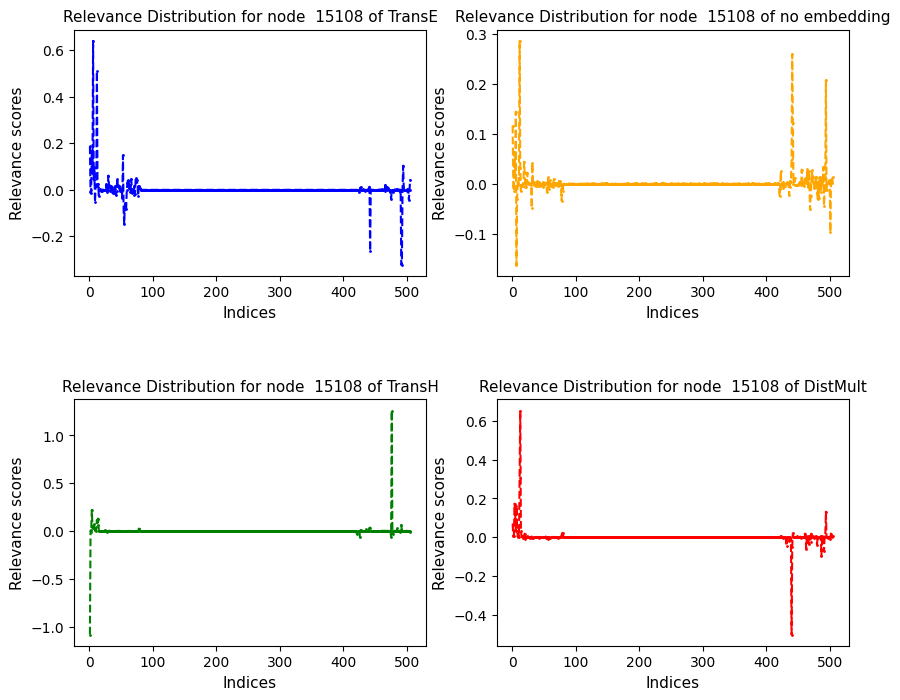

<Figure size 900x600 with 0 Axes>

relevances_edge_1543.pt 1543


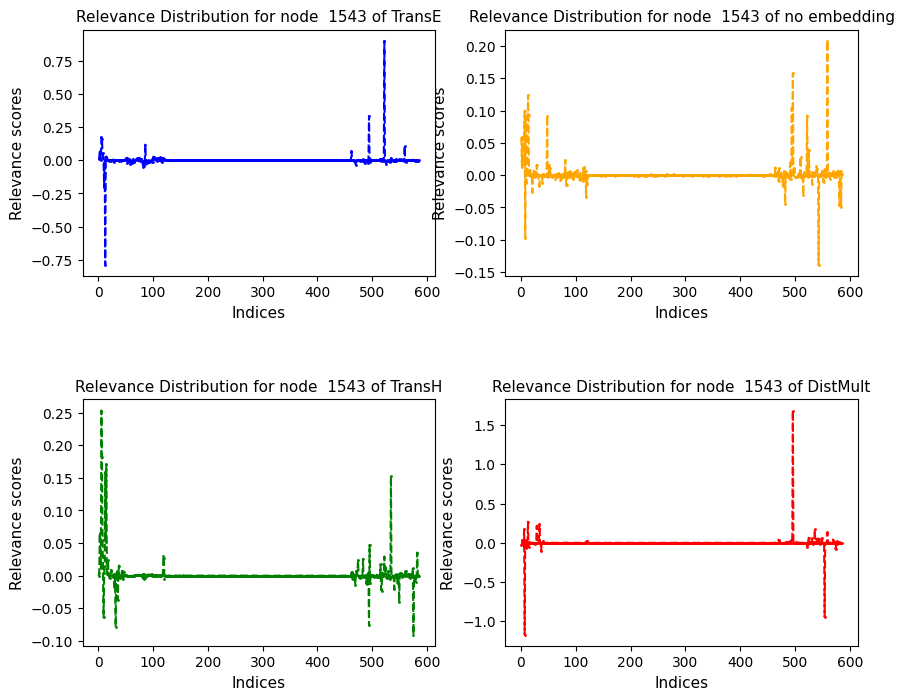

<Figure size 900x600 with 0 Axes>

relevances_edge_15542.pt 15542


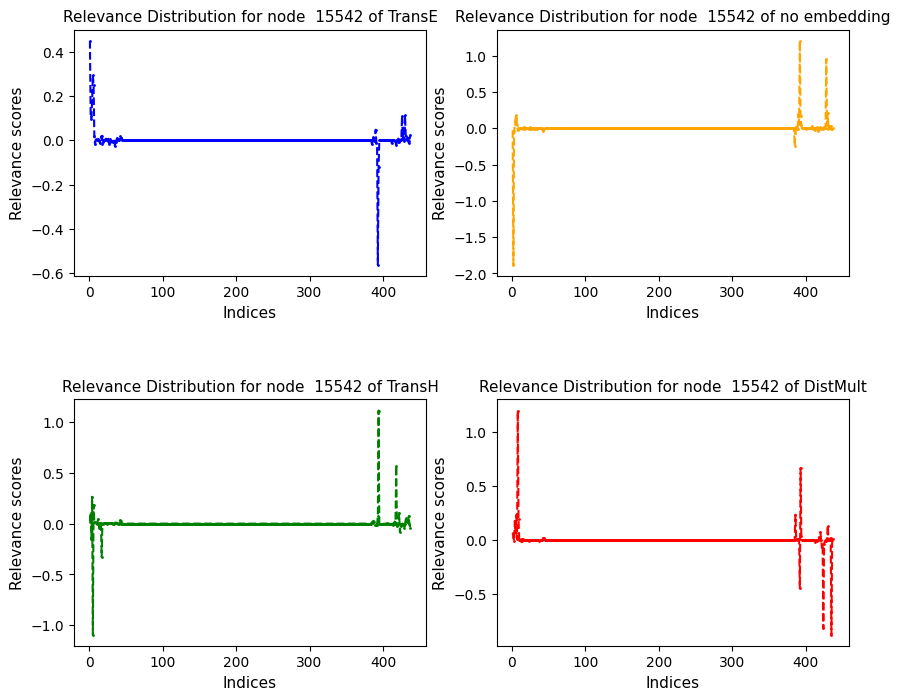

<Figure size 900x600 with 0 Axes>

relevances_edge_15956.pt 15956


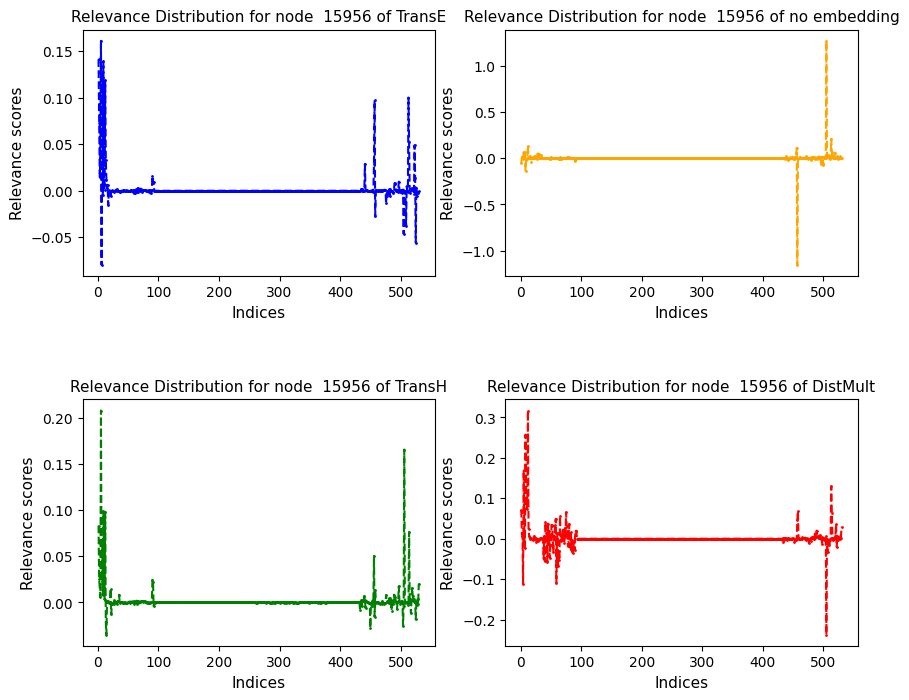

<Figure size 900x600 with 0 Axes>

relevances_edge_16980.pt 16980


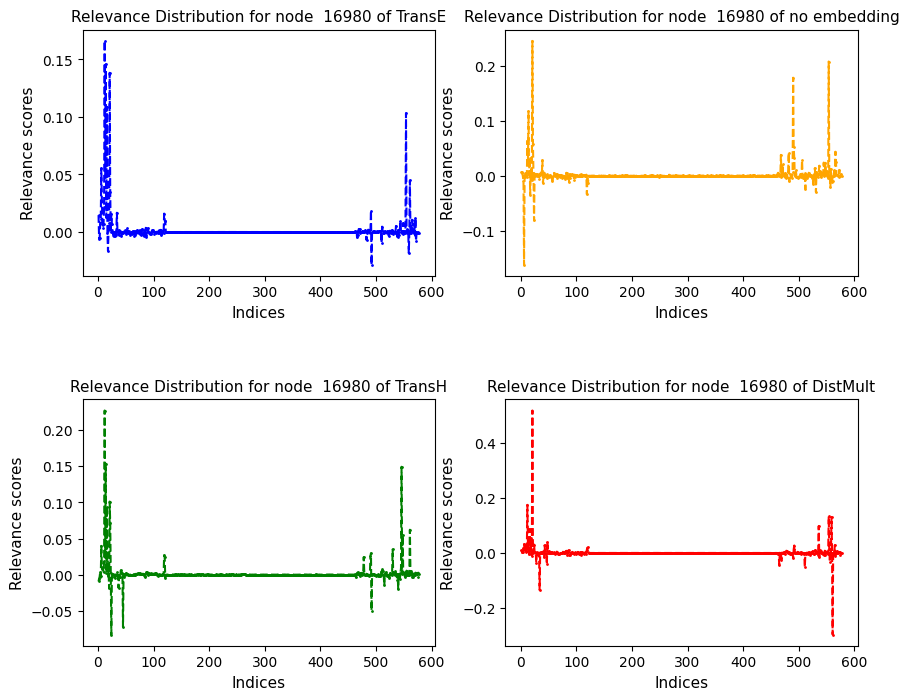

<Figure size 900x600 with 0 Axes>

relevances_edge_17531.pt 17531


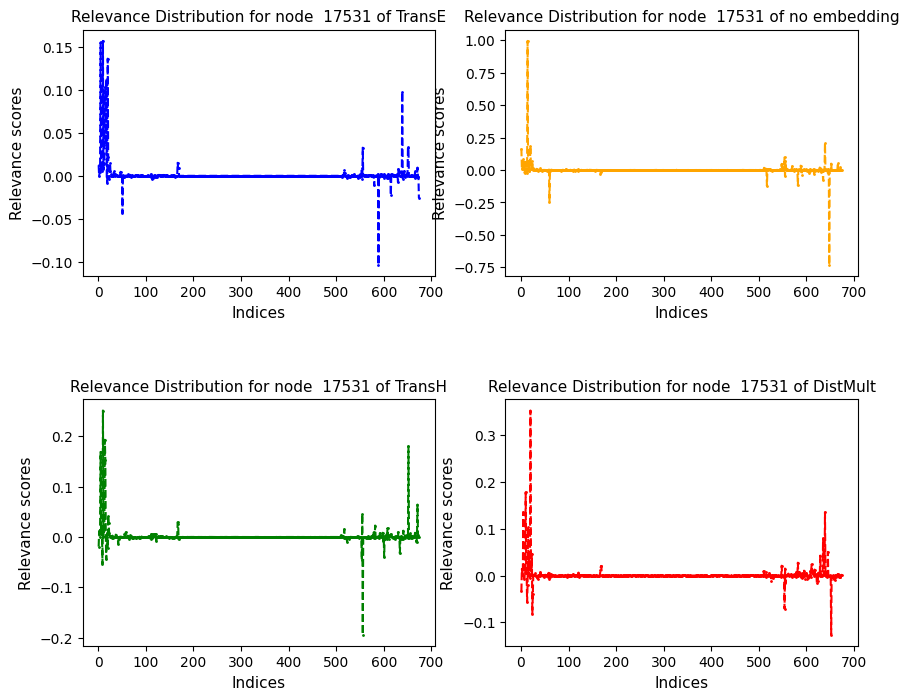

<Figure size 900x600 with 0 Axes>

relevances_edge_17777.pt 17777


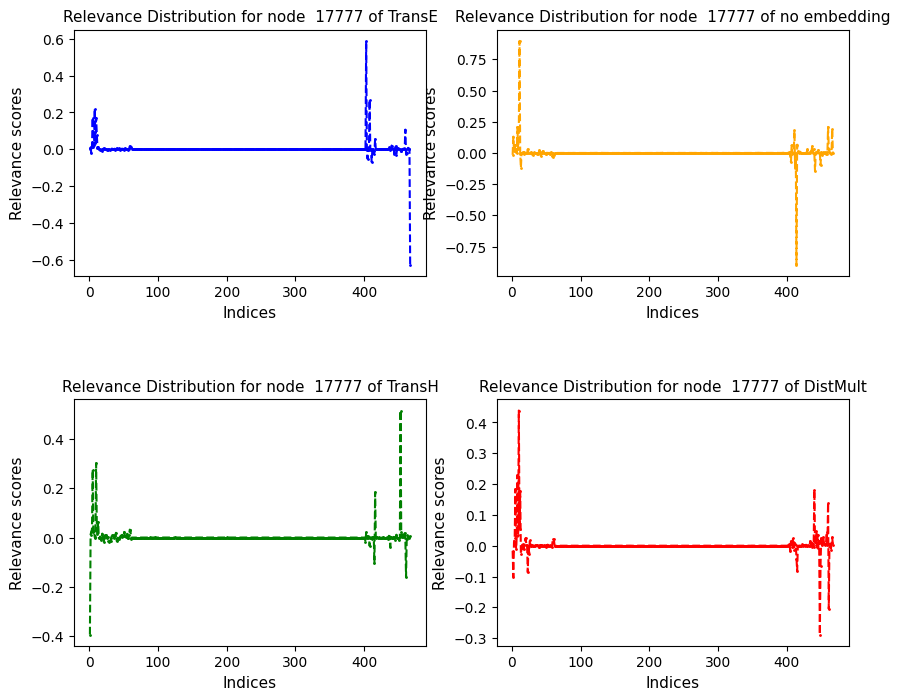

<Figure size 900x600 with 0 Axes>

relevances_edge_18218.pt 18218


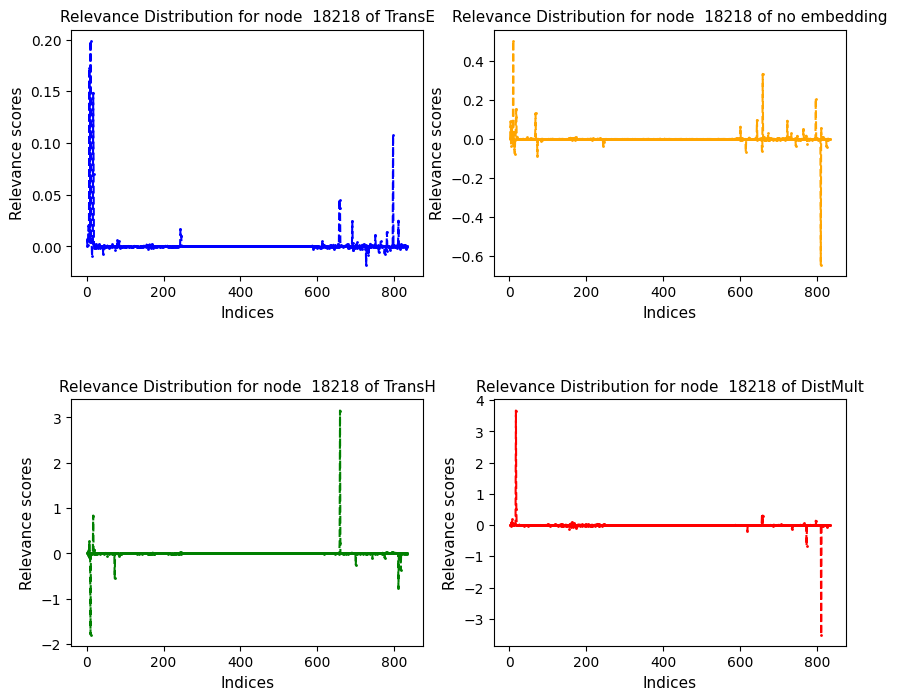

<Figure size 900x600 with 0 Axes>

relevances_edge_18276.pt 18276


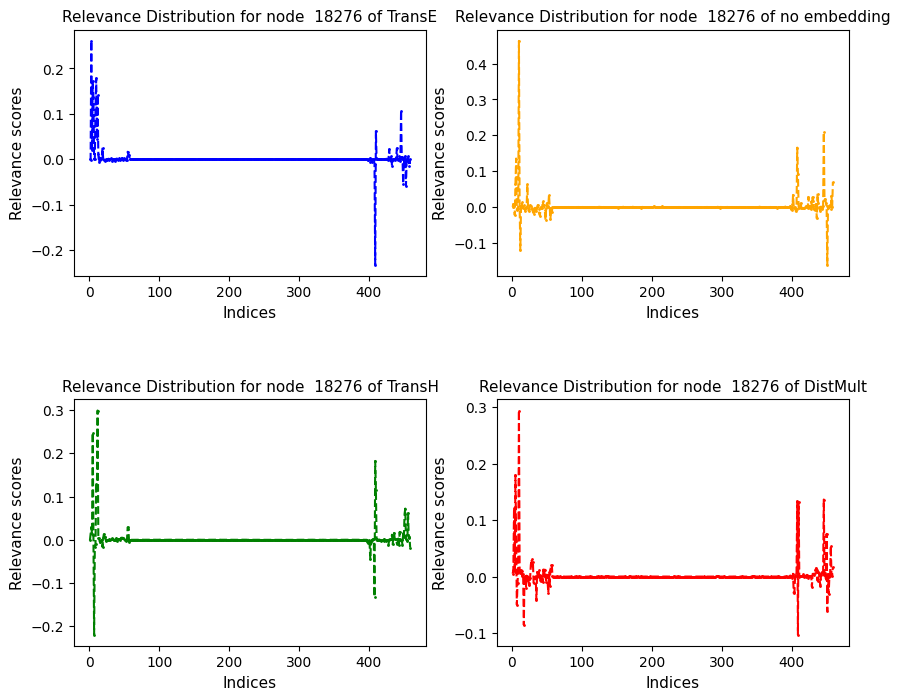

<Figure size 900x600 with 0 Axes>

relevances_edge_19216.pt 19216


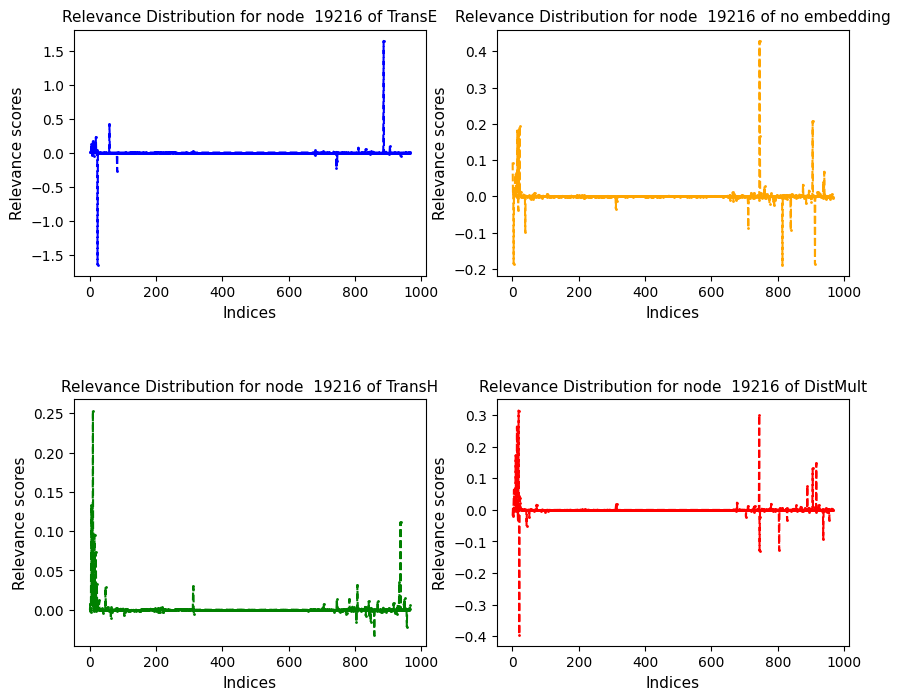

<Figure size 900x600 with 0 Axes>

relevances_edge_19233.pt 19233


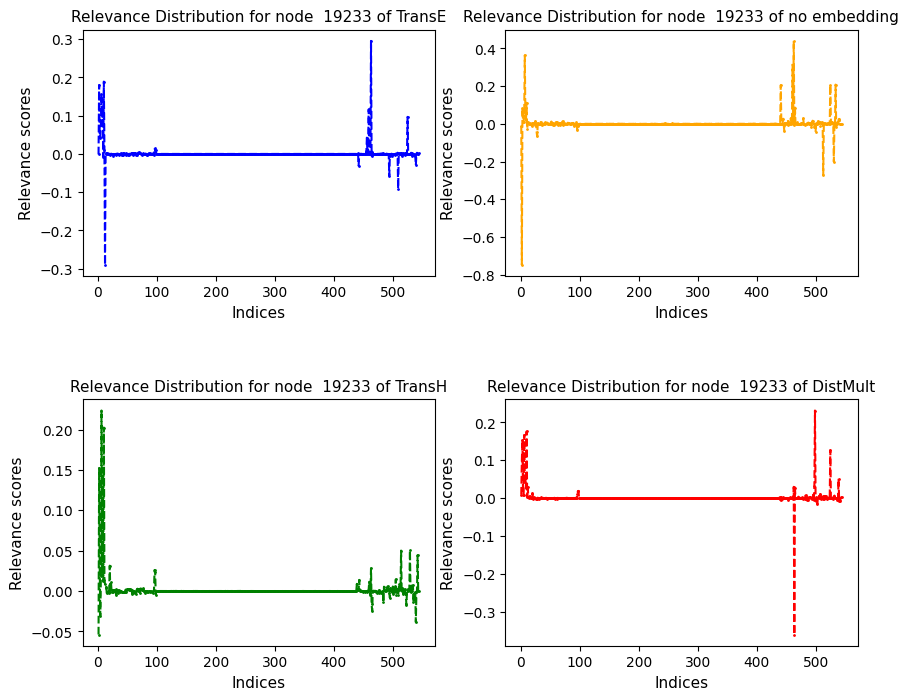

<Figure size 900x600 with 0 Axes>

relevances_edge_19260.pt 19260


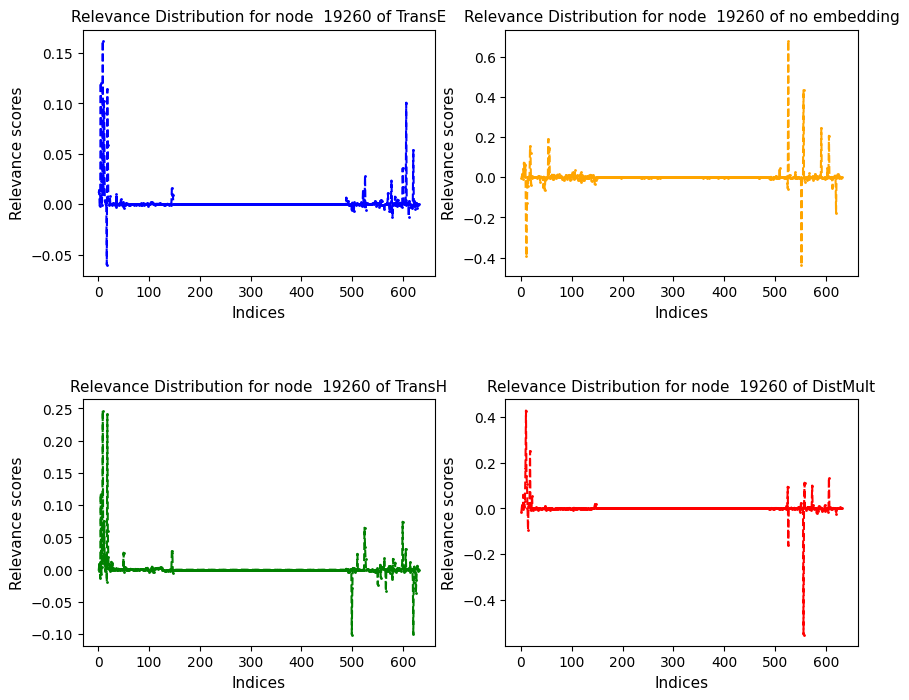

<Figure size 900x600 with 0 Axes>

relevances_edge_19769.pt 19769


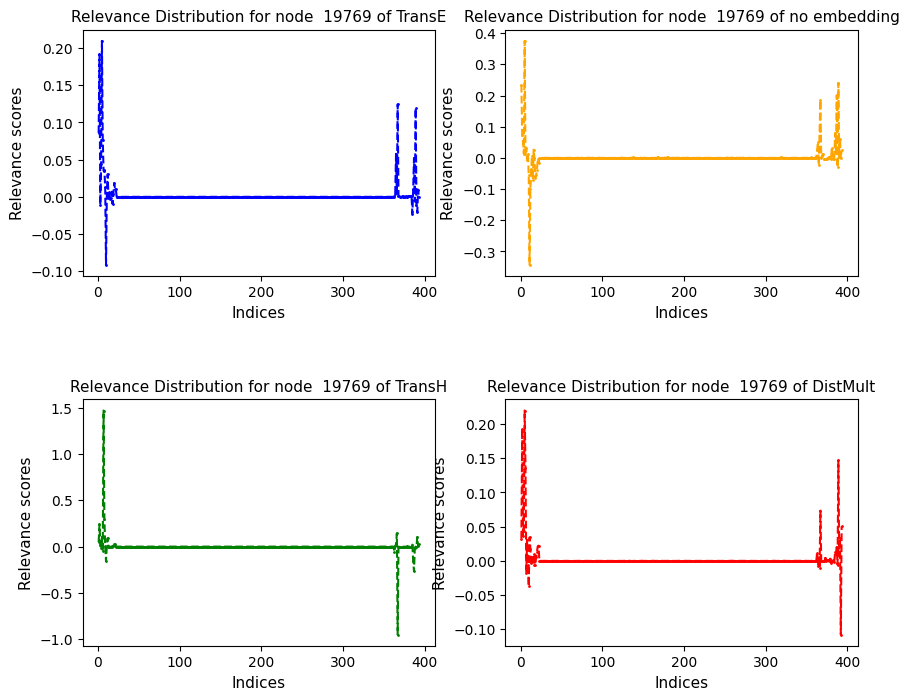

<Figure size 900x600 with 0 Axes>

relevances_edge_19890.pt 19890


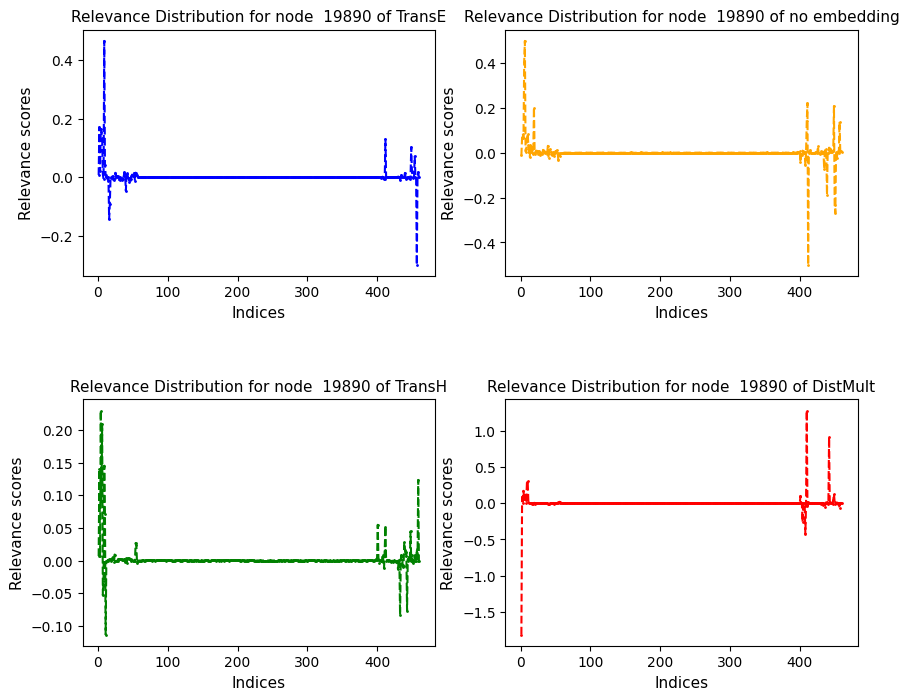

<Figure size 900x600 with 0 Axes>

relevances_edge_19946.pt 19946


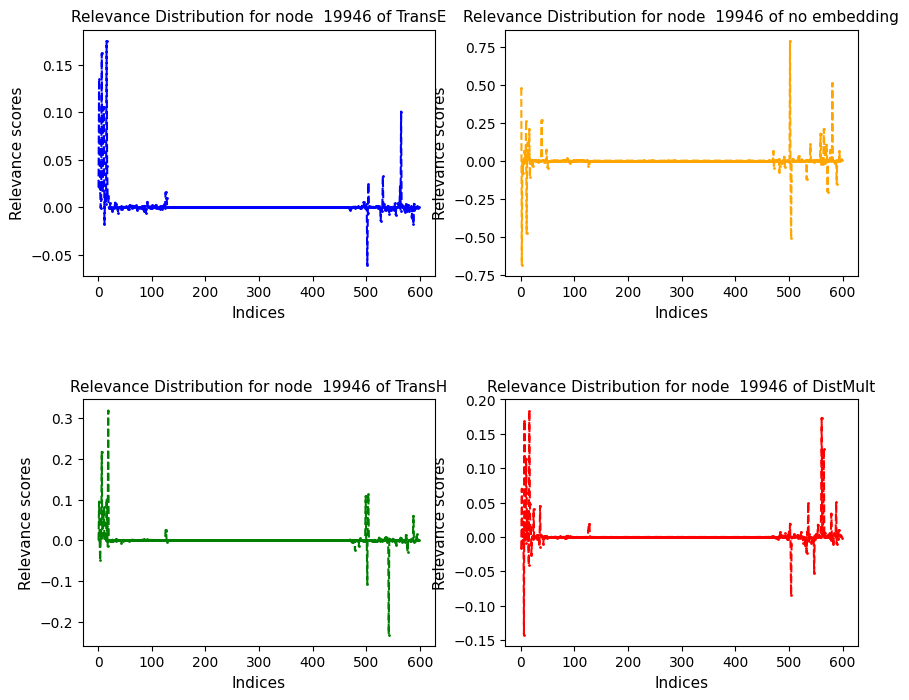

<Figure size 900x600 with 0 Axes>

relevances_edge_20225.pt 20225


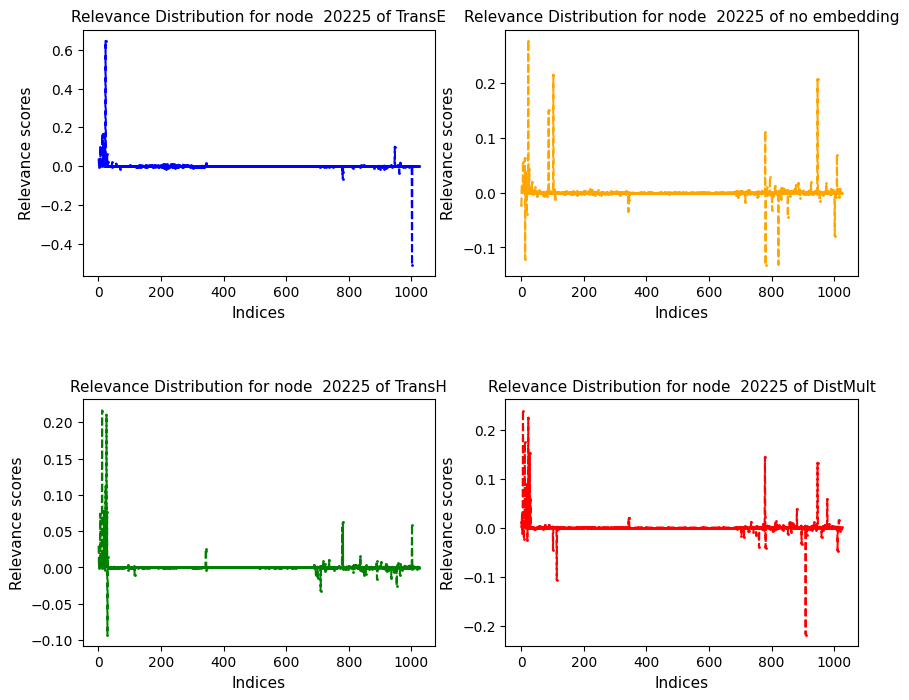

<Figure size 900x600 with 0 Axes>

relevances_edge_20261.pt 20261


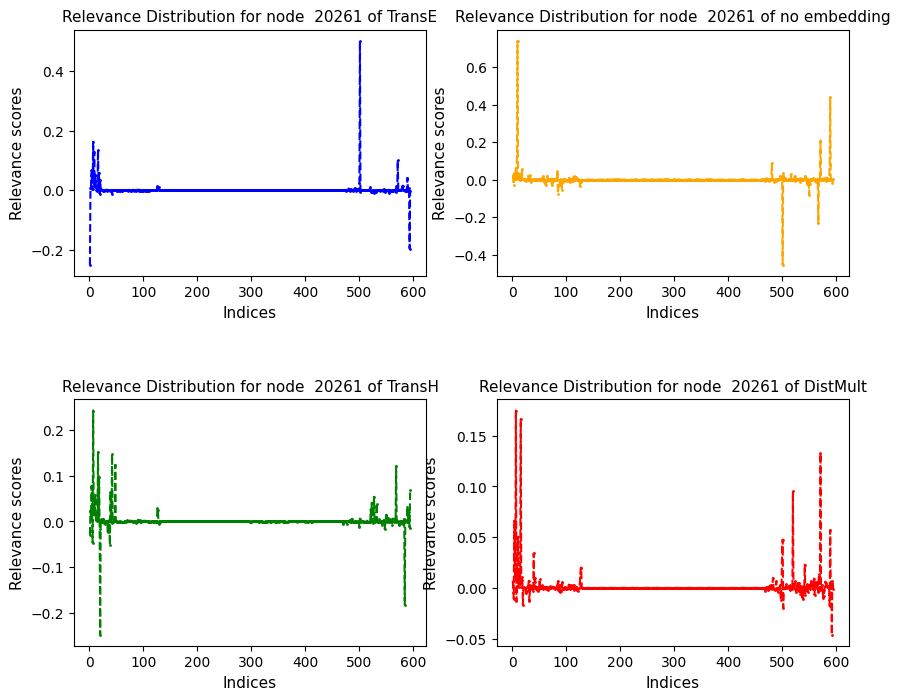

<Figure size 900x600 with 0 Axes>

relevances_edge_20943.pt 20943


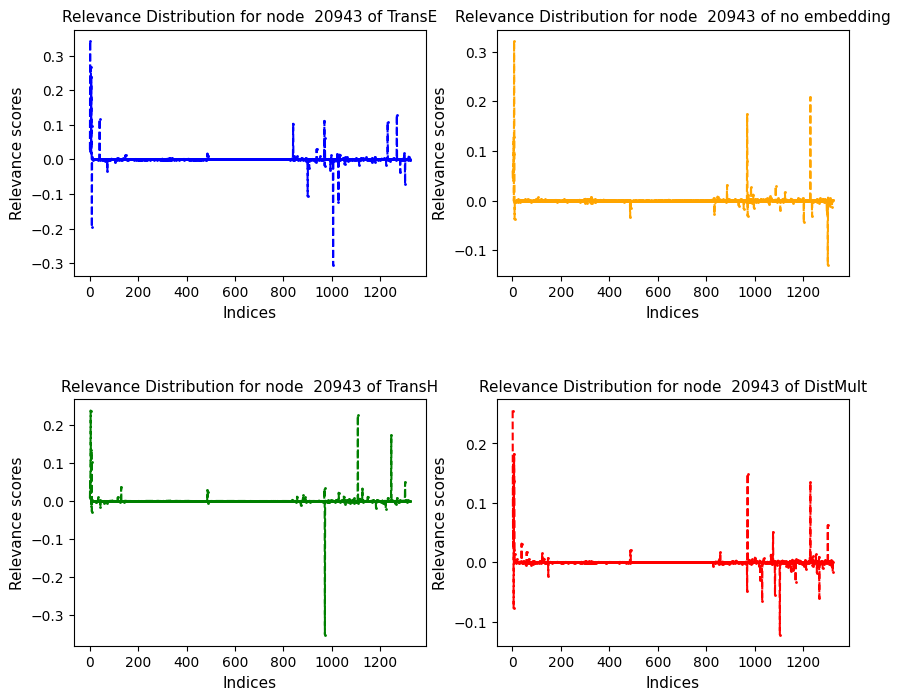

<Figure size 900x600 with 0 Axes>

relevances_edge_211.pt 211


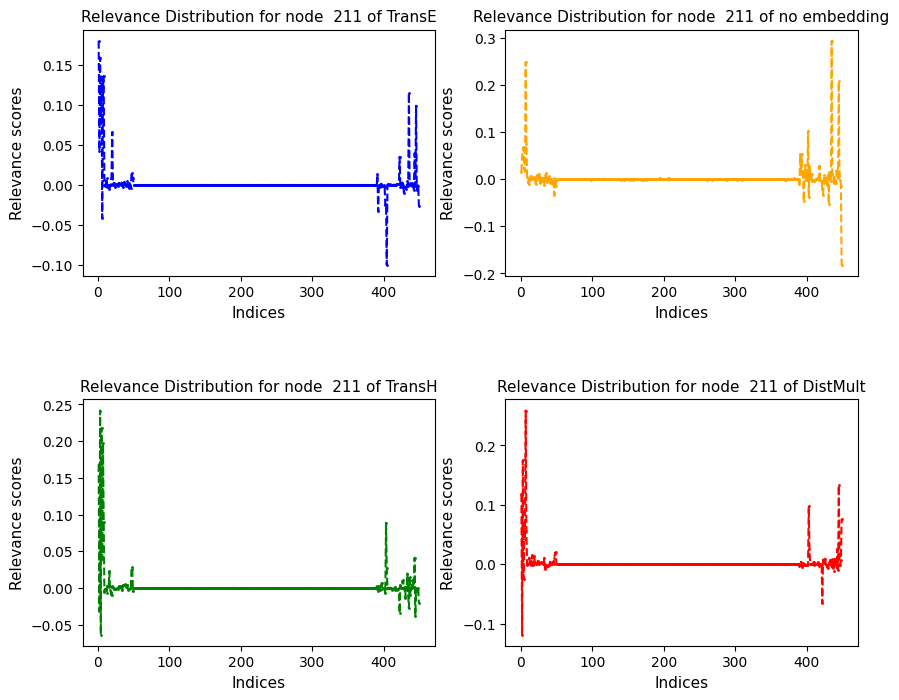

<Figure size 900x600 with 0 Axes>

relevances_edge_21185.pt 21185


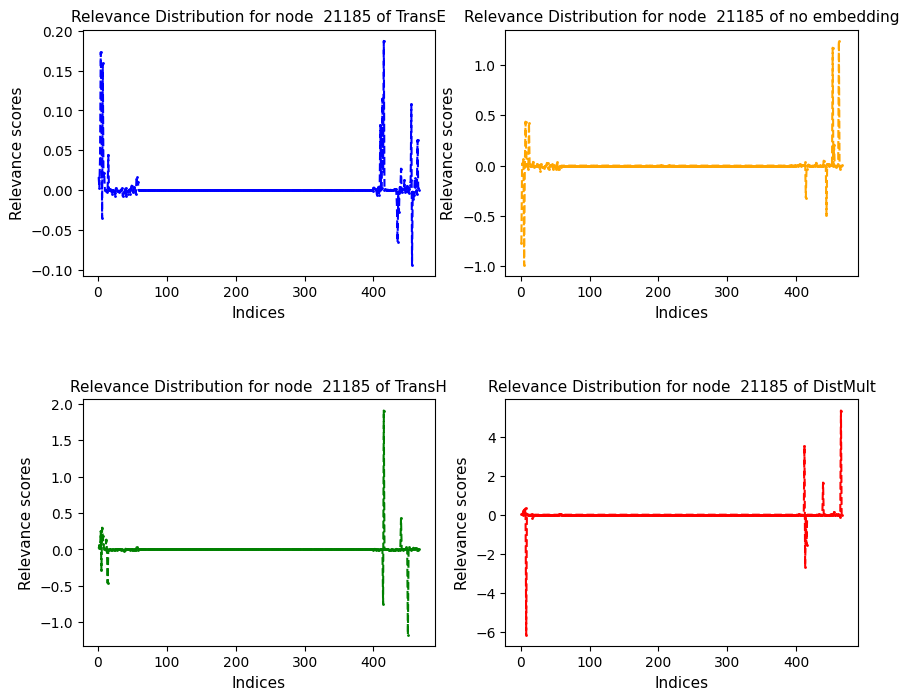

<Figure size 900x600 with 0 Axes>

relevances_edge_2144.pt 2144


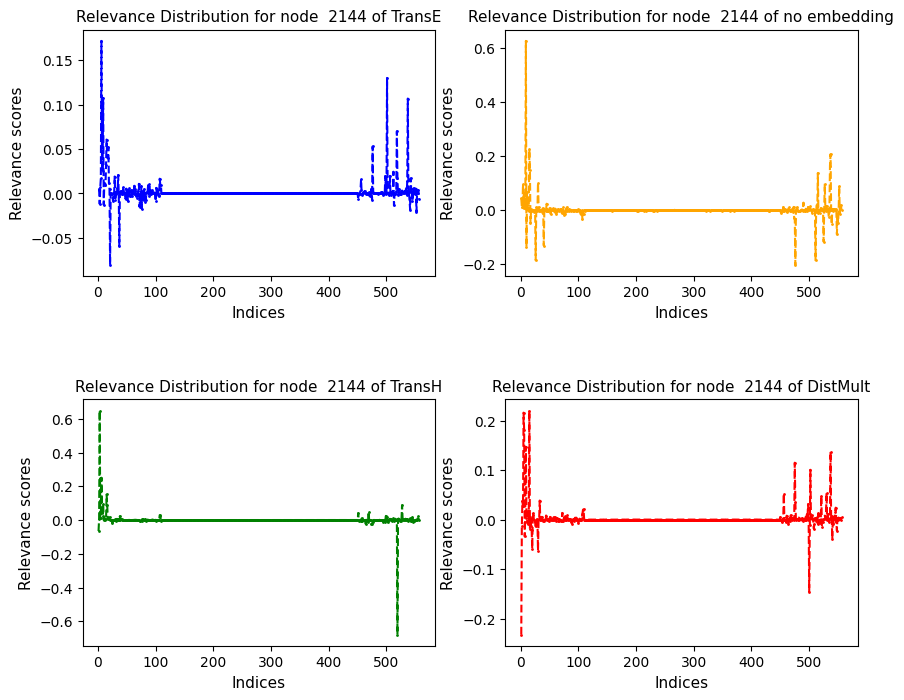

<Figure size 900x600 with 0 Axes>

relevances_edge_21863.pt 21863


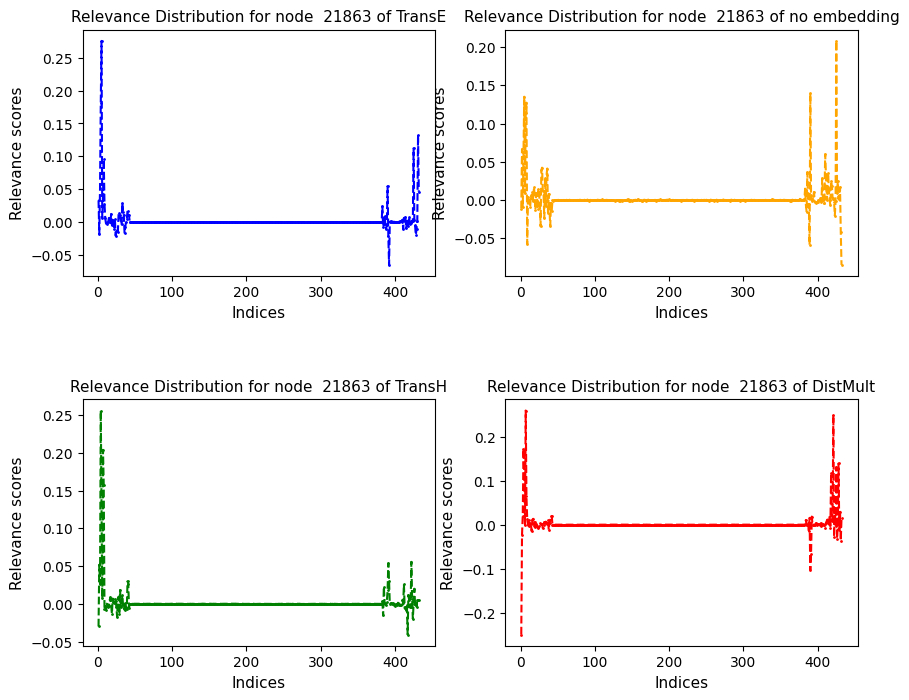

<Figure size 900x600 with 0 Axes>

relevances_edge_21950.pt 21950


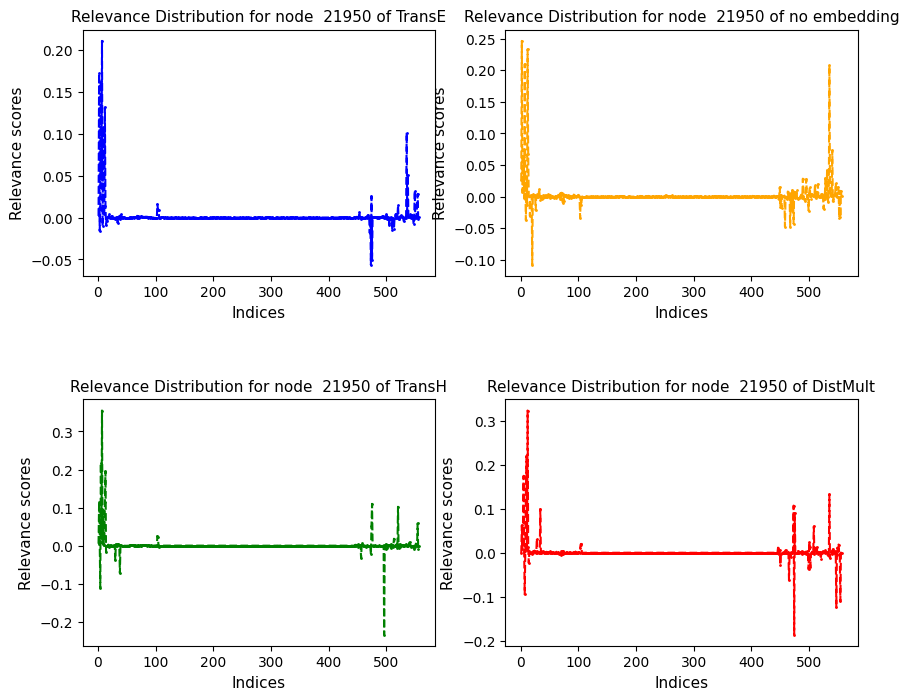

<Figure size 900x600 with 0 Axes>

relevances_edge_22189.pt 22189


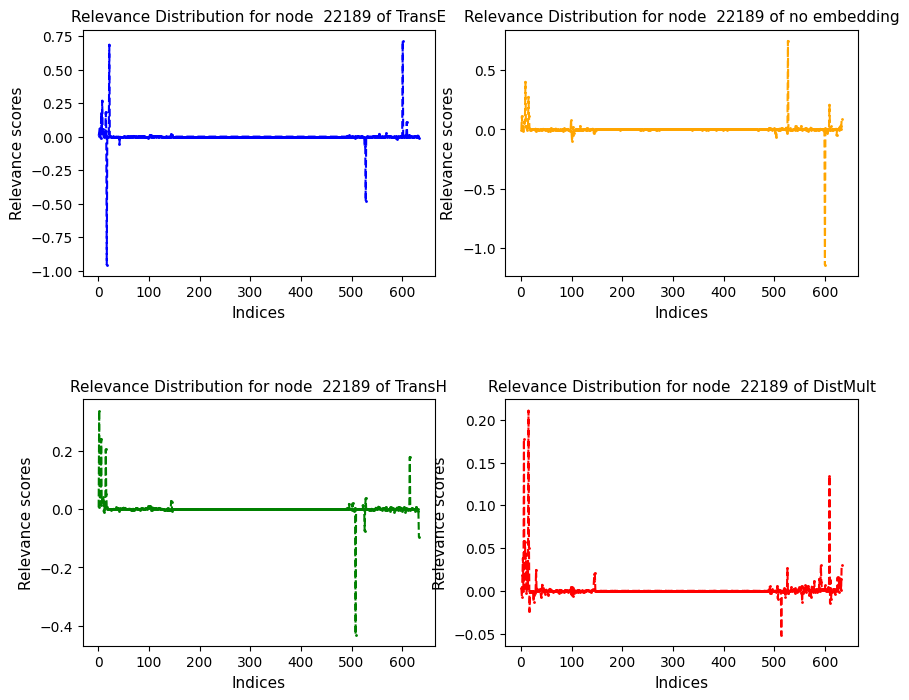

<Figure size 900x600 with 0 Axes>

relevances_edge_22241.pt 22241


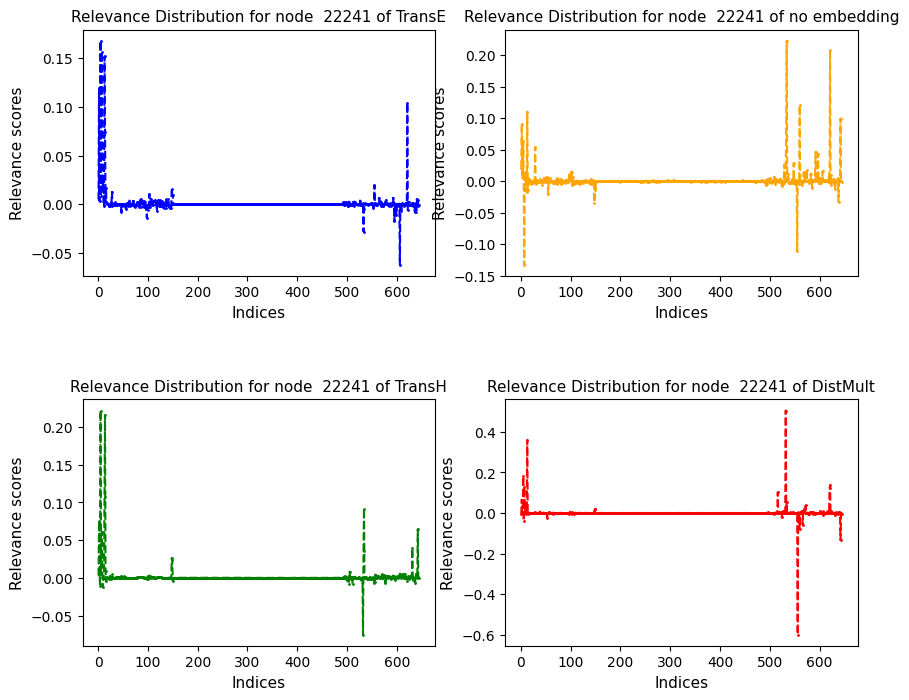

<Figure size 900x600 with 0 Axes>

relevances_edge_2579.pt 2579


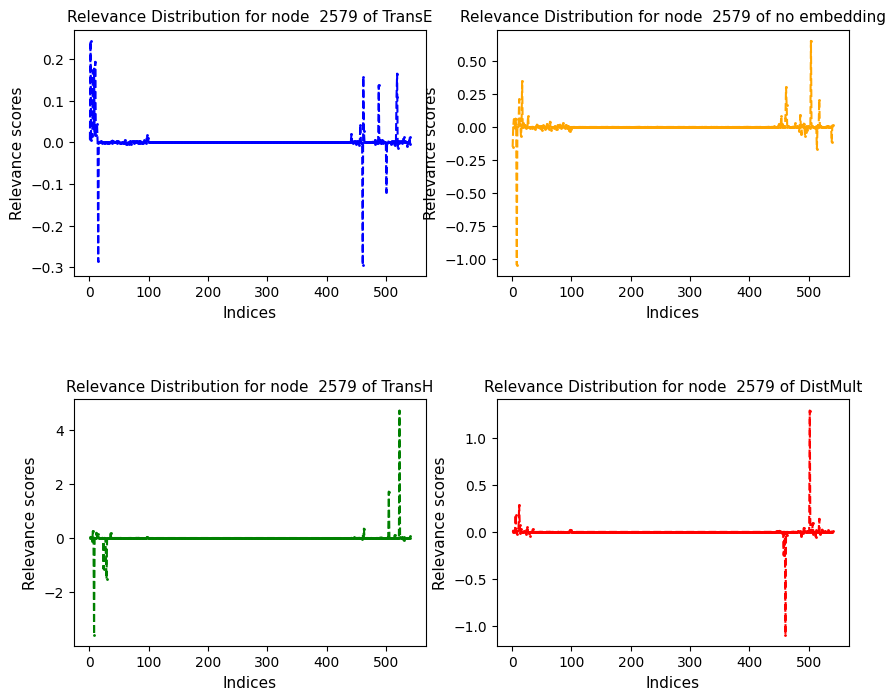

<Figure size 900x600 with 0 Axes>

relevances_edge_2846.pt 2846


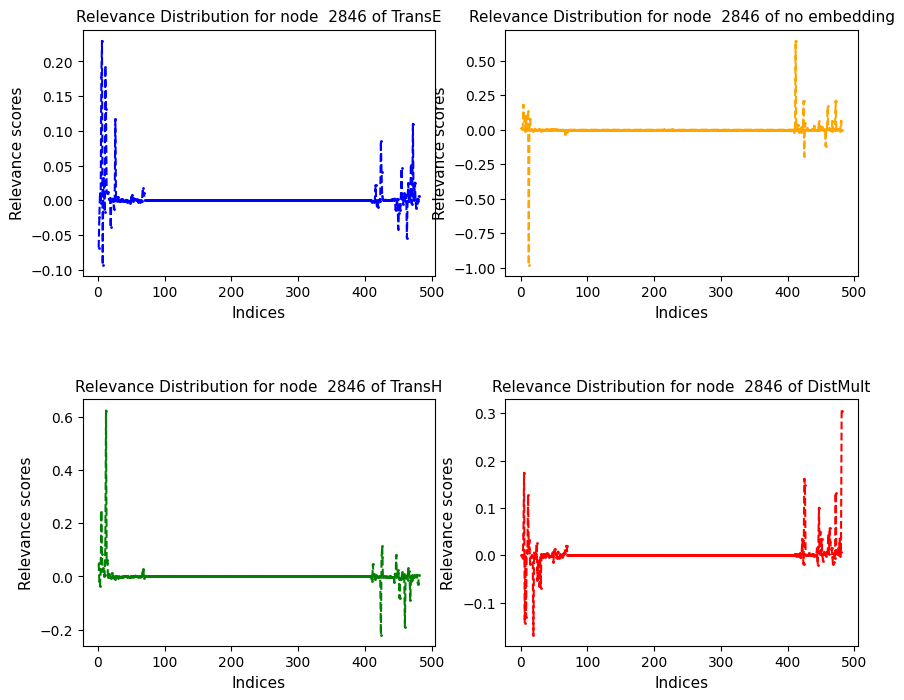

<Figure size 900x600 with 0 Axes>

relevances_edge_3144.pt 3144


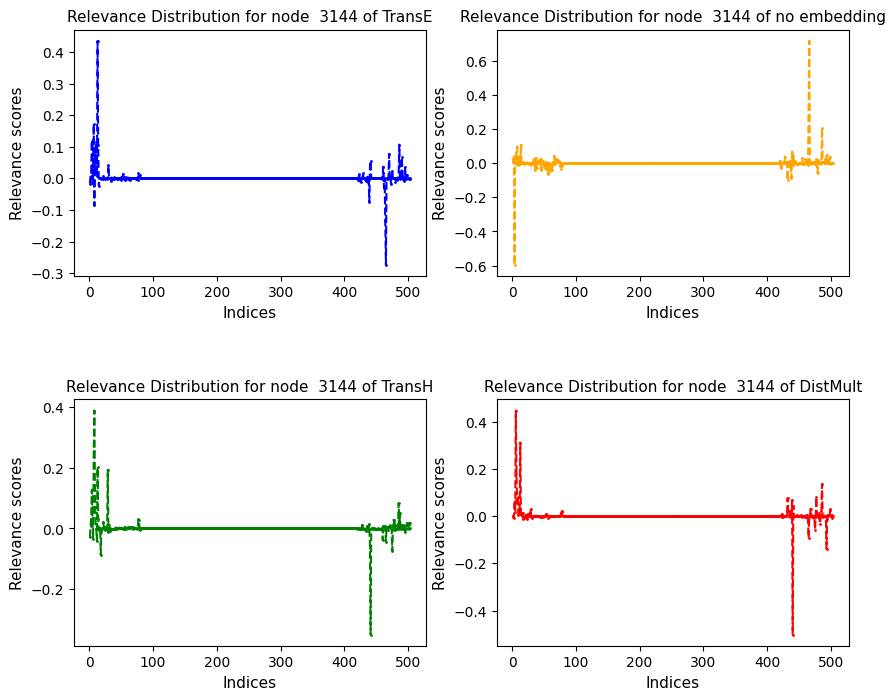

<Figure size 900x600 with 0 Axes>

relevances_edge_3410.pt 3410


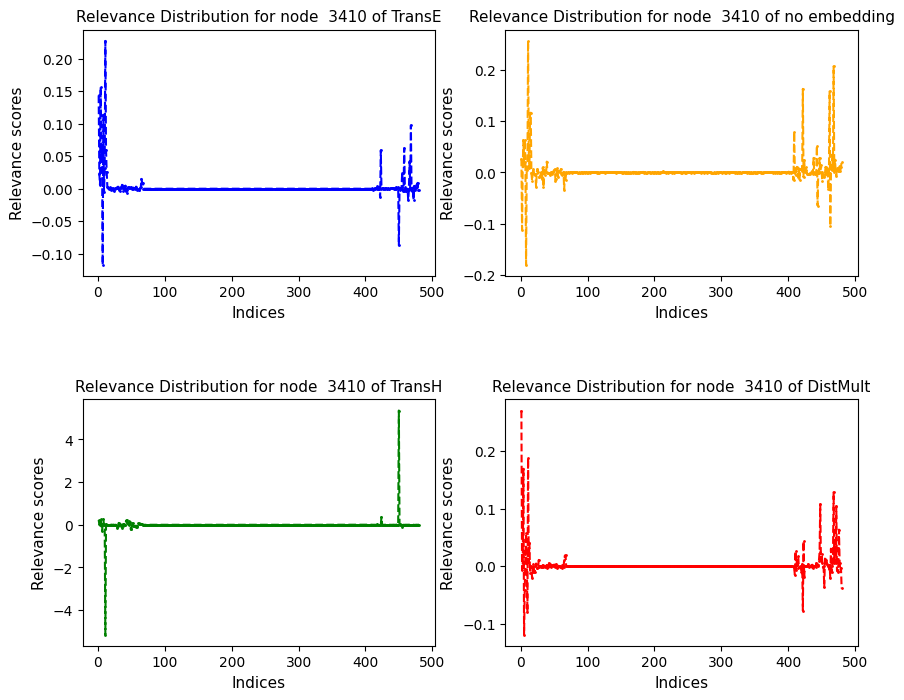

<Figure size 900x600 with 0 Axes>

relevances_edge_3969.pt 3969


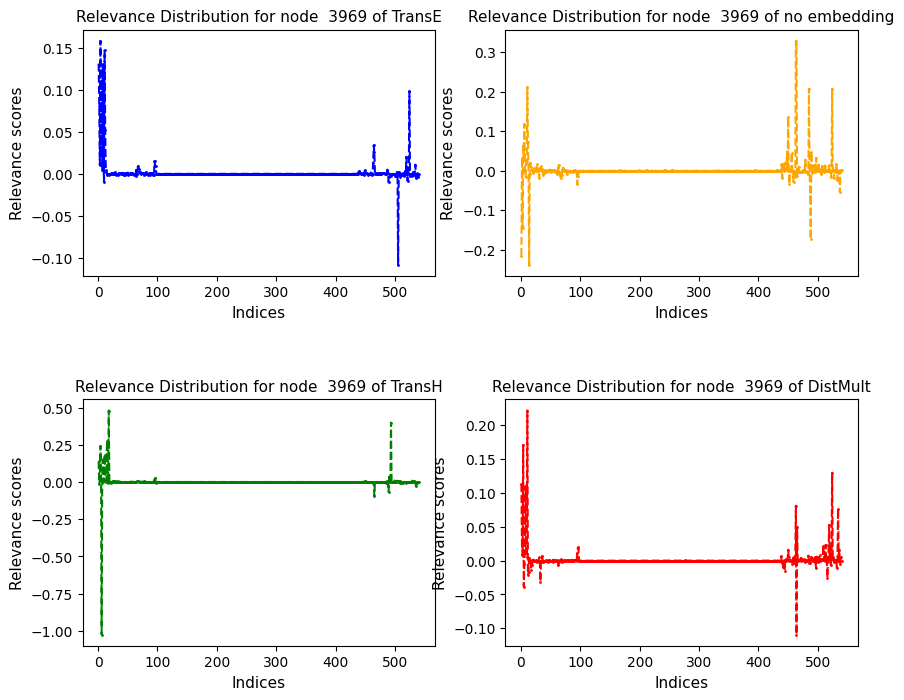

<Figure size 900x600 with 0 Axes>

relevances_edge_4256.pt 4256


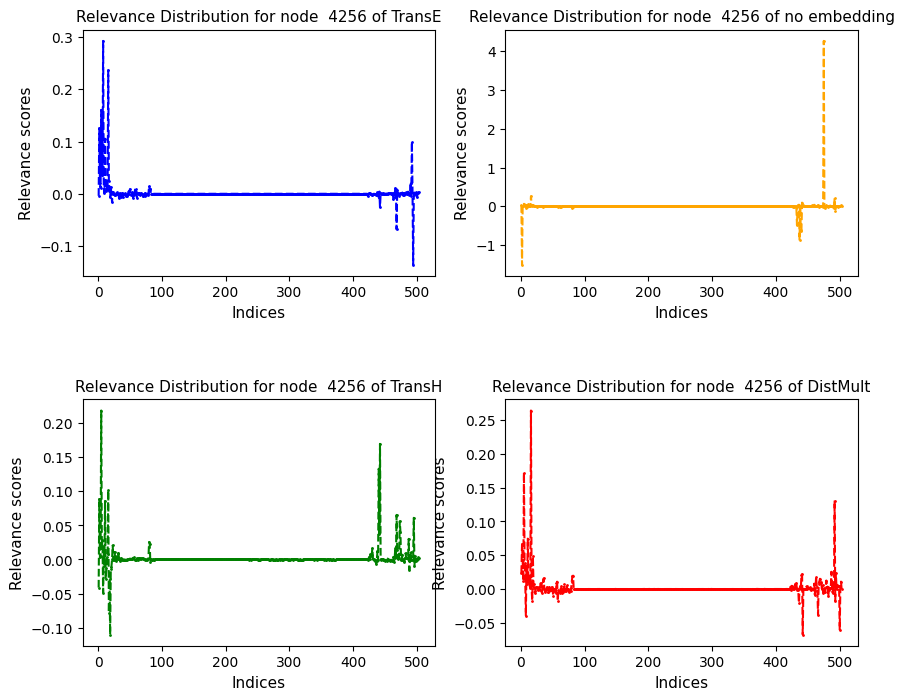

<Figure size 900x600 with 0 Axes>

relevances_edge_4336.pt 4336


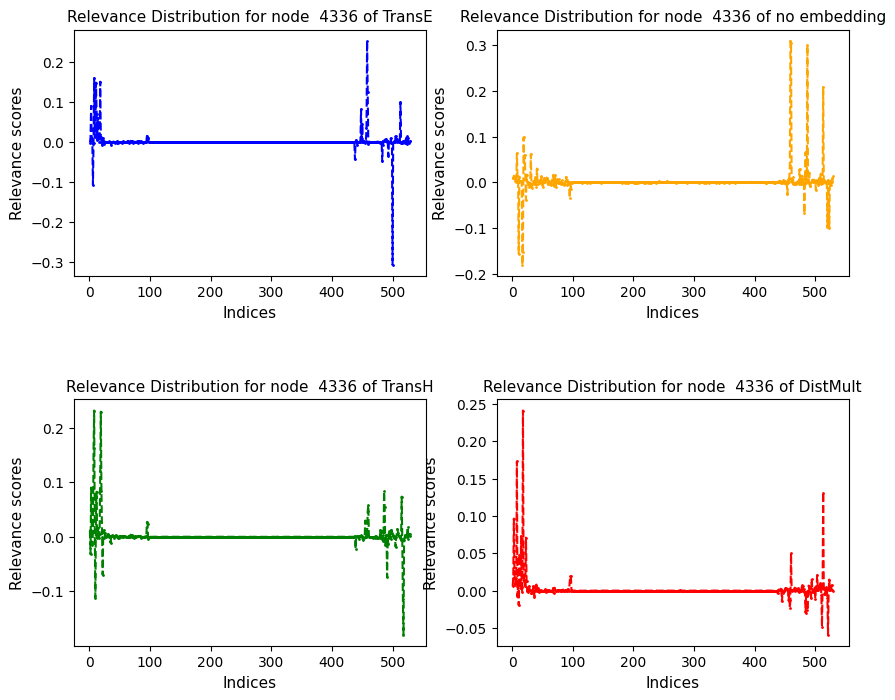

<Figure size 900x600 with 0 Axes>

relevances_edge_4369.pt 4369


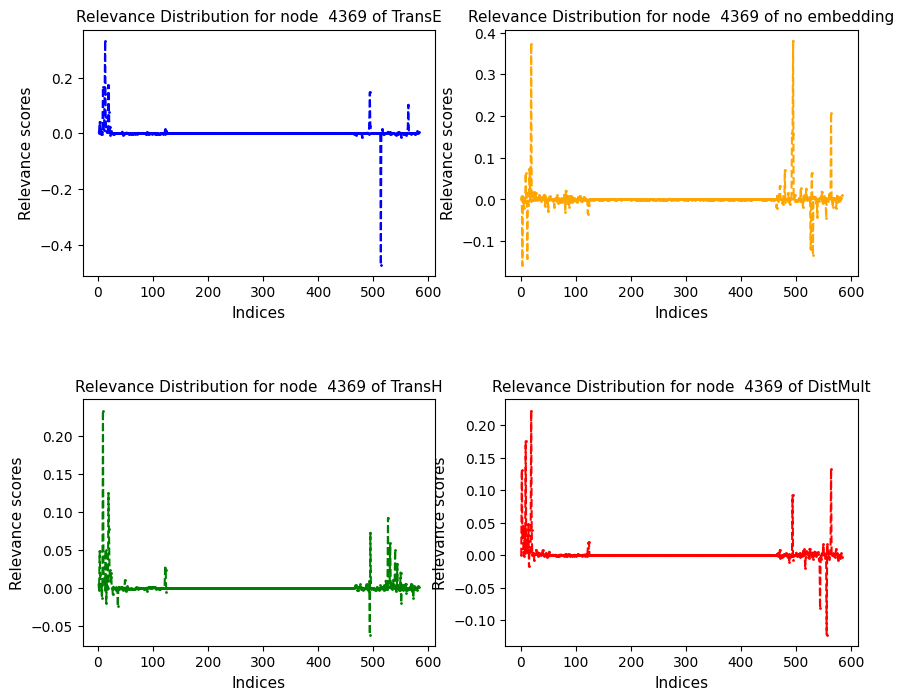

<Figure size 900x600 with 0 Axes>

relevances_edge_5170.pt 5170


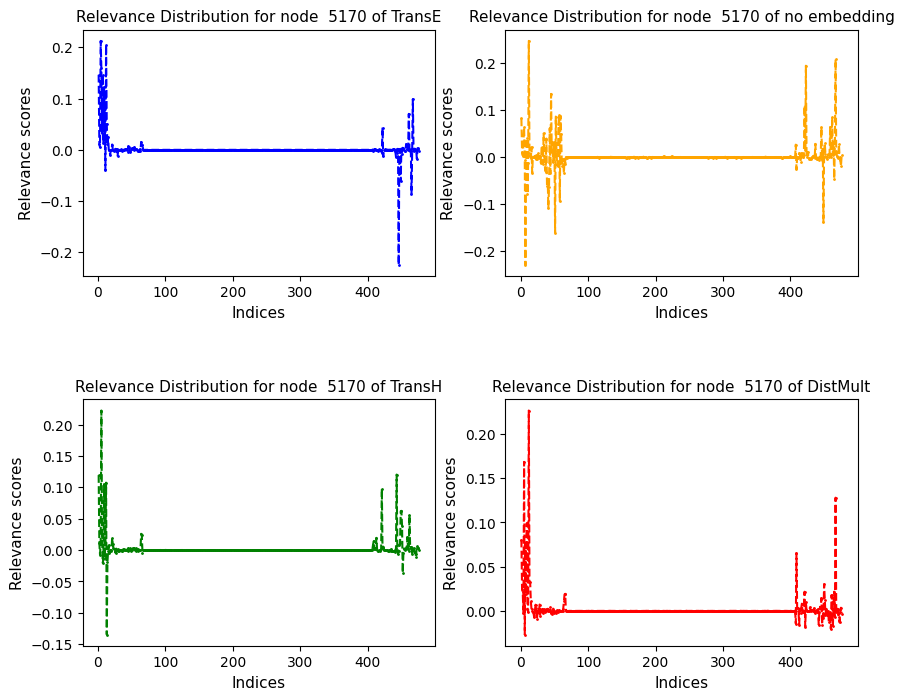

<Figure size 900x600 with 0 Axes>

relevances_edge_5234.pt 5234


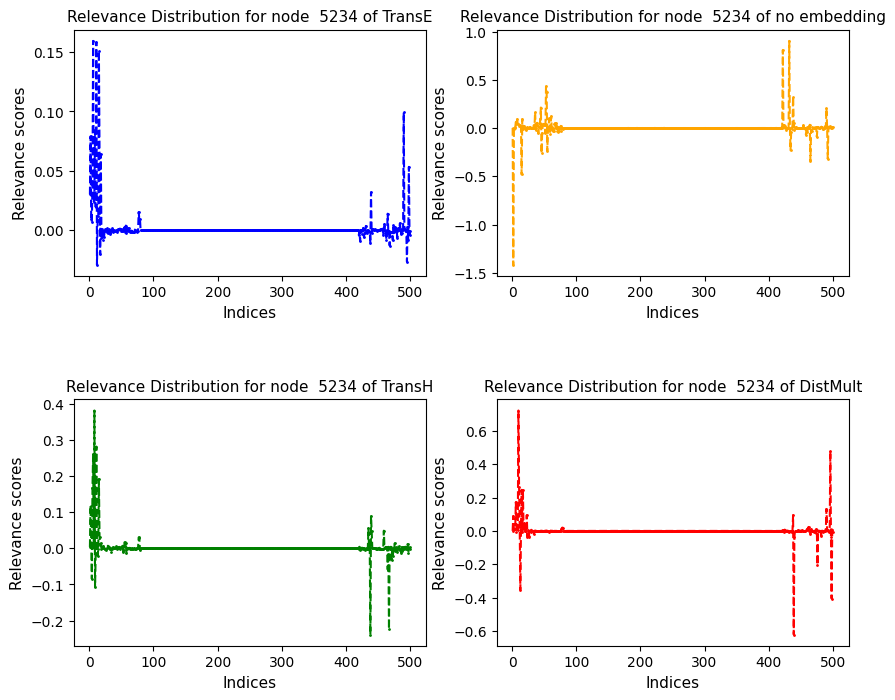

<Figure size 900x600 with 0 Axes>

relevances_edge_541.pt 541


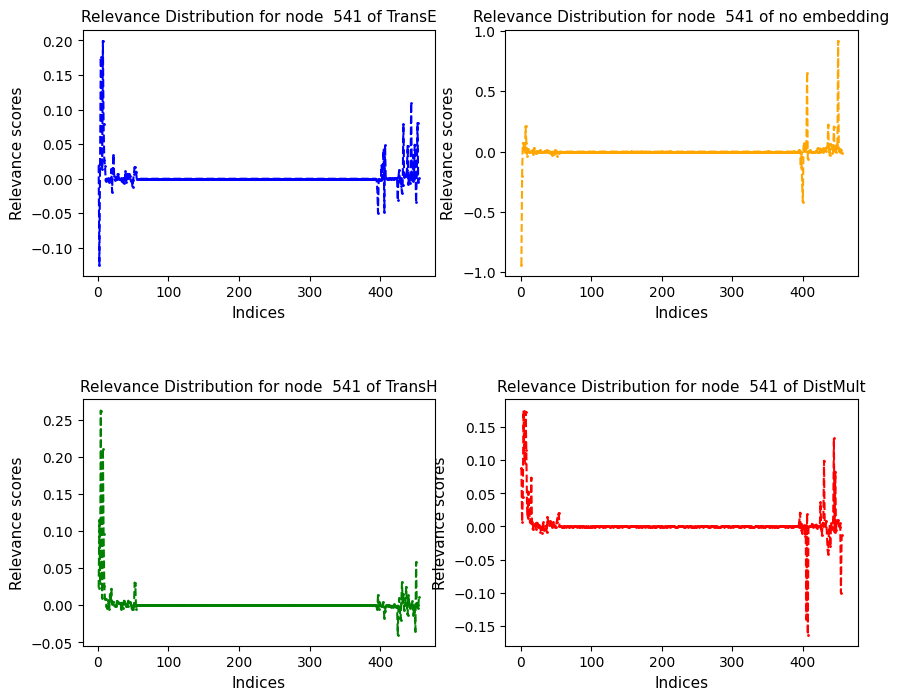

<Figure size 900x600 with 0 Axes>

relevances_edge_5643.pt 5643


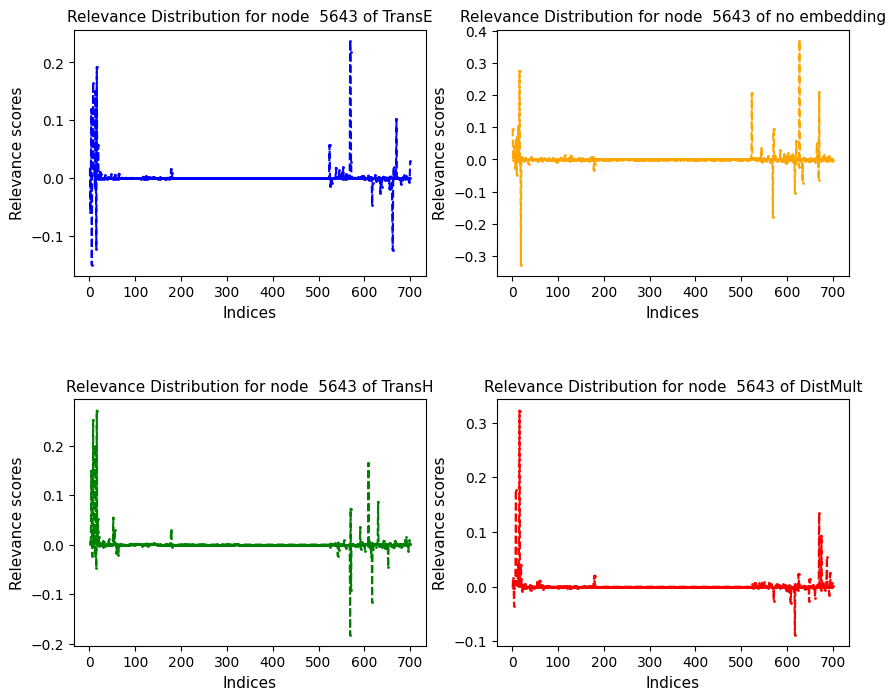

<Figure size 900x600 with 0 Axes>

relevances_edge_6607.pt 6607


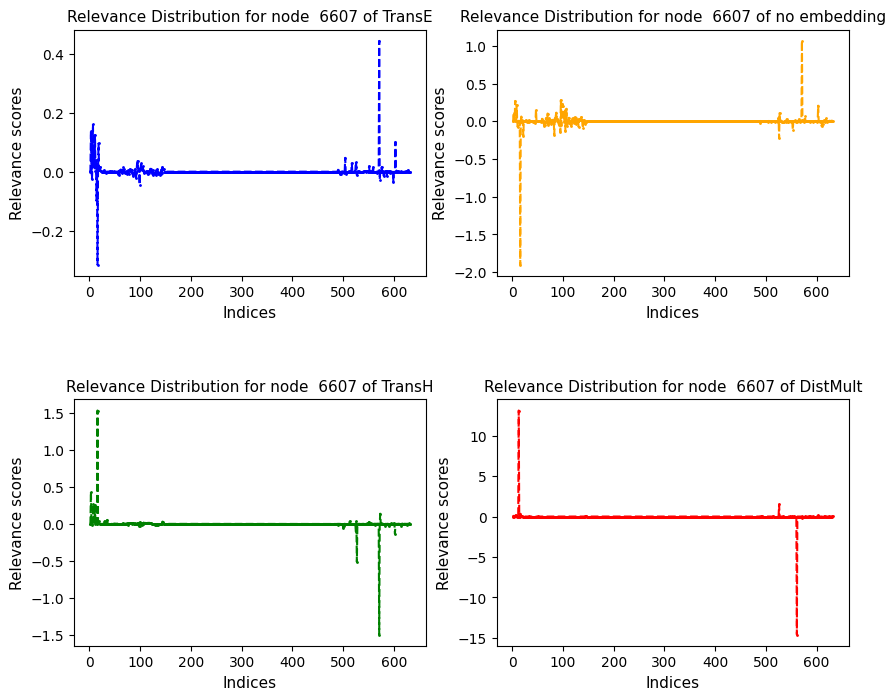

<Figure size 900x600 with 0 Axes>

relevances_edge_6744.pt 6744


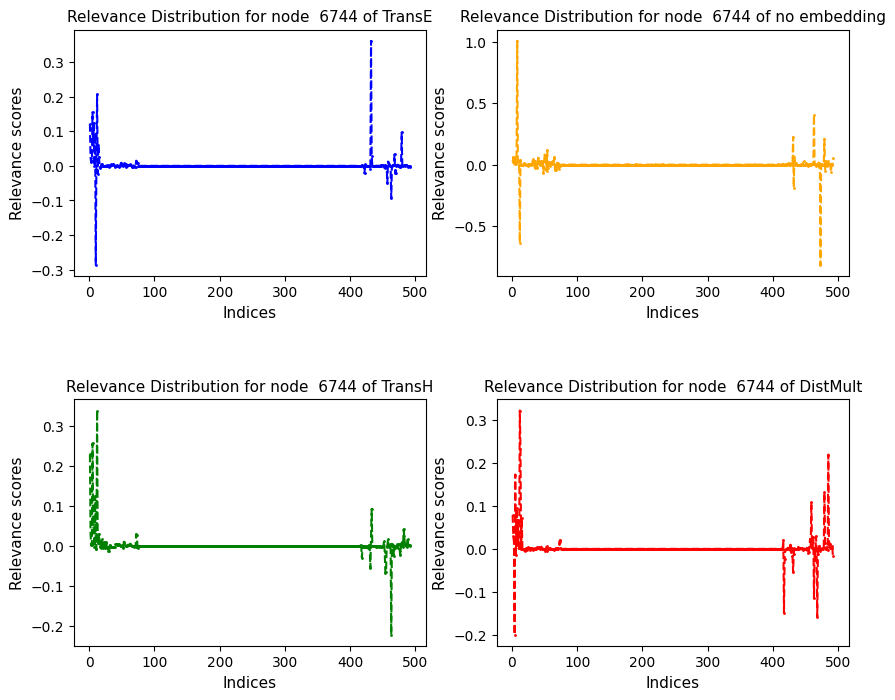

<Figure size 900x600 with 0 Axes>

relevances_edge_6785.pt 6785


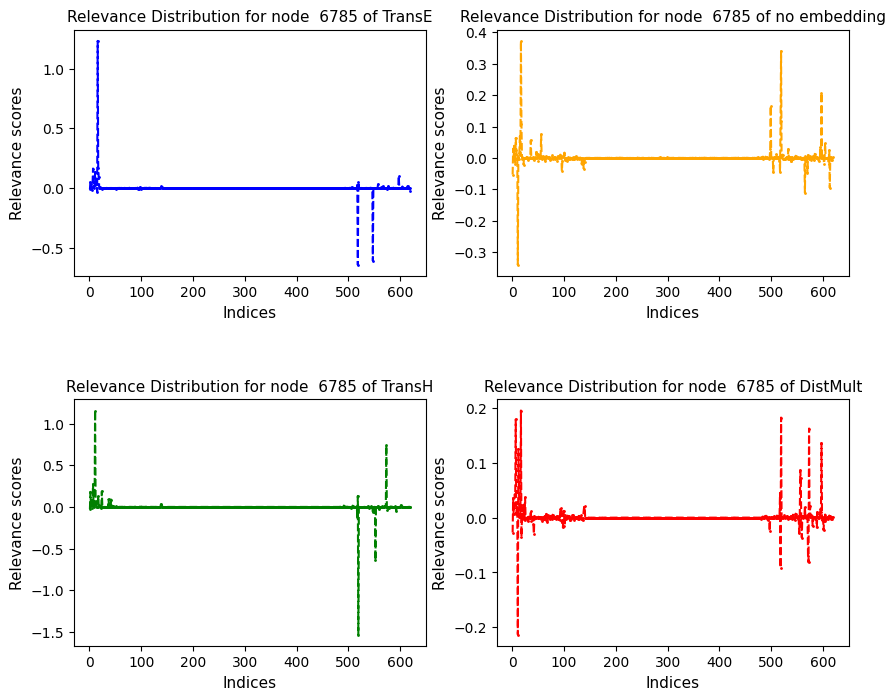

<Figure size 900x600 with 0 Axes>

relevances_edge_7271.pt 7271


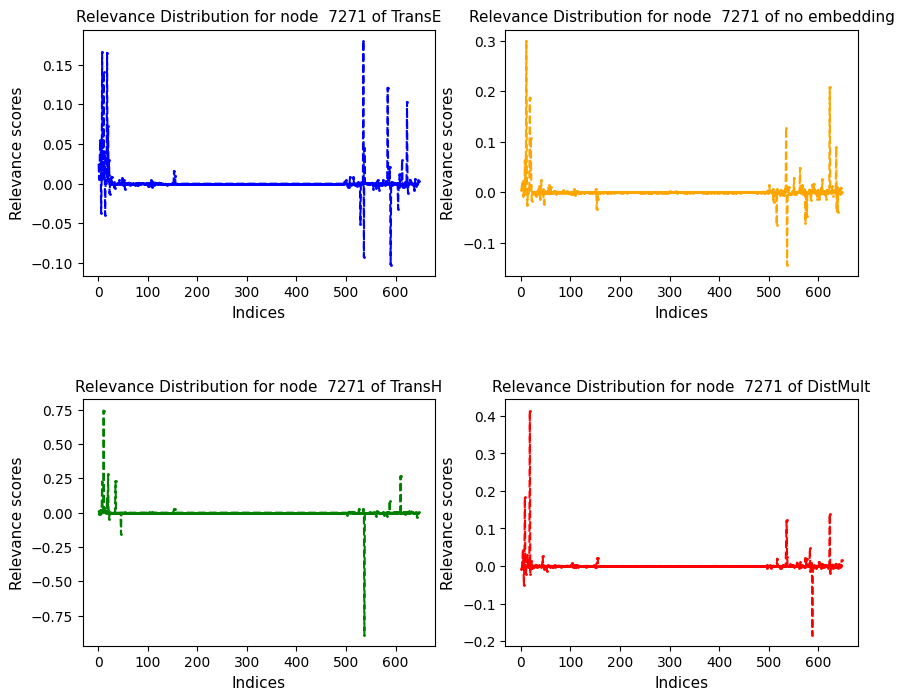

<Figure size 900x600 with 0 Axes>

relevances_edge_7315.pt 7315


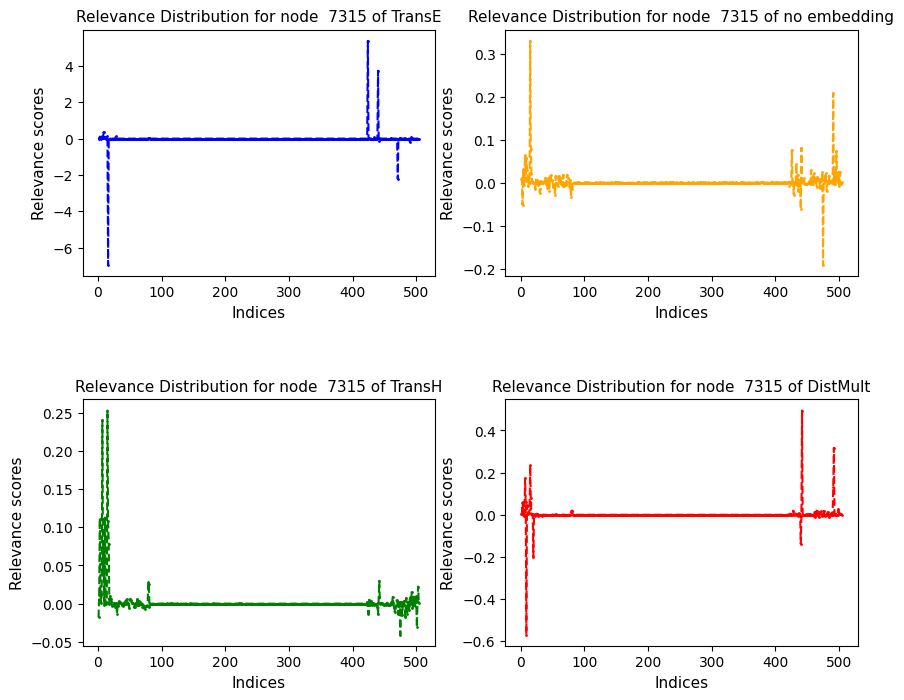

<Figure size 900x600 with 0 Axes>

relevances_edge_7417.pt 7417


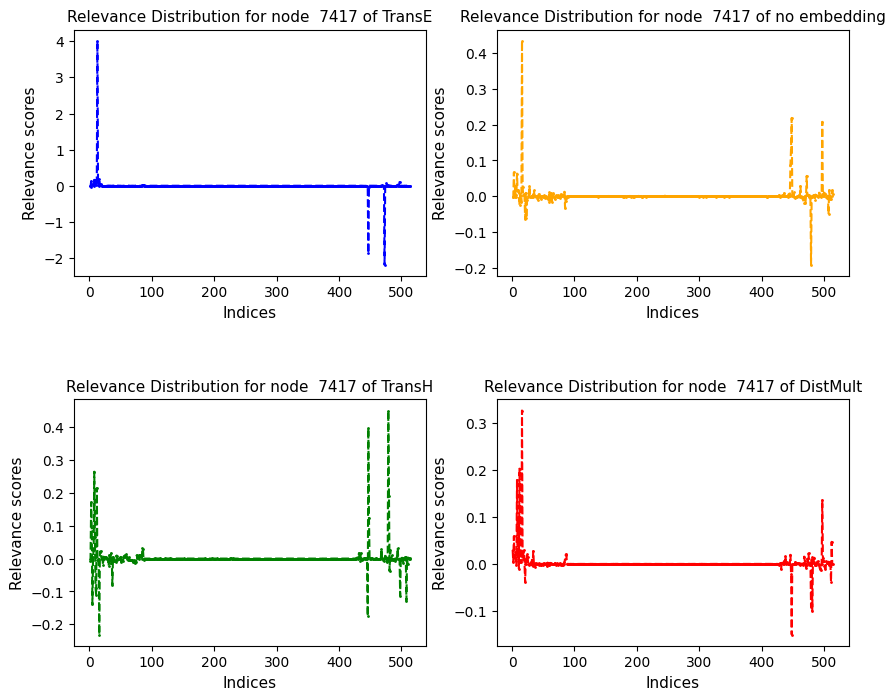

<Figure size 900x600 with 0 Axes>

relevances_edge_7860.pt 7860


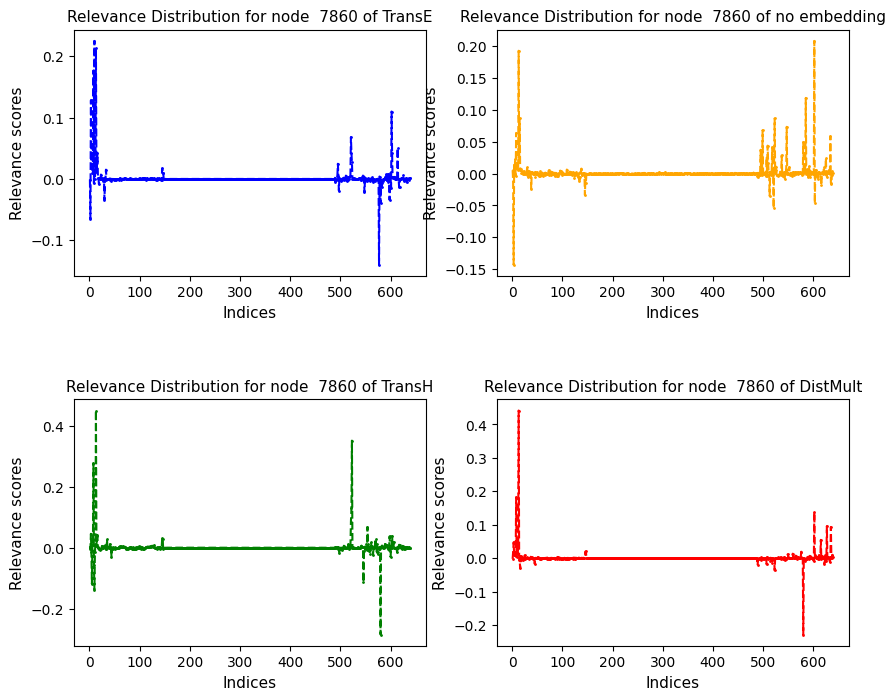

<Figure size 900x600 with 0 Axes>

relevances_edge_8783.pt 8783


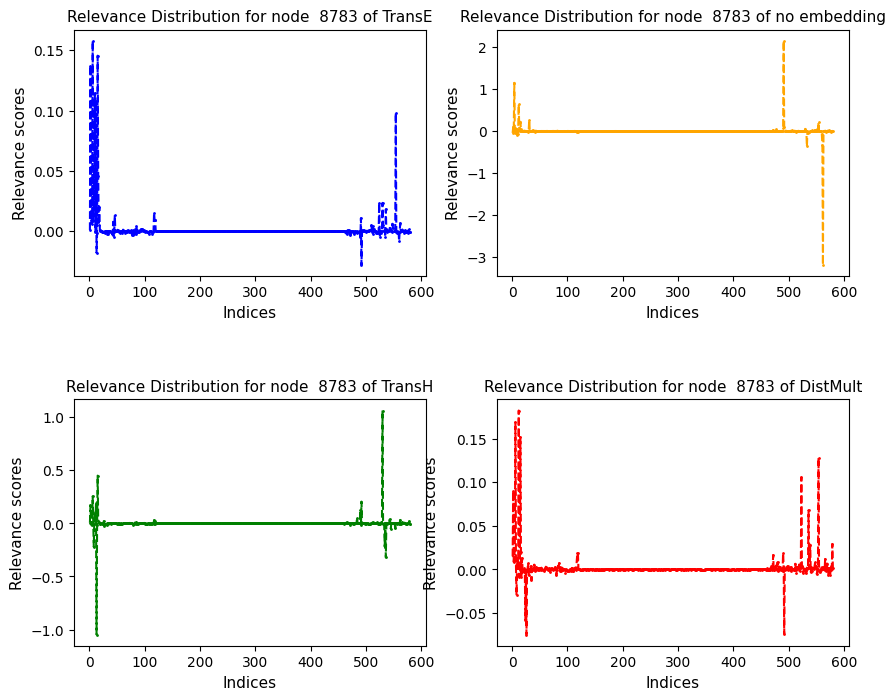

<Figure size 900x600 with 0 Axes>

relevances_edge_9082.pt 9082


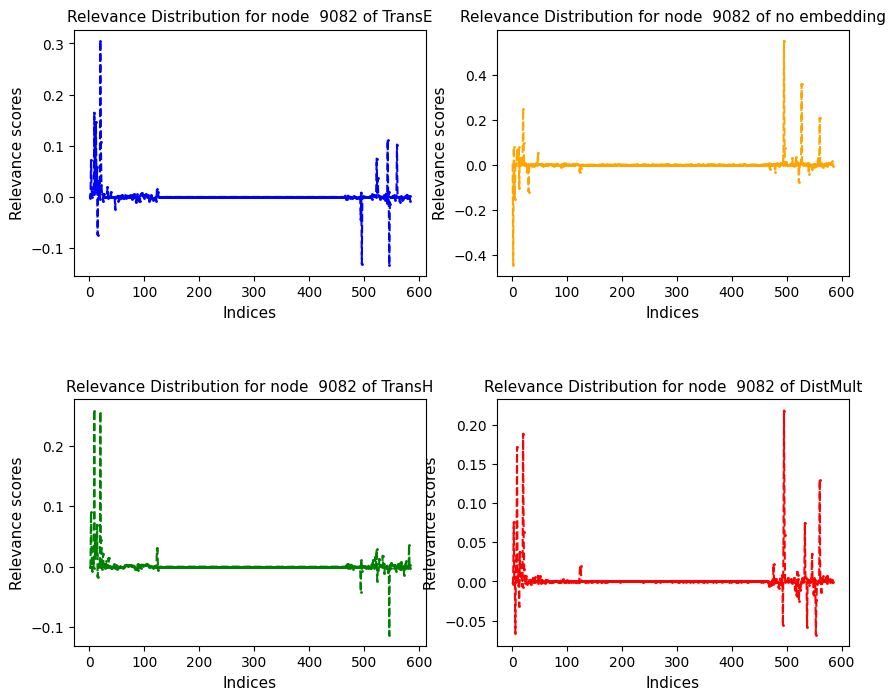

<Figure size 900x600 with 0 Axes>

relevances_edge_9376.pt 9376


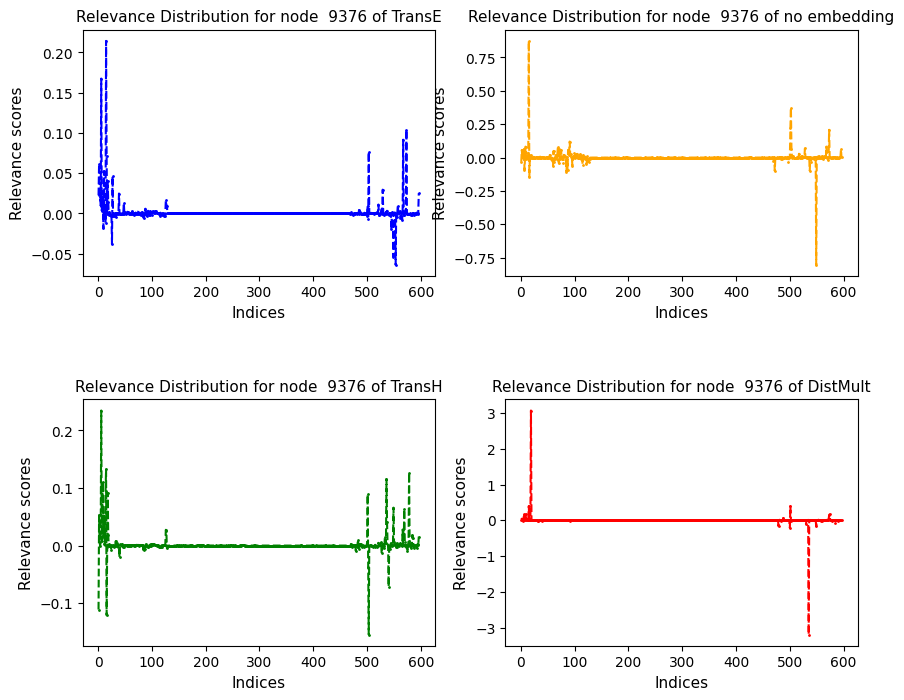

<Figure size 900x600 with 0 Axes>

relevances_edge_963.pt 963


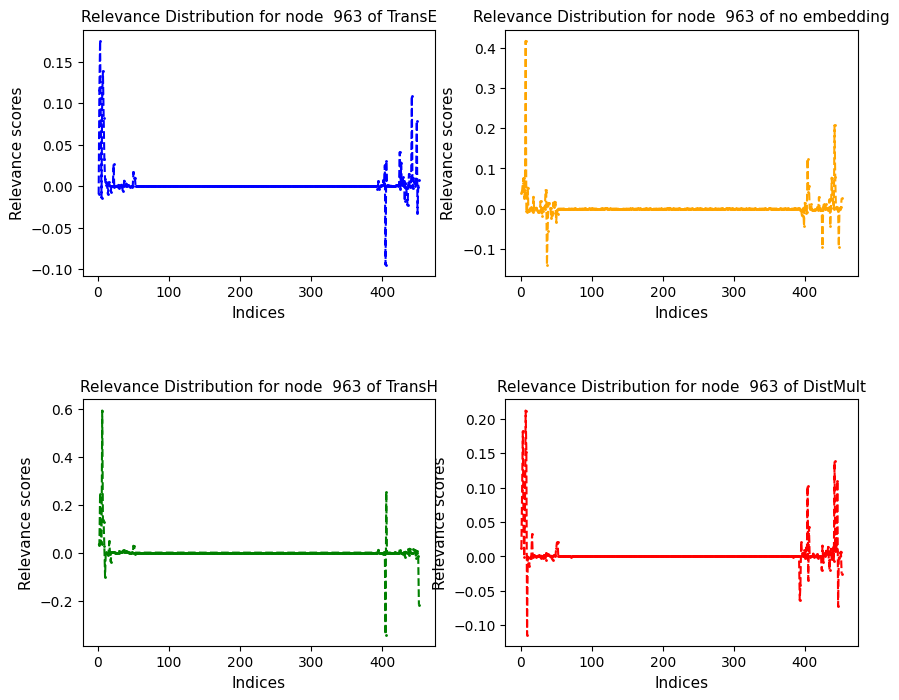

<Figure size 900x600 with 0 Axes>

relevances_edge_9637.pt 9637


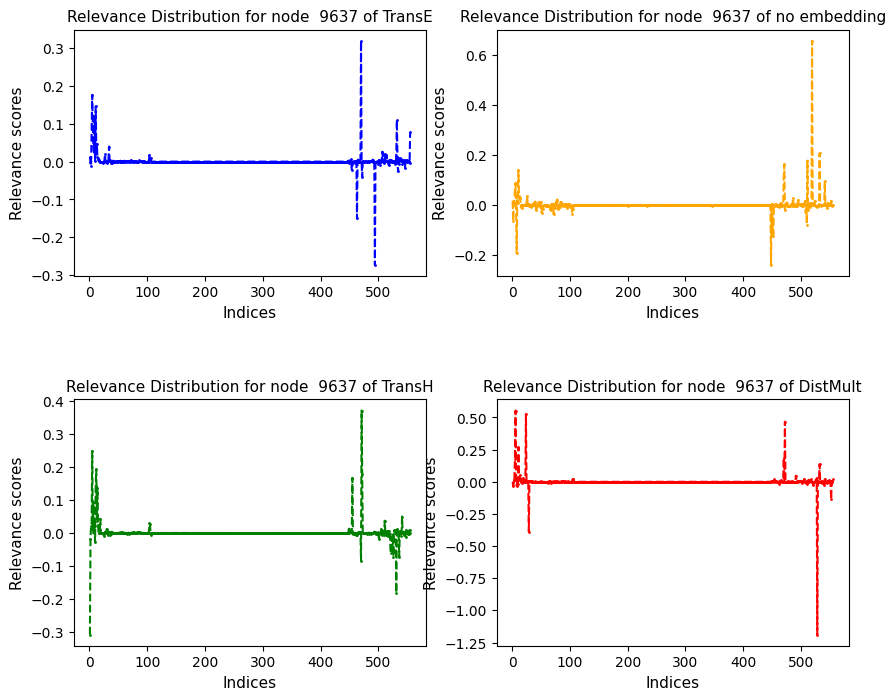

<Figure size 900x600 with 0 Axes>

relevances_edge_9704.pt 9704


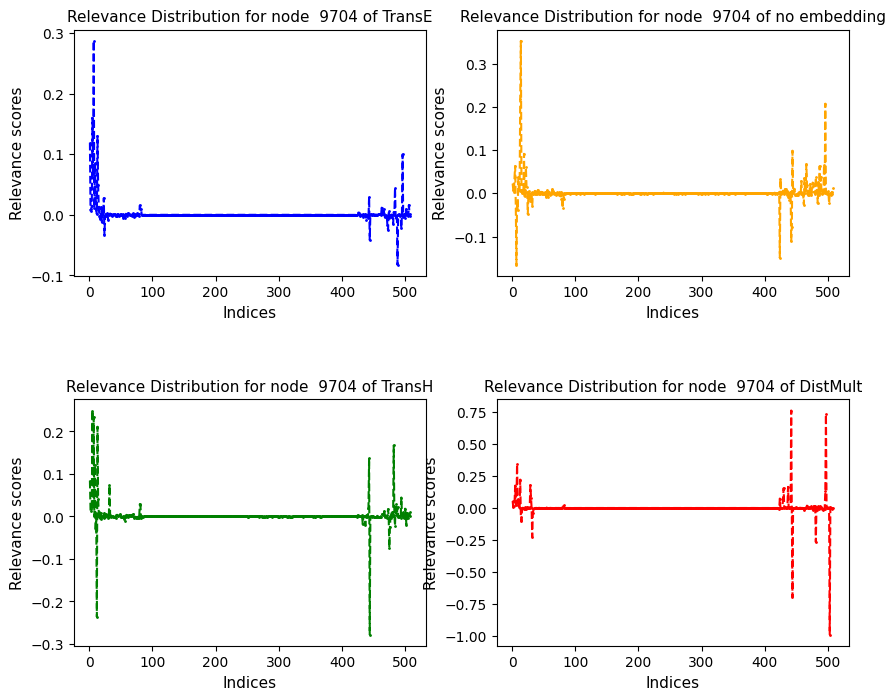

<Figure size 900x600 with 0 Axes>

relevances_edge_9956.pt 9956


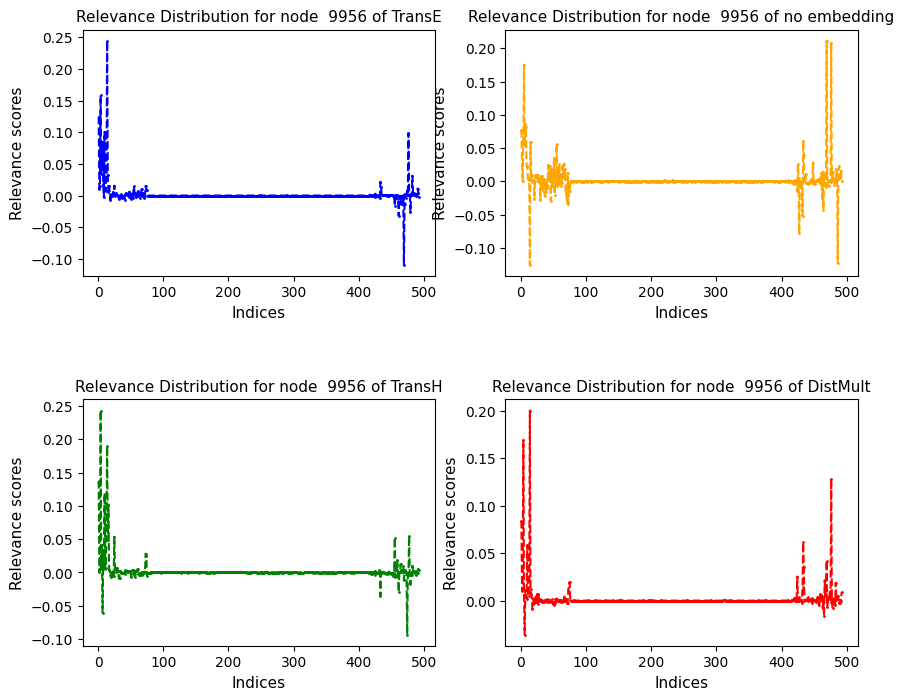

<Figure size 900x600 with 0 Axes>

In [29]:
path = 'out/MUTAG/RGCN_no_emb/relevances/'
path_dist = 'out/MUTAG/RGCN_emb/DistMult/relevances/'
path_transe = 'out/MUTAG/RGCN_emb/TransE/relevances/'
path_transh = 'out/MUTAG/RGCN_emb/TransH/relevances/'
fil = os.listdir(path)
fil_transe = os.listdir('out/MUTAG/RGCN_emb/TransE/relevances/')
fil_transh = os.listdir('out/MUTAG/RGCN_emb/TransH/relevances/')
fil_dist = os.listdir('out/MUTAG/RGCN_emb/DistMult/relevances/')
rel_no = [file for file in fil if file.startswith("relevances_edge_")]
rel_transe = [file for file in fil if file.startswith("relevances_edge_")]
rel_transh = [file for file in fil if file.startswith("relevances_edg_")]
rel_dist = [file for file in fil if file.startswith("relevances_edge_")]

dfs = []
for rel in rel_transe:
    rte = torch.load(path_transe+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_')[1].split('.')[0]
    print(rel, node_name)
    rno = torch.load(path+rel).to_dense().detach().numpy()
    rth = torch.load(path_transh+rel).to_dense().detach().numpy()
    rdi = torch.load(path_dist+rel).to_dense().detach().numpy()
    XX,YY = np.meshgrid(np.arange(rno.shape[1]),np.arange(rno.shape[0]))
    table = np.vstack((rte.ravel(),rno.ravel(),rth.ravel(), rdi.ravel(),XX.ravel(),YY.ravel())).T
    table = table[(table[:,0] != 0) & (table[:,1] != 0) & (table[:,2] != 0) & (table[:,3] != 0)]

    indices = np.arange(1, len(table[:,0]) + 1)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.5})
    # Create a line plot with different line styles and markers
    plt.figure(figsize=(9, 6))
    axes[0,0].plot(indices, table[:,0], color='blue', linestyle='--', marker='.', markersize=2, label='Relevance TransE')
    axes[0,1].plot(indices, table[:,1], color='orange', linestyle='--', marker='.', markersize=2, label='Relevance no embedding')
    axes[1,0].plot(indices, table[:,2], color='green', linestyle='--', marker='.', markersize=2, label='Relevance TransH')
    axes[1,1].plot(indices, table[:,3], color='red', linestyle='--', marker='.', markersize=2, label='Relevance DistMult')
    emb_type = ['TransE', 'no embedding', 'TransH', 'DistMult']
    plt.tight_layout()
    for i, ax in enumerate(axes.flatten()):
        ax.set_xlabel('Indices', fontsize=11)
        ax.set_ylabel('Relevance scores', fontsize=11)
        ax.set_title('Relevance Distribution for node  {} of {}'.format(node_name, emb_type[i]), fontsize=11)


    plt.show()



# TRANS H RGCN

In [52]:
model = 'TransH'
csv = readallcsvinpath('out/MUTAG/RGCN_emb/')
pred_before = torch.load('out/MUTAG/RGCN_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/MUTAG/RGCN_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://dl-learner.org/carcinogenesis#bond3948
12
0
0
0
0
0
0
0
0
0
0
0
0
12 816 0
[]
0.0


(array([0], dtype=int64), array([68], dtype=int64))

12
0
pred_after10248adapt_17204_3.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


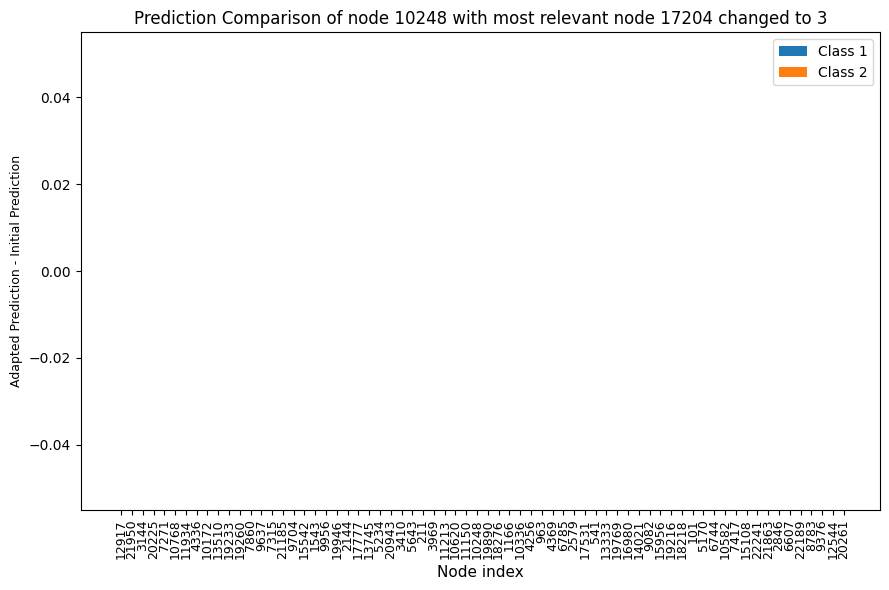

1
pred_after10248adapt_tensor([    0, 17204])_15.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


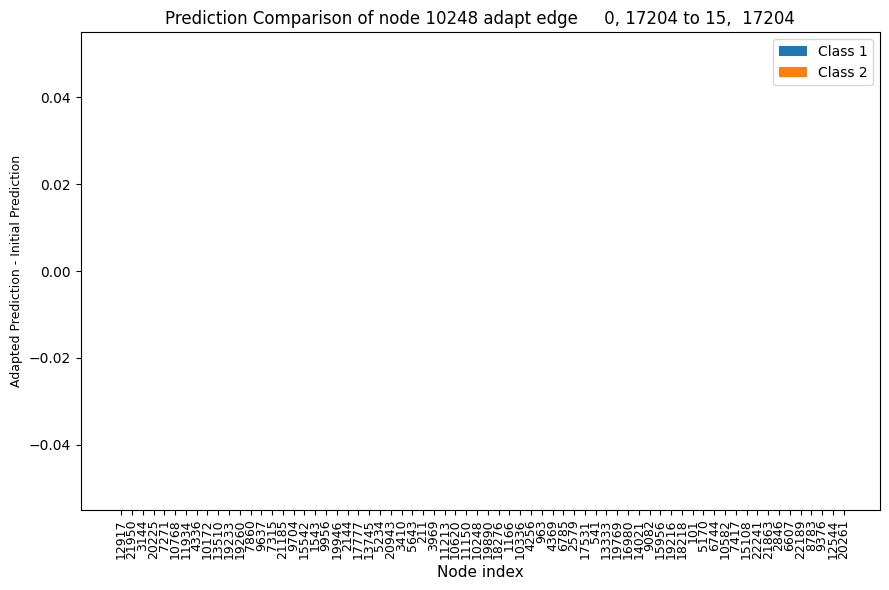

2
pred_after11213adapt_15328_15.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


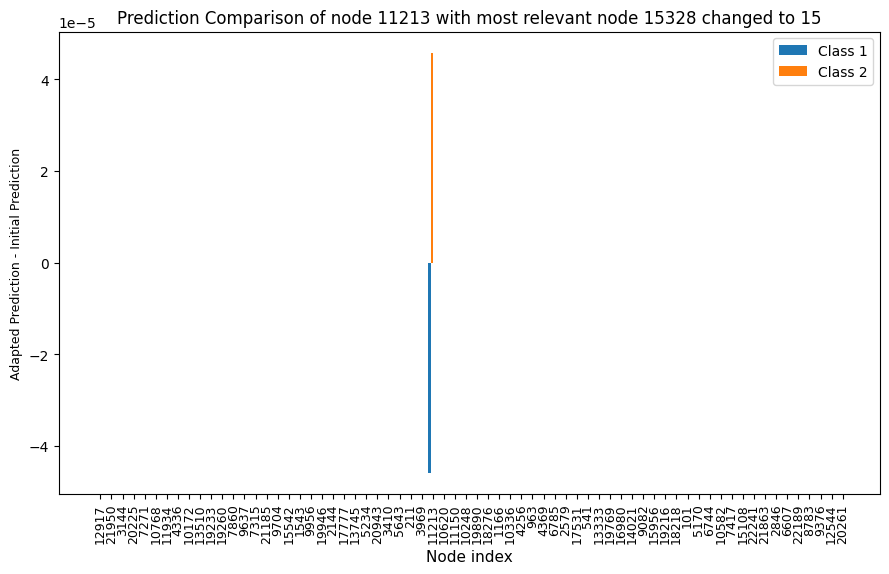

3
pred_after11213adapt_18281_7.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


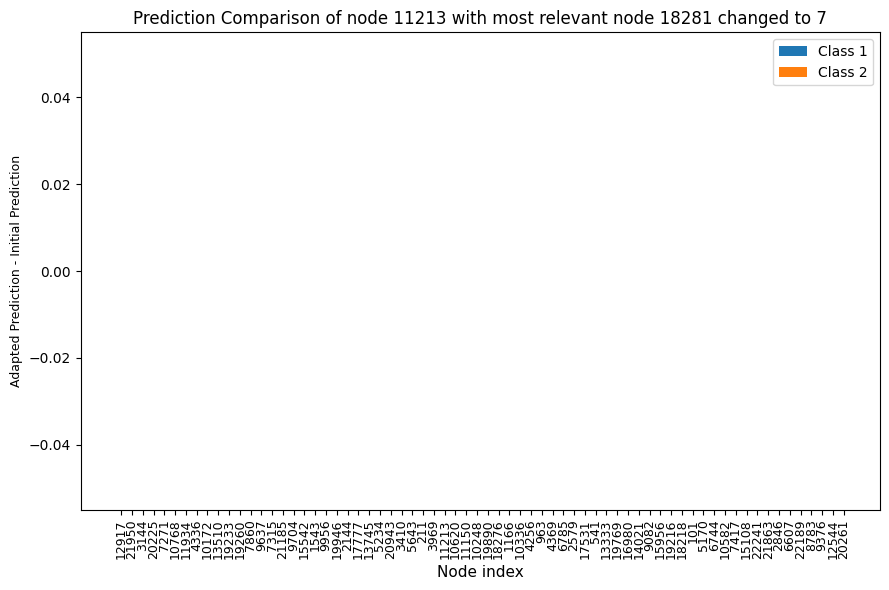

4
pred_after11213adapt_tensor([    0, 18281])_13.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


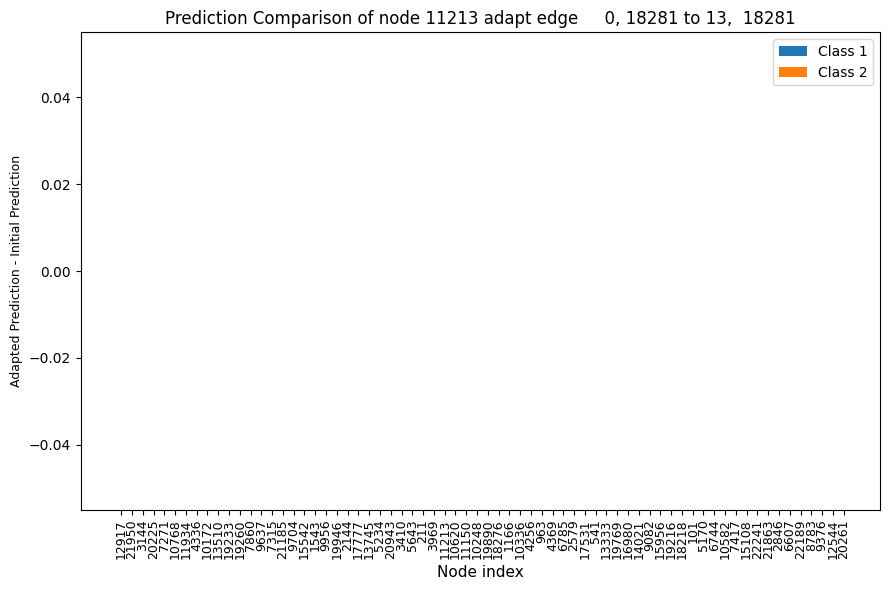

5
pred_after11213adapt_tensor([   18, 15328])_3.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


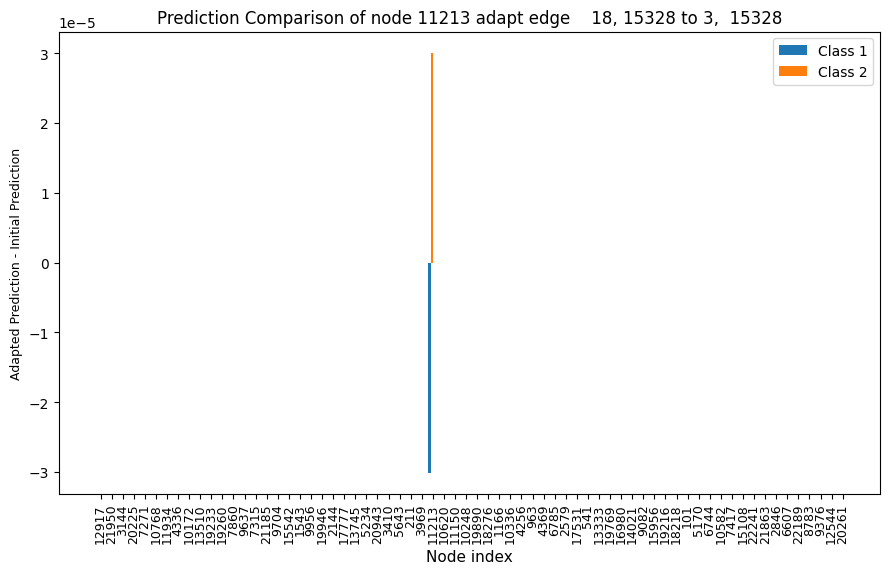

6
pred_after2579adapt_16687_8.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


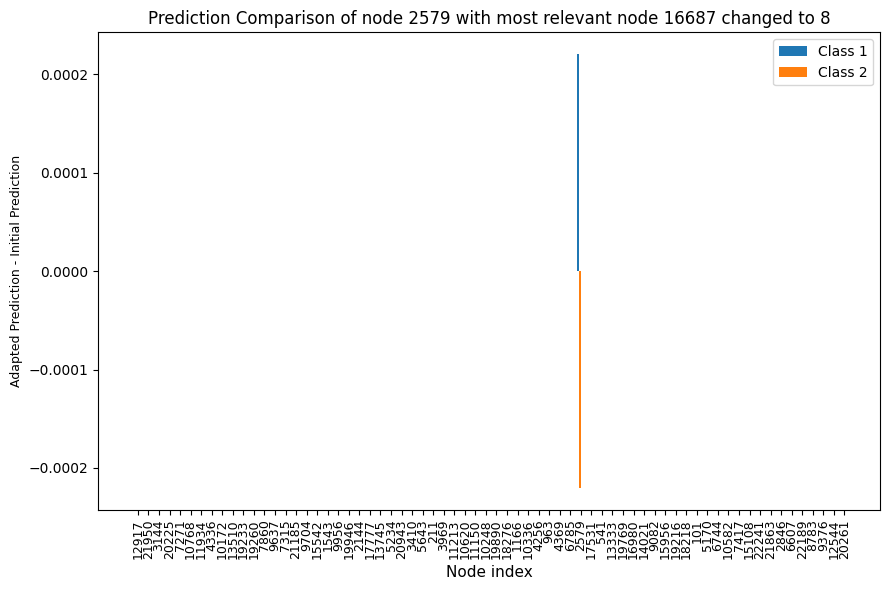

7
pred_after2579adapt_8872_12.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


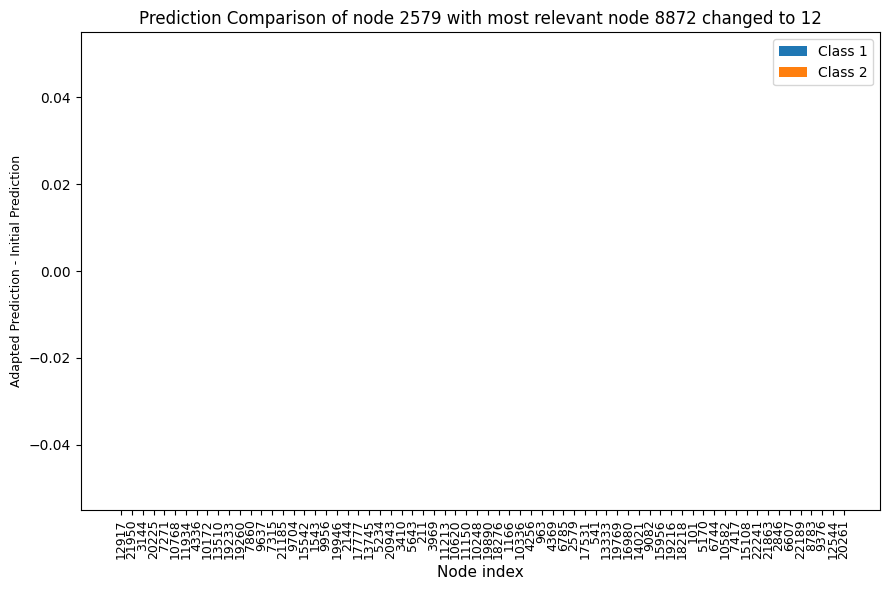

8
pred_after2579adapt_tensor([   0, 8872])_12.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


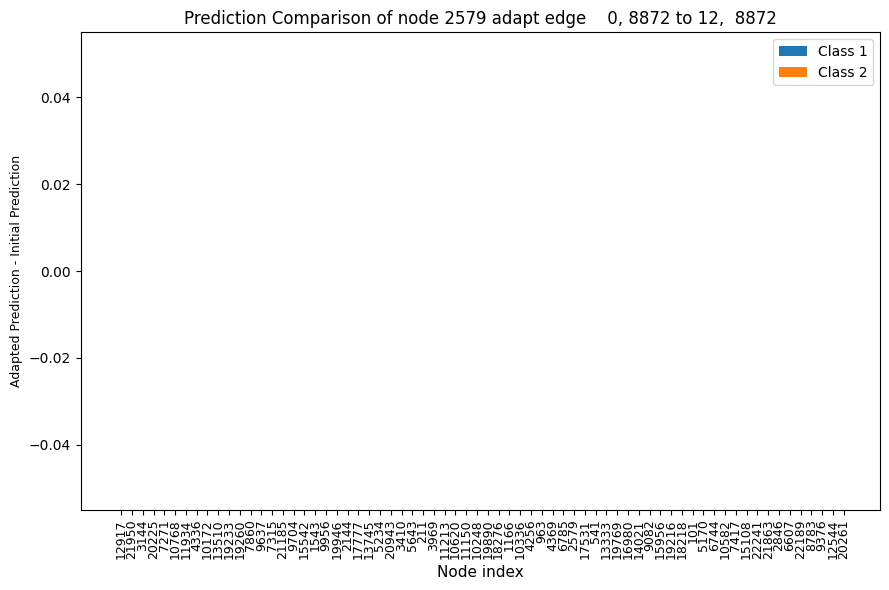

9
pred_after2579adapt_tensor([   18, 16687])_8.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


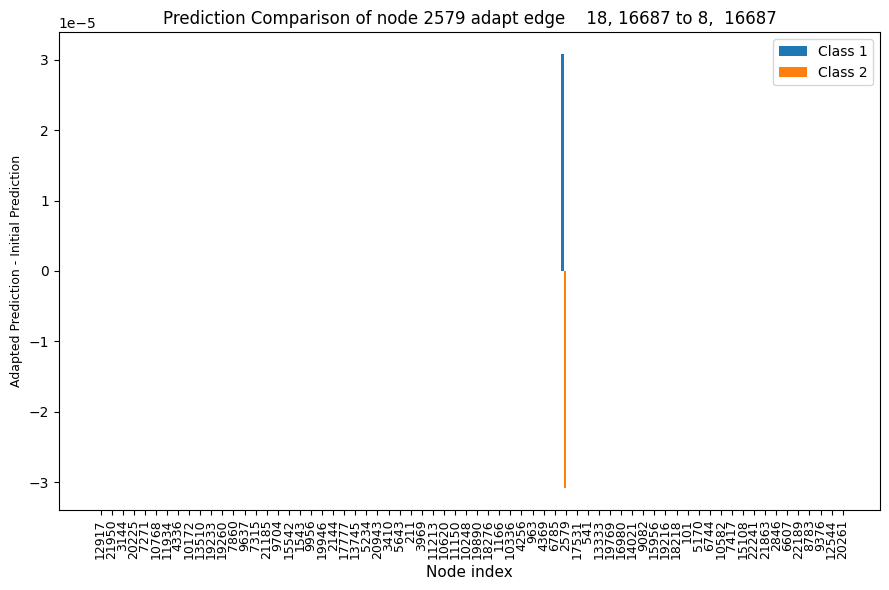

10
pred_after3410adapt_15665_12.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


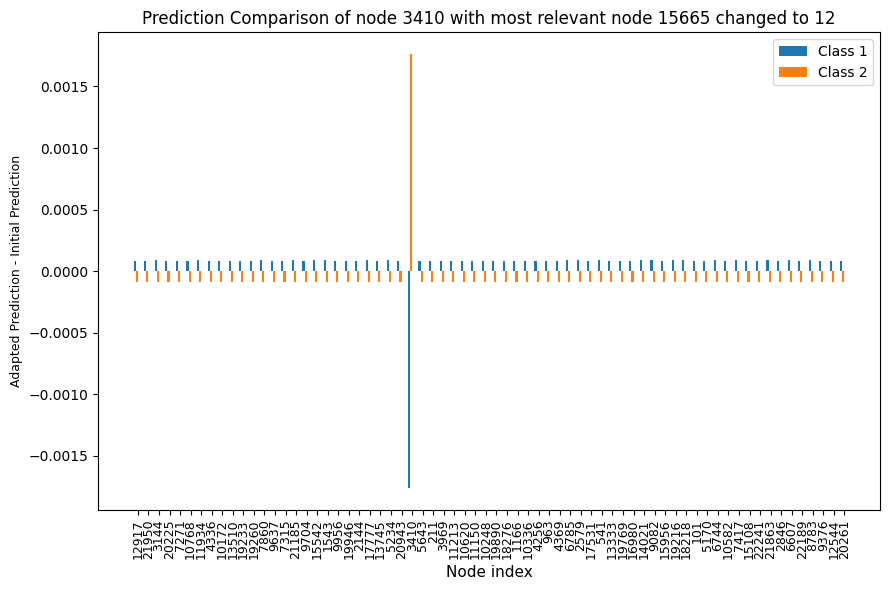

11
pred_after3410adapt_tensor([    0, 15665])_11.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


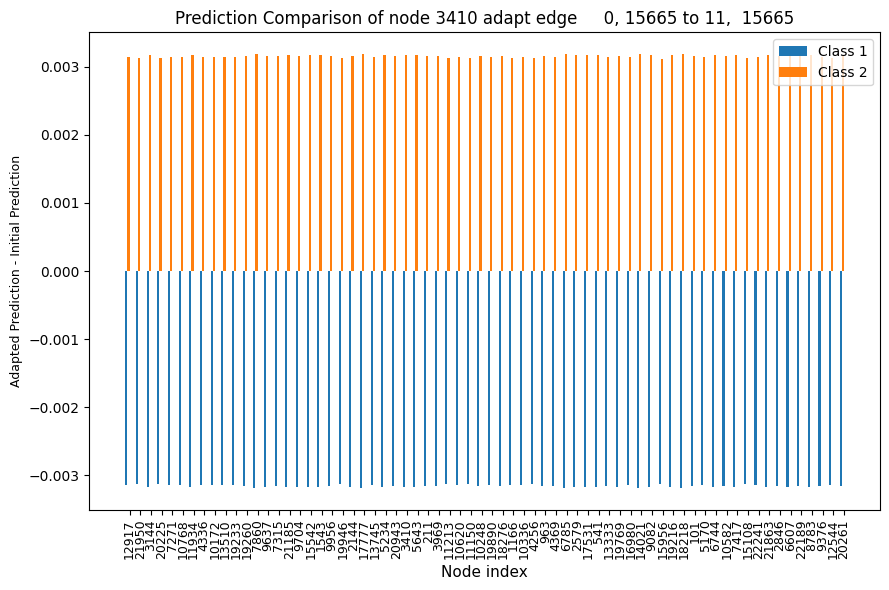

In [53]:
path = 'out/MUTAG/RGCN_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=9)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

# RGCN DistMult

In [55]:
model = 'DistMult'
csv = readallcsvinpath('out/MUTAG/RGCN_emb/')
pred_before = torch.load('out/MUTAG/RGCN_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGCN_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/MUTAG/RGCN_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://dl-learner.org/carcinogenesis#bond3948
12
0
0
0
0
0
0
0
0
0
0
0
0
12 816 0
[]
0.0


(array([0], dtype=int64), array([68], dtype=int64))

12
0
pred_after18218adapt_15665_6.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


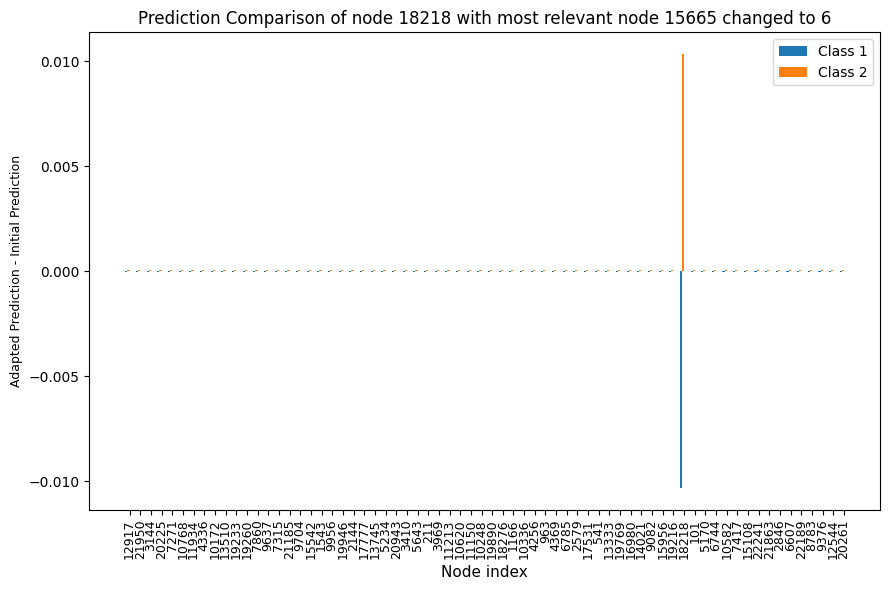

1
pred_after18218adapt_tensor([    0, 15665])_4.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


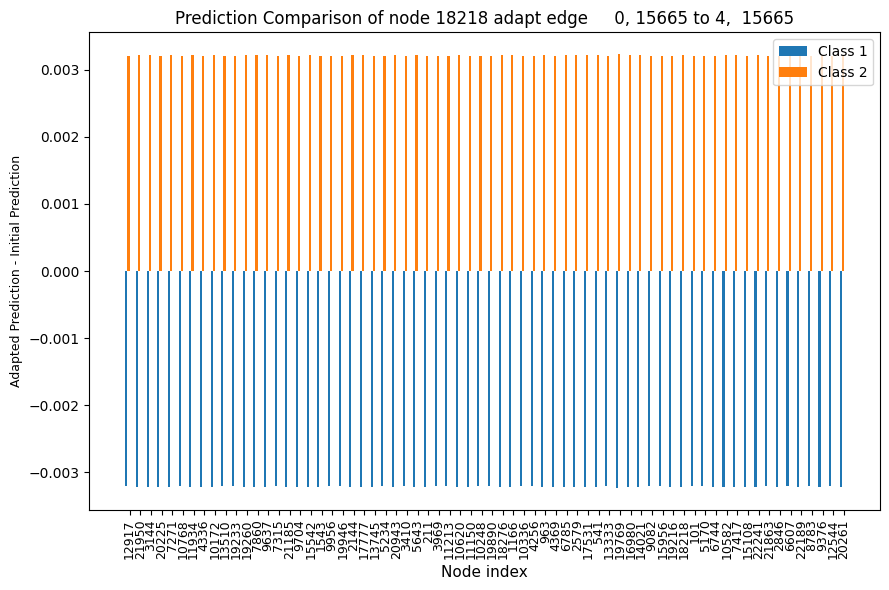

2
pred_after18218adapt_tensor([   18, 18218])_12.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


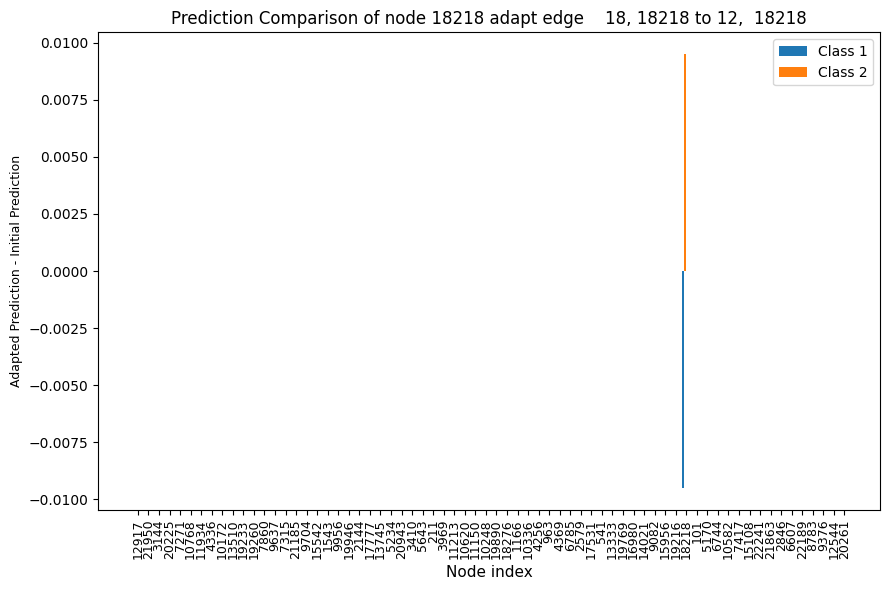

3
pred_after21185adapt_18281_7.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


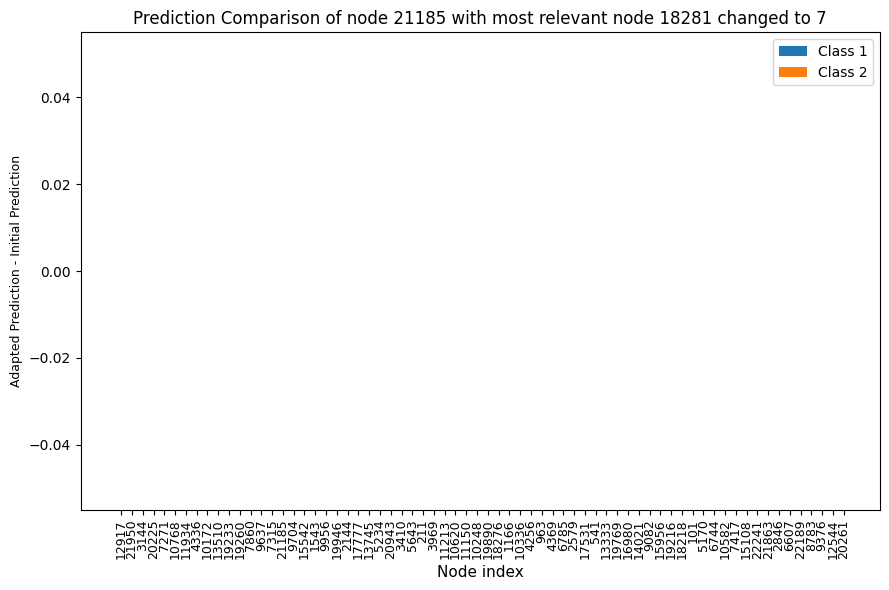

4
pred_after21185adapt_22073_1.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


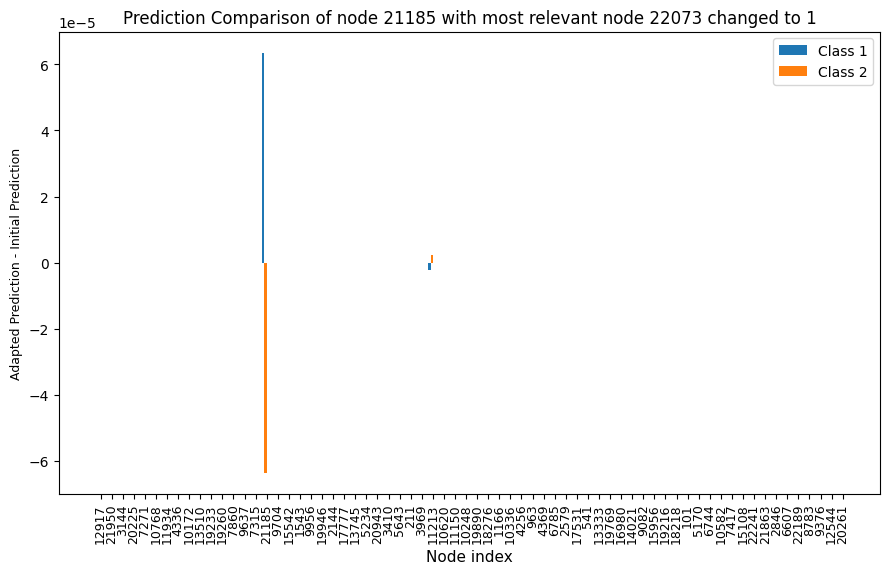

5
pred_after21185adapt_tensor([    0, 18281])_12.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


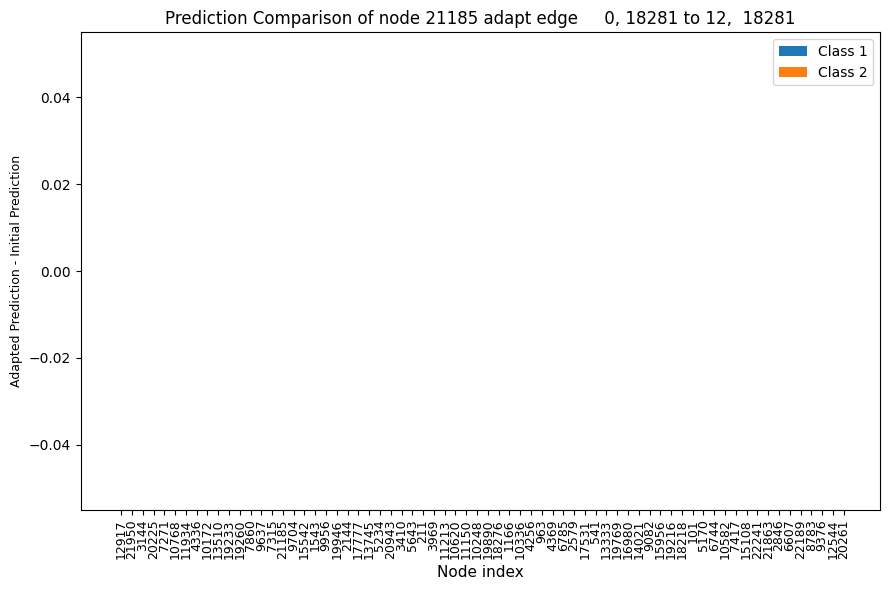

6
pred_after21185adapt_tensor([   18, 22073])_5.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


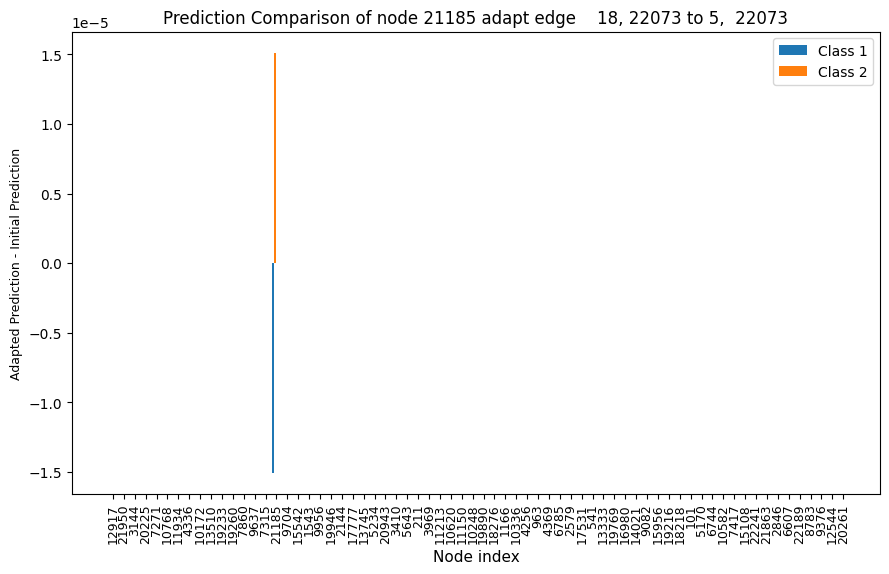

7
pred_after6607adapt_12652_17.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


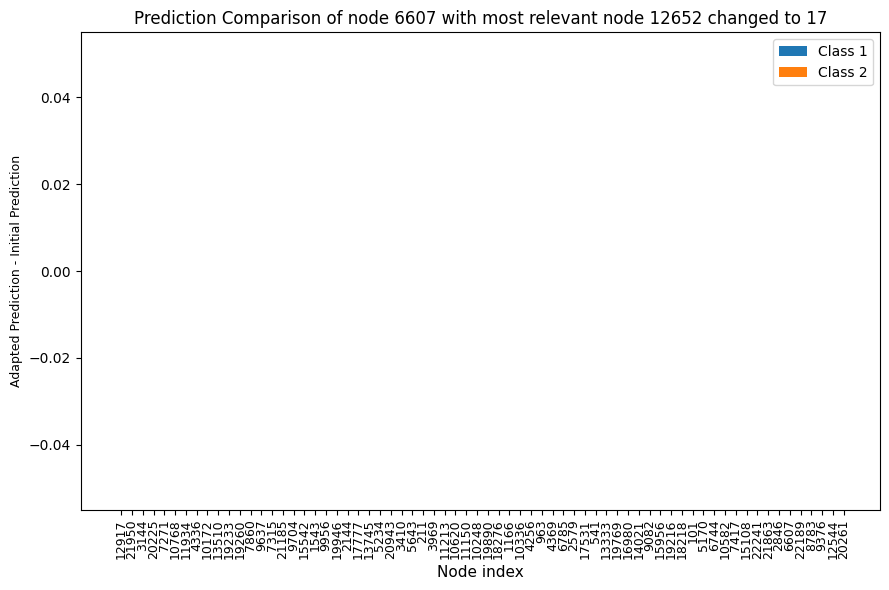

8
pred_after6607adapt_4830_5.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


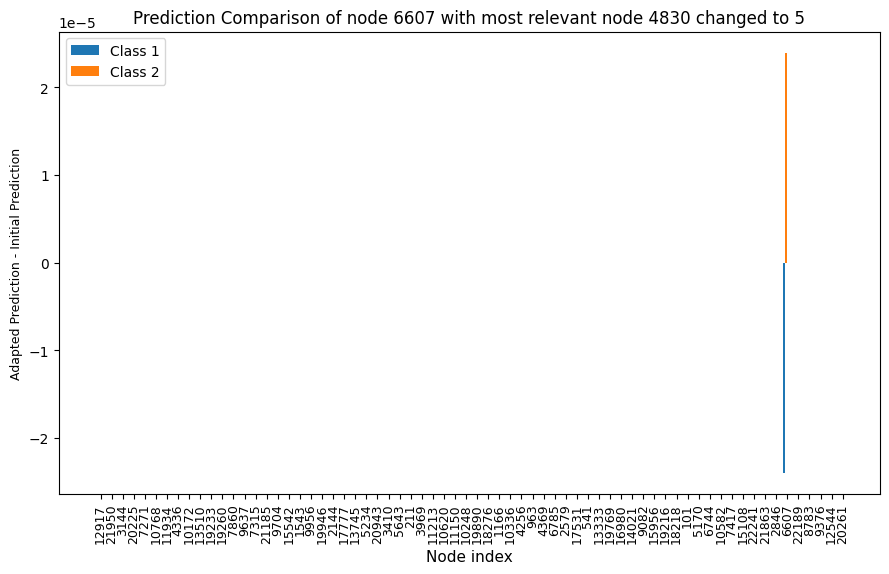

9
pred_after6607adapt_tensor([    0, 12652])_9.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


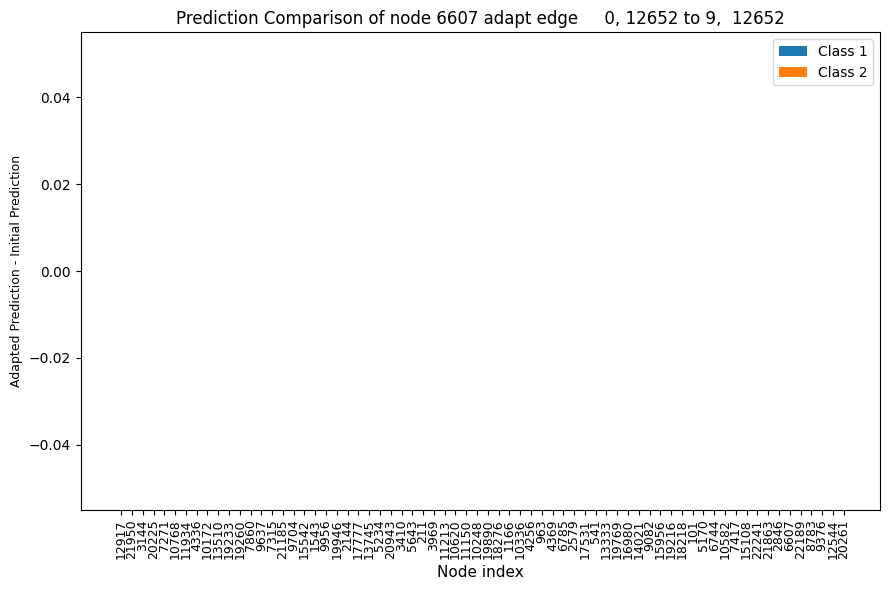

10
pred_after6607adapt_tensor([  18, 4830])_0.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


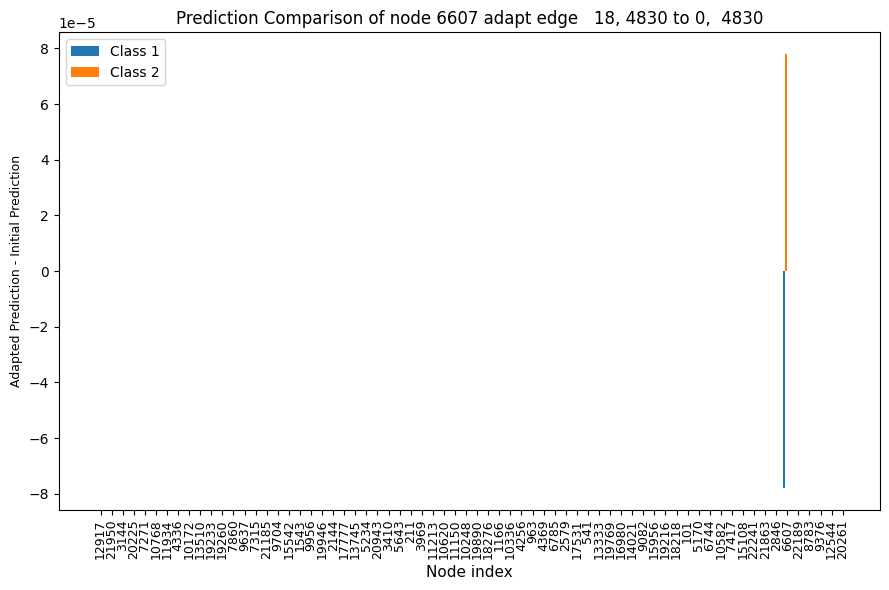

11
pred_after9376adapt_4628_13.pt
(array([0], dtype=int64), array([68], dtype=int64)) (array([0], dtype=int64), array([68], dtype=int64))


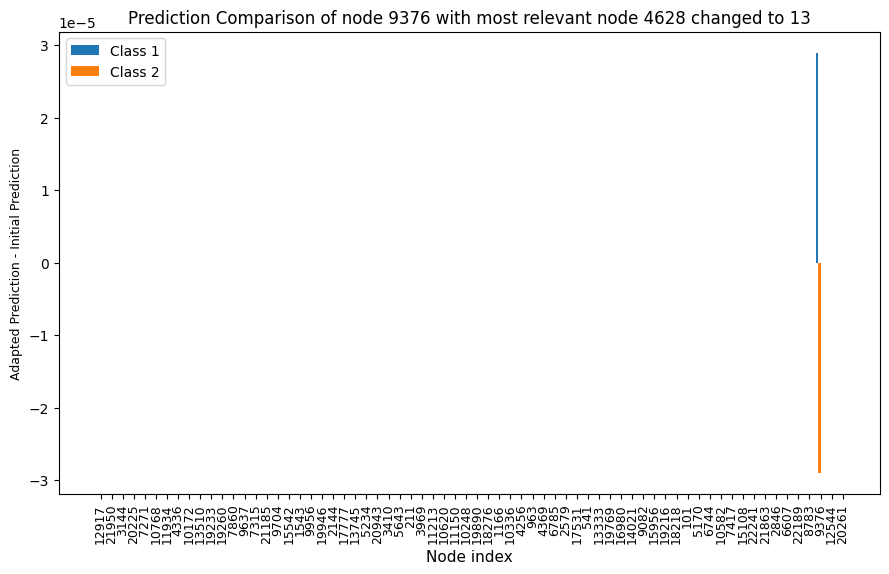

In [56]:
path = 'out/MUTAG/RGCN_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=9)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()